In [1]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import numpy as np

In [2]:
############# Data Preparation ##############

In [93]:
# List of tickers for the 30 companies
# custom_tickers = [
#     "AMZN", "AXP", "AMGN", "AAPL", "BA",
#     "CAT", "CSCO", "CVX", "GS", "HD",
#     "HON", "IBM", "INTC", "JNJ", "KO",
#     "JPM", "MCD", "MMM", "MRK", "MSFT",
#     "NKE", "PG", "TRV", "UNH", "CRM",
#     "VZ", "V", "WMT", "DIS", "DJI"
# ]

#PAST DJIA
custom_tickers = [
    "PG", "JNJ", "XOM", "CVX", "MRK", "PFE", "MCD", "T",
    "VZ", "HPQ", "IBM", "MSFT", "INTC", "HD", "WMT", "TRV",
    "RTX", "BA", "AA", "DD", "CAT", "MMM", "DIS", "JPM", "AXP", "GE",
    "CCEP"
    #"CRJ", "H", "BOA"
]

study_periods = [
    ('2001-01-02', '2004-01-06'),
    ('2004-01-06', '2007-01-02'),
    ('2007-01-02', '2010-01-05'),
    ('2010-01-05', '2013-05-14')
]

def calculate_weekly_returns(df):
    weekly_df = df.resample('W').last()
    weekly_df['close'].fillna(method='ffill', inplace=True)
    weekly_df['returns'] = weekly_df['close'].pct_change().fillna(0)
    return weekly_df

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def data_prep(custom_tickers, study_periods):
    # Fetch data for each ticker
    stock_data = {}
    for ticker in custom_tickers:
        try:
            data = get_data(ticker)
            stock_data[ticker] = data
        except AssertionError as e:
            print(f"No data found for {ticker}: {e}")
    weekly_returns_dict = {}

    for ticker, data in stock_data.items():
        data.index = pd.to_datetime(data.index)

        for period_num, (start_date, end_date) in enumerate(study_periods, start=1):
            period_data = data.loc[start_date:end_date]
            period_returns = calculate_weekly_returns(period_data)
            weekly_returns_dict.setdefault(ticker, {})[f'period_{period_num}'] = period_returns
    period_dfs = {}
    # Iterate over the periods
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        # Initialize an empty dictionary to store data for the current period
        period_data = {}

        # Iterate over each ticker's data
        for ticker, data in weekly_returns_dict.items():
            # Drop NaN values from the 'close' column for the current period
            close_prices = data[period][['returns']].dropna()
            period_data[ticker] = close_prices

        # Concatenate the data for all tickers into a single DataFrame for the current period
        period_df = pd.concat(period_data, axis=1)
        period_dfs[period] = period_df.dropna(axis=1)
    correlation_matrices = {}
    for period, period_df in period_dfs.items():
        # Calculate correlation matrix for the current period and store it in the dictionary
        correlation_matrices[period] = period_df.corr()
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)
    return period_dfs, correlation_matrices, distance_matrices

In [4]:
period_dfs, correlation_matrices, distance_matrices = data_prep(custom_tickers, study_periods)

In [6]:
############# Random Selection ##############

In [7]:
def calculate_metrics_for_random_selection(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 100
 
    for period, returns_data in period_dfs.items():
        returns_data = returns_data.droplevel(1, axis=1)
        results_by_stocks = {}
        stocks_length_list = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlation = []
            selected_stocks_list = {}
            
            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks
               
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                
                mean_std = (portfolio_return_stocks).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            #stocks_length_list[period] = selected_stocks_list
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]
            
            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

num_stocks_list = [2, 4, 8]
result_df_random = calculate_metrics_for_random_selection(period_dfs, num_stocks_list)
result_df_random

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.018546,0.037898,0.059831,0.466376,"[VZ, IBM, MCD, DIS, XOM, WMT, RTX, TRV, CCEP, ..."
period_1 (4 stocks),0.030489,0.033964,0.101127,0.280712,"[HPQ, RTX, CCEP, BA, MMM, JPM, CAT, DIS, T, DD..."
period_1 (8 stocks),0.035390,0.030121,0.116328,0.354191,"[TRV, HPQ, AA, PG, JNJ, CCEP, MMM, HD, MMM, IB..."
period_2 (2 stocks),0.293880,0.021246,1.427647,0.288200,"[CVX, AXP, BA, TRV, CAT, HPQ, MCD, JNJ, INTC, ..."
period_2 (4 stocks),0.242541,0.018083,1.416527,0.234309,"[DD, PG, CCEP, HPQ, MSFT, HD, RTX, PFE, PFE, M..."
period_2 (8 stocks),0.240359,0.015799,1.534171,0.281316,"[JNJ, BA, AXP, MRK, PG, T, GE, MCD, MCD, TRV, ..."
period_3 (2 stocks),-0.005969,0.042695,0.018838,0.474917,"[MCD, TRV, DIS, DD, INTC, MMM, PFE, TRV, PFE, ..."
period_3 (4 stocks),0.001545,0.039142,0.019498,0.561264,"[PG, DIS, INTC, VZ, JPM, T, IBM, CCEP, VZ, BA,..."
period_3 (8 stocks),0.010211,0.037465,0.032721,0.500606,"[INTC, HD, PFE, AA, CVX, HPQ, MSFT, IBM, MRK, ..."
period_4 (2 stocks),0.437976,0.026973,1.741000,0.434582,"[PG, CCEP, AXP, JNJ, MMM, T, BA, DIS, XOM, JPM..."


In [8]:
############# HCT ##############

In [9]:
import numpy as np
from scipy.cluster.hierarchy import average, fcluster, linkage
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Function to perform hierarchical clustering and print stocks in each cluster
def hierarchical_clustering(distance_matrix, labels, period):
#    linkage_matrix = average(distance_matrix)
    linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
    labels = [label[0] for label in labels]

    # Set the figure size to be larger
    plt.figure(figsize=(12, 8))  # Adjust the size as needed

    # Plot the dendrogram
    dendrogram(average(distance_matrix), labels=labels, orientation='top')

    # Customize plot title and axis labels
    plt.title(f'Hierarchical Clustering Dendrogram - {period}')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')

    # Create dictionary to store stocks in each cluster for 2, 4, and 8 clusters
    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}
    
    # Perform clustering to get cluster labels for 2, 4, and 8 clusters
    for num_clusters in [2, 4, 8]:
        cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
        
        # Assign stocks to clusters
        for stock, cluster_label in zip(labels, cluster_labels):
            if cluster_label not in cluster_stocks[num_clusters]:
                cluster_stocks[num_clusters][cluster_label] = [stock]
            else:
                cluster_stocks[num_clusters][cluster_label].append(stock)

    # Show the plot
    plt.show()
    
    return cluster_stocks

def HCT(distance_matrices):
    # Create a dictionary to store cluster stocks for each period
    all_cluster_stocks_HCT = {}
    # Perform hierarchical clustering and plot dendrogram for each study period
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks_HCT[period] = hierarchical_clustering(distance_matrix.values, distance_matrix.index, period)
    return all_cluster_stocks_HCT

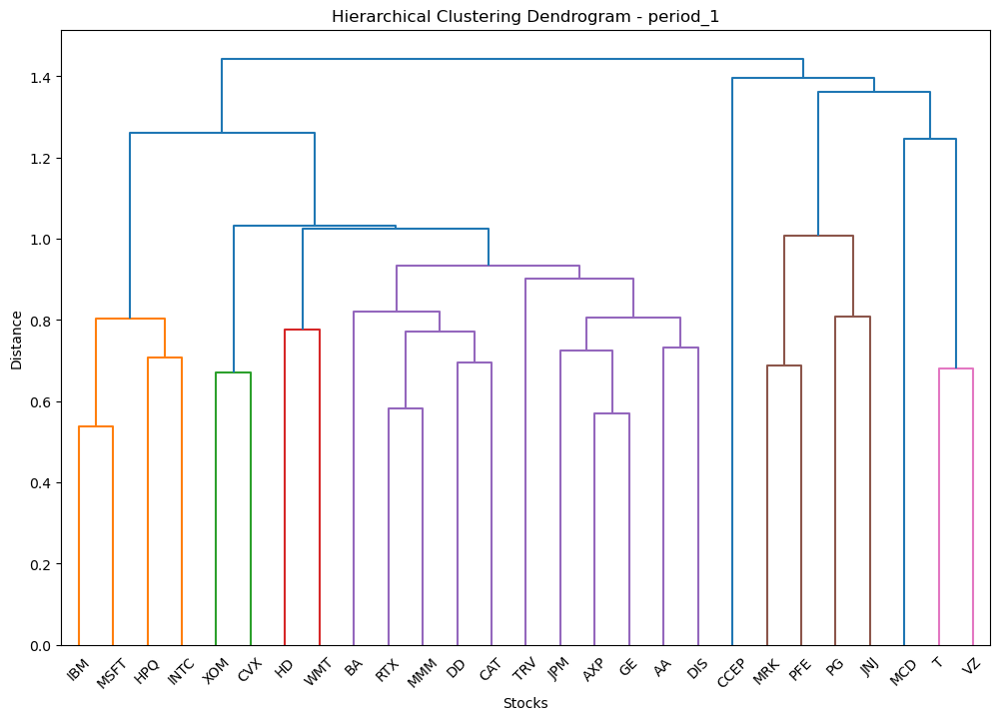

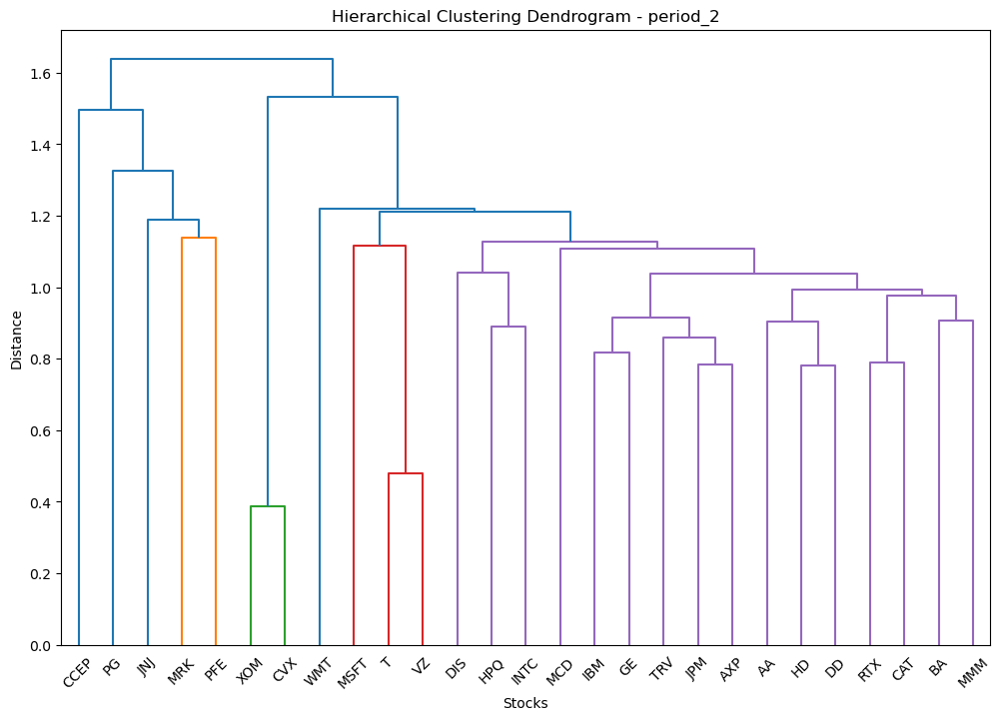

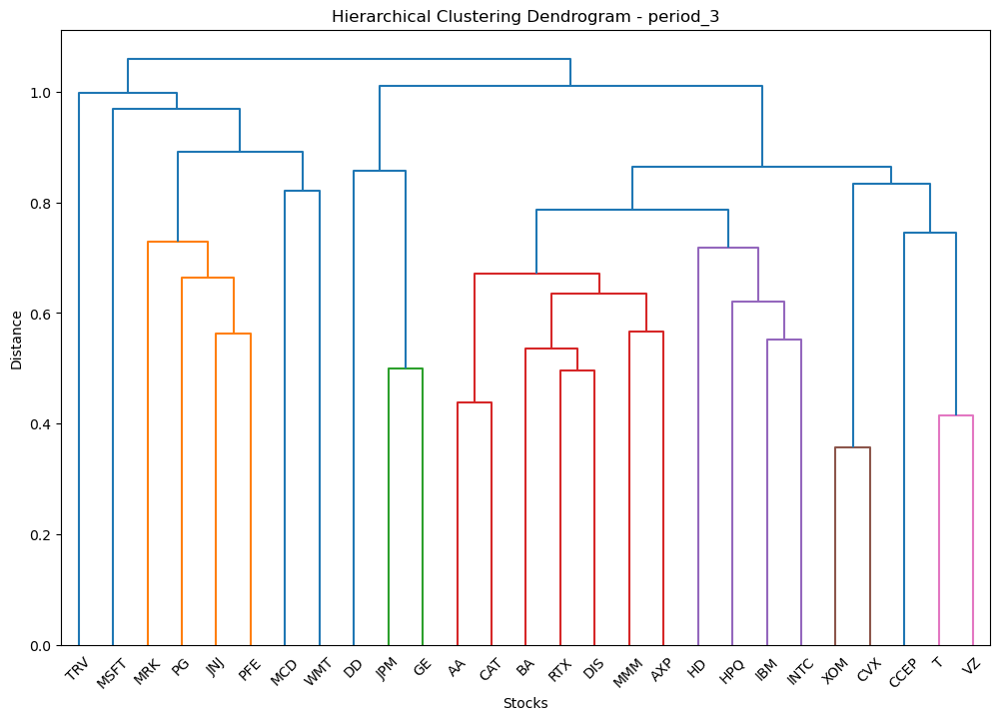

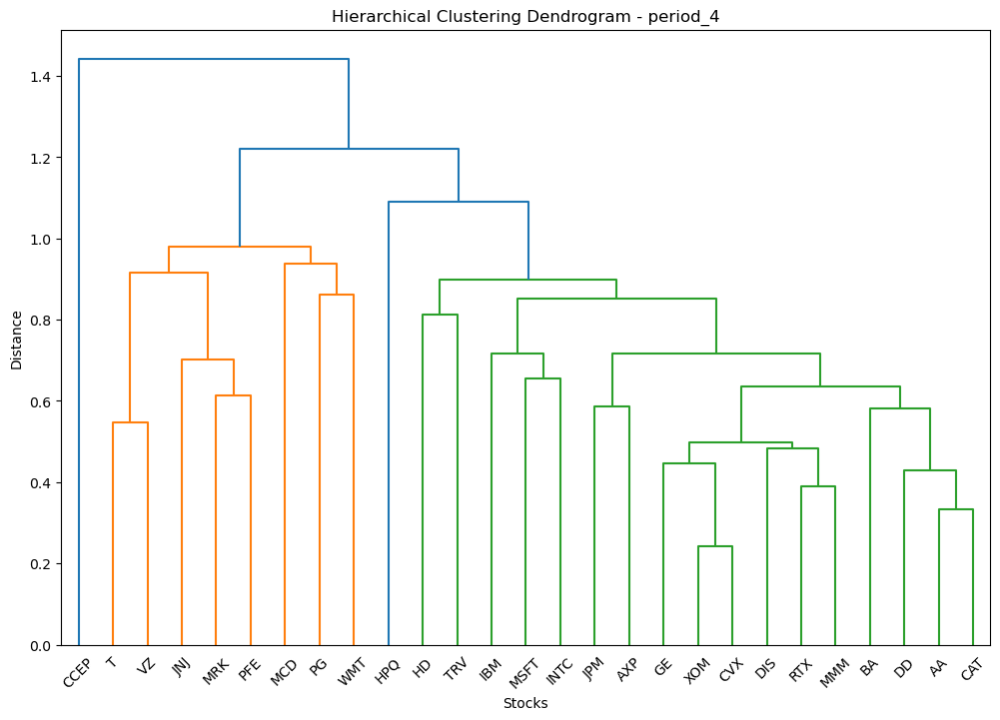

In [10]:
all_cluster_stocks_HCT = HCT(correlation_matrices)

In [11]:
import pandas as pd
import numpy as np

def calculate_metrics_for_all_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100

    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                #print(returns_data[selected_stocks].std())
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [12]:
result_df_HCT = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT, period_dfs)
result_df_HCT

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.005139,0.035379,0.006285,0.491130,"[JNJ, IBM, JNJ, HD, VZ, INTC, PG, RTX, JNJ, DI..."
period_1 (4 stocks),0.005067,0.031341,0.026775,0.192774,"[PFE, BA, CCEP, HPQ, JNJ, HD, T, MSFT, MRK, JP..."
period_1 (8 stocks),0.017713,0.027557,0.068166,0.276708,"[MRK, HD, MCD, T, MSFT, GE, DD, CCEP, PFE, XOM..."
period_2 (2 stocks),0.292653,0.020657,1.475020,0.108184,"[MRK, MMM, CVX, IBM, CCEP, WMT, PFE, INTC, CVX..."
period_2 (4 stocks),0.329955,0.016968,2.014576,0.110228,"[PFE, CVX, DIS, AXP, MRK, XOM, TRV, INTC, PFE,..."
period_2 (8 stocks),0.269633,0.013560,2.007424,0.134965,"[PG, PFE, XOM, WMT, T, IBM, CAT, CCEP, PG, PFE..."
period_3 (2 stocks),-0.012967,0.043428,0.002824,0.499622,"[MCD, DD, PFE, AXP, WMT, RTX, MCD, HPQ, PFE, H..."
period_3 (4 stocks),-0.018105,0.041061,-0.046634,0.485805,"[MSFT, VZ, CCEP, JPM, MCD, T, CAT, JPM, JNJ, C..."
period_3 (8 stocks),0.022568,0.035284,0.063825,0.466435,"[PG, CVX, MCD, VZ, HD, TRV, CAT, GE, JNJ, CVX,..."
period_4 (2 stocks),0.472491,0.024590,2.018832,0.300374,"[MCD, IBM, MCD, DD, MCD, DD, MCD, HPQ, CCEP, H..."


In [13]:
############# KMEANS ##############

In [14]:
from sklearn.cluster import KMeans
import numpy as np

In [15]:
periods = ['period_1','period_2','period_3','period_4']

In [16]:
# Function to perform K-means clustering
def kmeans_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict(data)
    centroid_vectors = kmeans.cluster_centers_
    return cluster_labels, centroid_vectors

In [98]:
def generate_clusters_and_centroids(periods, distance_matrices, tickers):
    stocks = tickers
    all_cluster_stocks_kmeans = {}
    all_centroid_vectors = {}

    for period in periods:
        X = distance_matrices[period]
        
        clusters_for_period = {}
        centroid_vectors_for_period = {}
        
        for size in ['2', '4', '8']:  # Using strings instead of integers
            cluster_labels, centroid_vectors = kmeans_clustering(X, num_clusters=int(size))  # Convert size to integer
            clusters = {}
            centroid_dict = {}
            
            for cluster_num in range(int(size)):  # Convert size to integer
                clusters[str(cluster_num + 1)] = []  # Convert cluster_num to string
                centroid_dict[str(cluster_num + 1)] = [centroid_vectors[cluster_num]]  # Store centroid vector as a list
                
            for idx, label in enumerate(cluster_labels):
                clusters[str(label + 1)].append(stocks[idx])  # Convert label to string
            
            clusters_for_period[size] = clusters
            centroid_vectors_for_period[size] = centroid_dict
        
        all_cluster_stocks_kmeans[period] = clusters_for_period
        all_centroid_vectors[period] = centroid_vectors_for_period

    return all_cluster_stocks_kmeans, all_centroid_vectors

all_cluster_stocks_kmeans, centroid_vectors = generate_clusters_and_centroids(periods, distance_matrices, custom_tickers)

/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warning

In [18]:
result_df_kmeans_rand = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.028860,0.035365,-0.052242,0.216818,"[RTX, CCEP, CVX, CCEP, WMT, PG, IBM, VZ, DD, V..."
period_1 (4 stocks),0.031643,0.032727,0.115026,0.284466,"[PFE, INTC, MCD, GE, CVX, HPQ, VZ, HD, MRK, IB..."
period_1 (8 stocks),0.052284,0.028137,0.190824,0.305788,"[MCD, DD, INTC, MRK, GE, CCEP, CVX, WMT, MCD, ..."
period_2 (2 stocks),0.242349,0.020830,1.252927,0.258685,"[JNJ, GE, PFE, GE, MRK, T, CCEP, MCD, PG, VZ, ..."
period_2 (4 stocks),0.312972,0.016797,1.917926,0.169467,"[XOM, TRV, INTC, CCEP, XOM, MCD, HPQ, PG, XOM,..."
period_2 (8 stocks),0.242320,0.015224,1.604096,0.176899,"[RTX, XOM, PG, CCEP, DD, INTC, JPM, VZ, AXP, X..."
period_3 (2 stocks),-0.030360,0.043041,-0.055293,0.447933,"[MSFT, JPM, MRK, HD, MSFT, DD, CVX, HD, MRK, D..."
period_3 (4 stocks),0.018877,0.041472,0.045844,0.556158,"[IBM, DD, JNJ, DIS, IBM, DD, JNJ, XOM, IBM, JP..."
period_3 (8 stocks),0.036765,0.034852,0.104309,0.463859,"[DIS, MSFT, T, JPM, PFE, MCD, CVX, TRV, BA, IB..."
period_4 (2 stocks),0.485029,0.024158,2.084432,0.564402,"[INTC, PFE, JPM, T, HD, T, HD, T, MSFT, TRV, M..."


In [105]:
def calculate_metrics_for_kmeans(all_cluster_stocks, period_dfs, centroid_vectors,distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        stocks_by_cluster = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[period][str(num_clusters)]
                distance_matrix = distance_matrices[period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : [selected_stocks]}

        results_by_period[period] = results_by_cluster
        stocks_by_period[period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [106]:
result_df_kmeans, stocks_by_period_kmeans = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)

In [21]:
result_df_kmeans

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.213123,0.030766,-0.692727,0.263464,"[WMT, MRK]"
period_1 (4 stocks),-0.130002,0.034259,-0.379473,0.338310,"[WMT, HPQ, MCD, GE]"
period_1 (8 stocks),-0.041584,0.029096,-0.142921,0.332000,"[MCD, AA, HPQ, MRK, GE, CCEP, XOM, WMT]"
period_2 (2 stocks),0.007040,0.023190,0.030360,0.185491,"[PFE, TRV]"
period_2 (4 stocks),0.065403,0.020853,0.313635,0.261546,"[XOM, TRV, INTC, PFE]"
period_2 (8 stocks),0.238262,0.016220,1.468924,0.243361,"[AXP, XOM, PFE, CCEP, CAT, TRV, MMM, VZ]"
period_3 (2 stocks),0.046926,0.045737,0.102600,0.633582,"[CCEP, DIS]"
period_3 (4 stocks),-0.058285,0.044946,-0.129679,0.515836,"[INTC, AXP, PFE, CCEP]"
period_3 (8 stocks),0.057803,0.037652,0.153517,0.504983,"[DIS, CCEP, INTC, AXP, PFE, MCD, CVX, TRV]"
period_4 (2 stocks),0.991680,0.025792,3.844910,0.547225,"[DIS, TRV]"


In [22]:
############# MST ##############

In [23]:
# ADD MST clustering here
# Output of MST function should be a dictionary like all_cluster_stocks_MST

In [24]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

In [25]:
############# Plots and Diagrams ##############

In [147]:
def count_of_stocks(result_df_clusters,custom_tickers):
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers, columns=[period])

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers
        total_counts = counts_df.sum(axis=1)

        # Get the top 8 stocks and group the rest into "Other"
        top_8 = total_counts.nlargest(8)
        other = pd.Series(total_counts.sum() - top_8.sum(), index=["Other"])

        # Concatenate the top 8 and "Other"
        final_counts = pd.concat([top_8, other])

        # Plot the pie chart for the current period
        plt.figure(figsize=(8, 8))
        plt.pie(final_counts, labels=final_counts.index, autopct='%1.1f%%', startangle=140)
        plt.axis('equal')
        plt.title(f'Top 8 Stocks - {period}')
        plt.show()
        total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Plot the pie chart for all periods combined
    plt.figure(figsize=(8, 8))
    plt.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title('All Stocks - All Periods Combined')
    plt.show()

    ################################################################################################
    total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Sort the total counts in descending order
    total_counts_sorted = total_counts.sort_values(ascending=False)

    # Plot the bar chart for all periods combined
    plt.figure(figsize=(10, 6))
    total_counts_sorted.plot(kind='bar')
    plt.xlabel('Stock')
    plt.ylabel('Count')
    plt.title('Total Counts of Each Stock Across All Periods')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

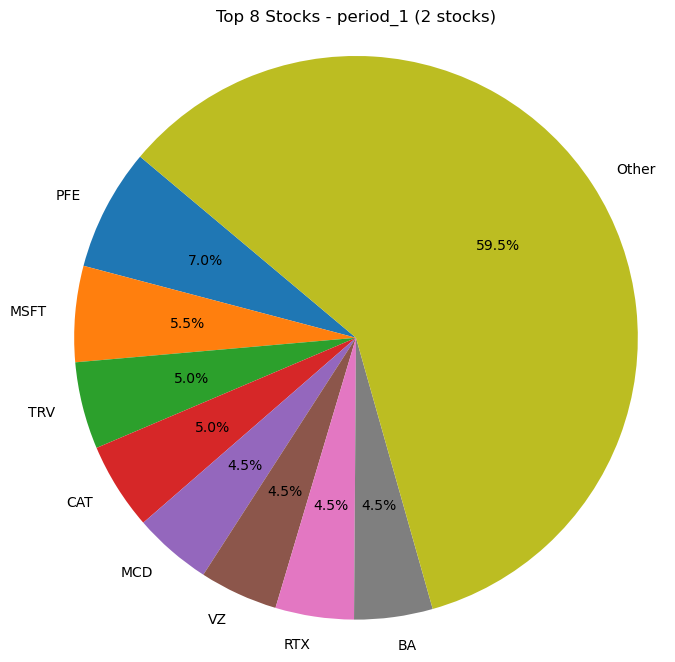

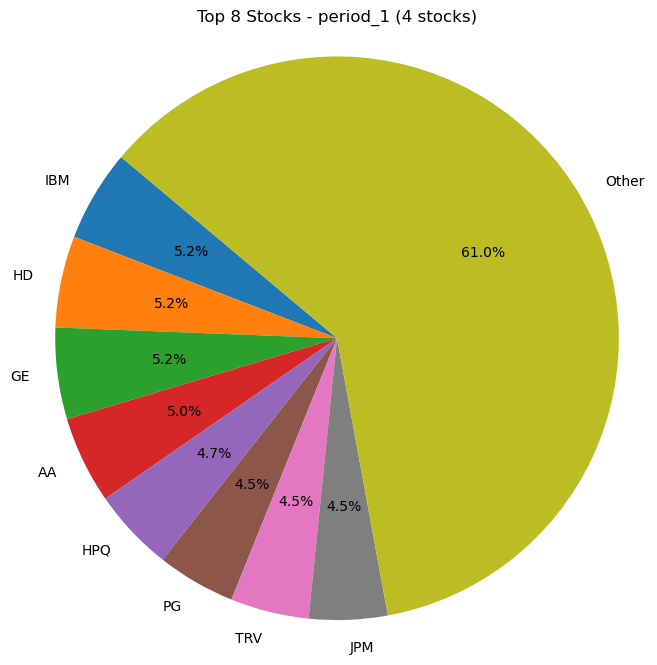

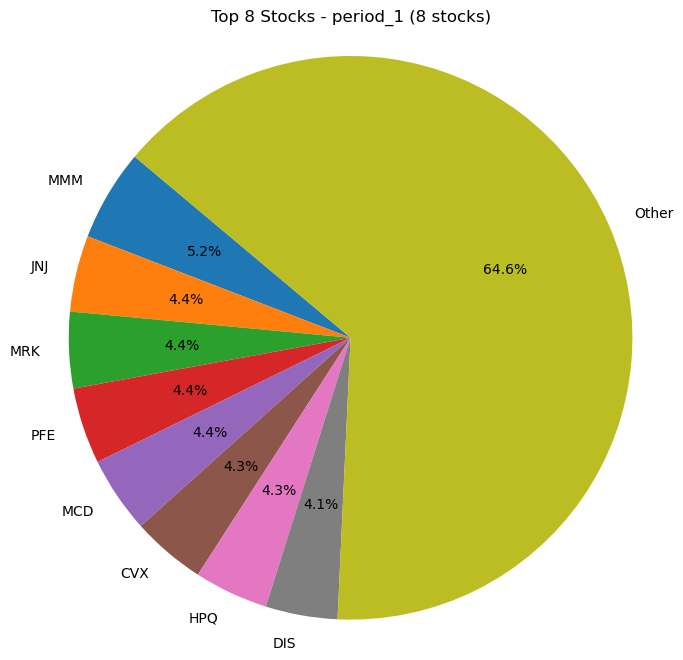

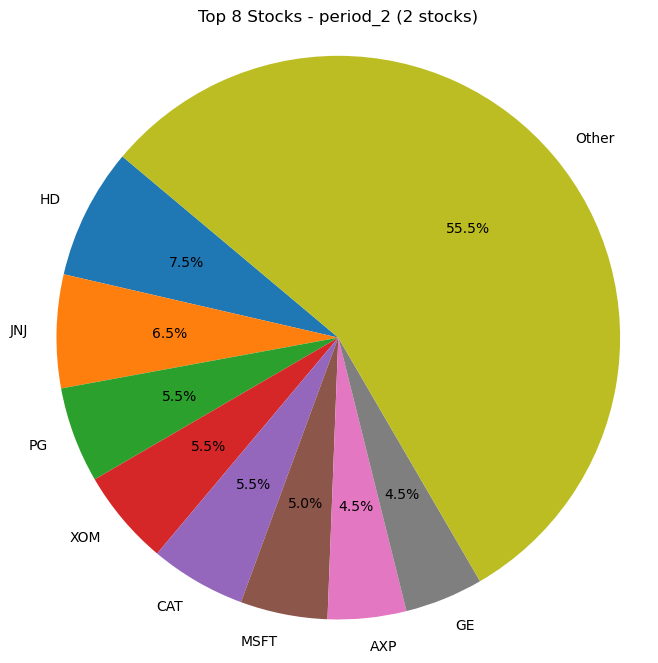

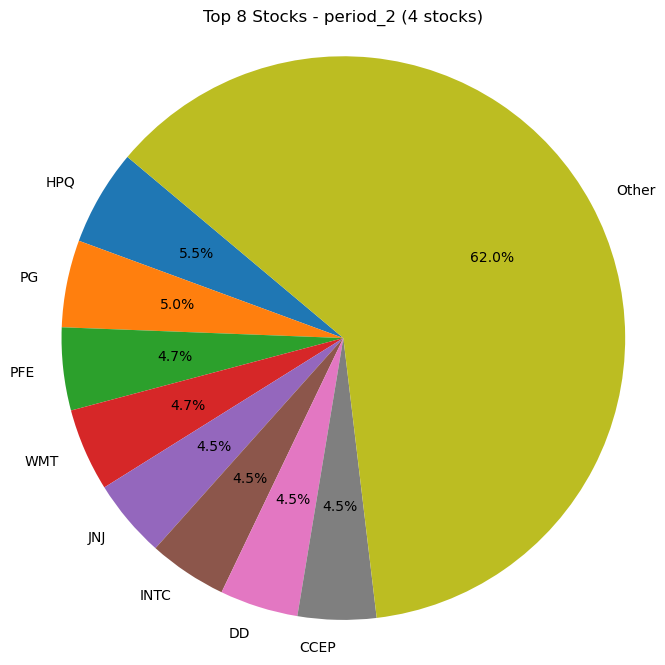

...

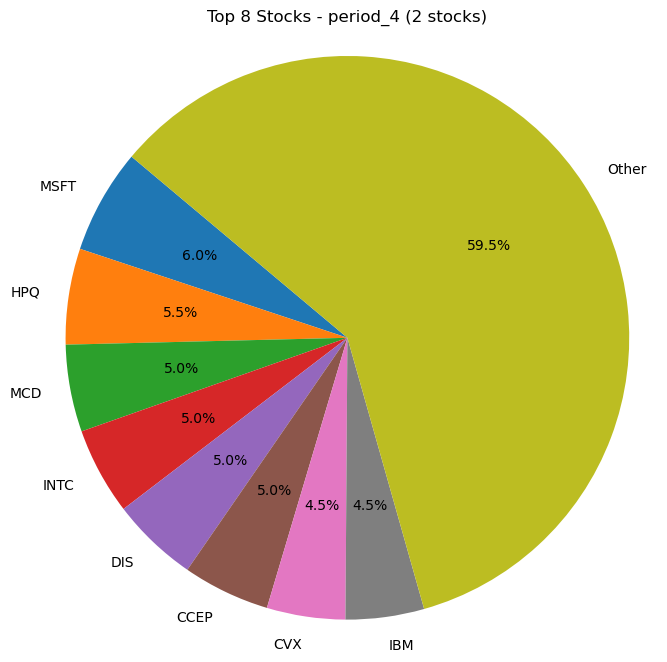

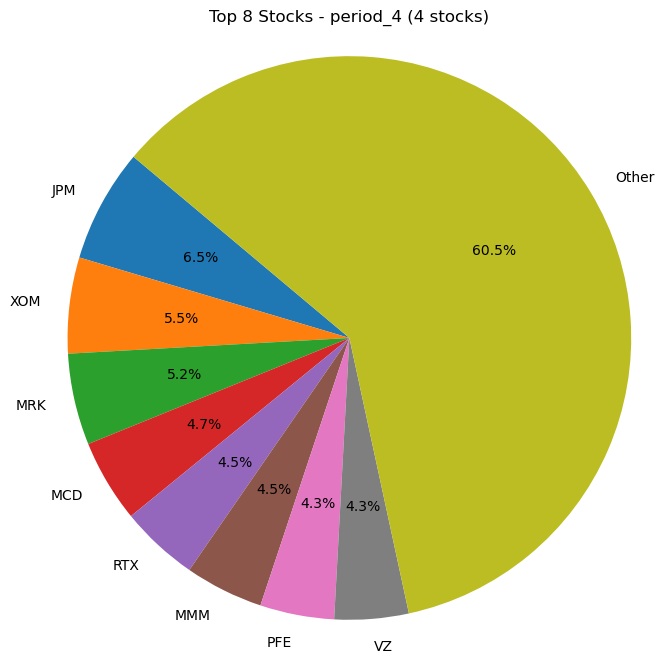

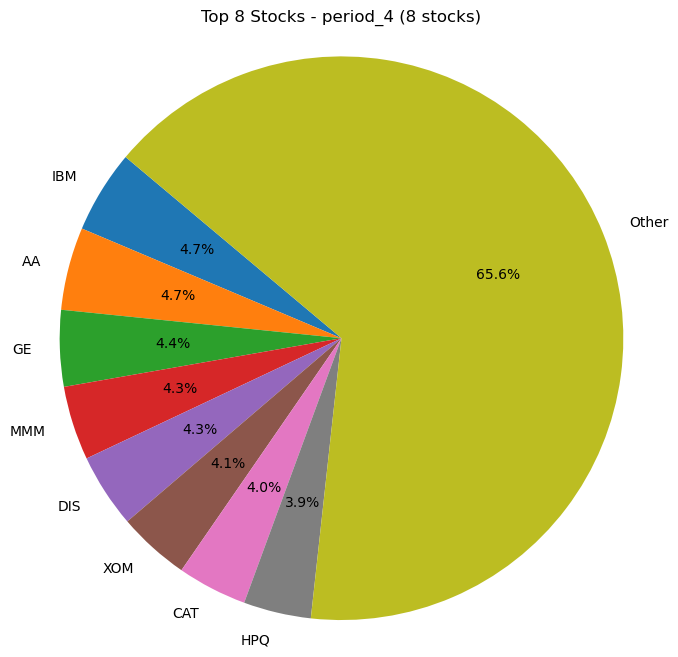

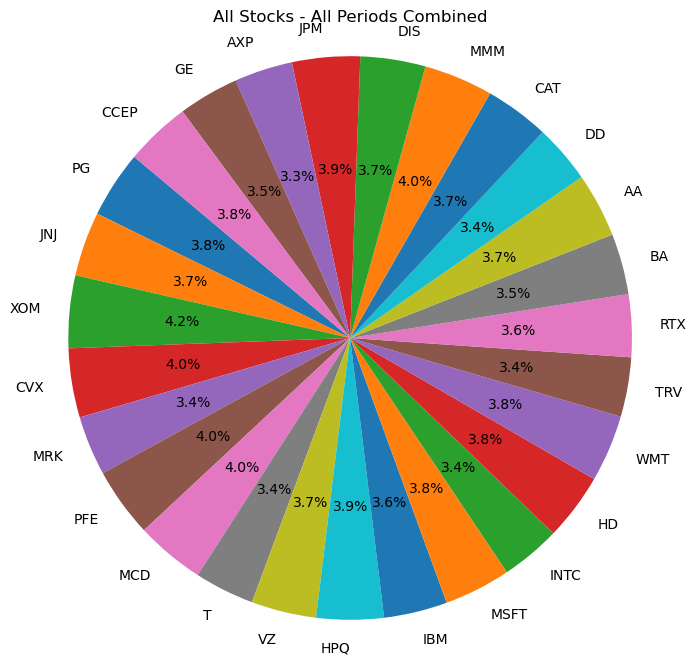

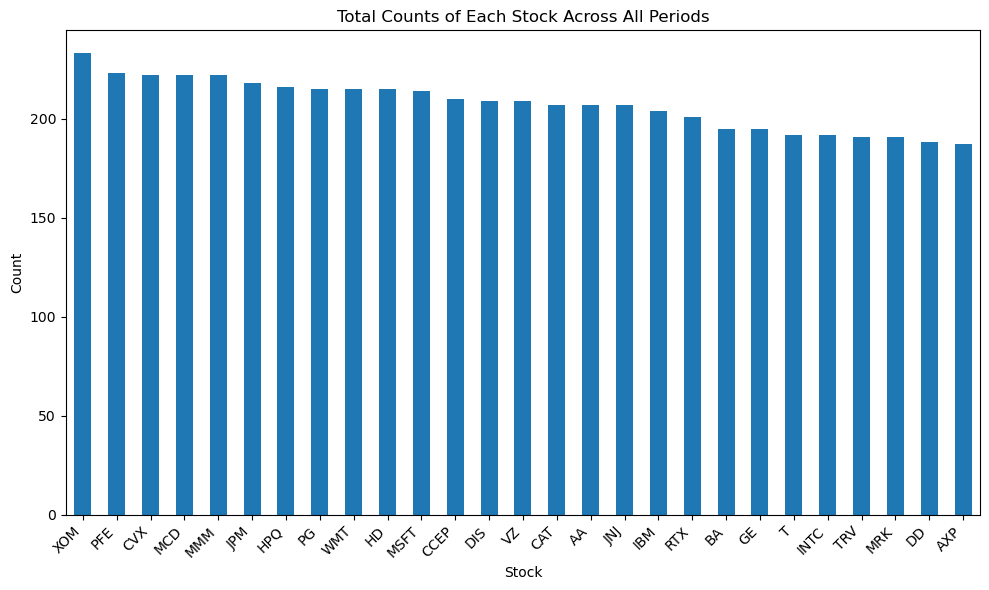

In [148]:
count_of_stocks(result_df_random,custom_tickers)

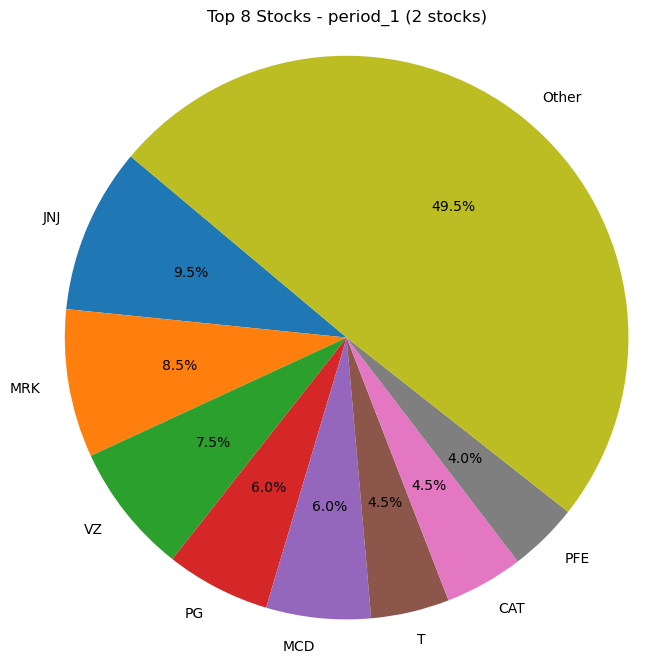

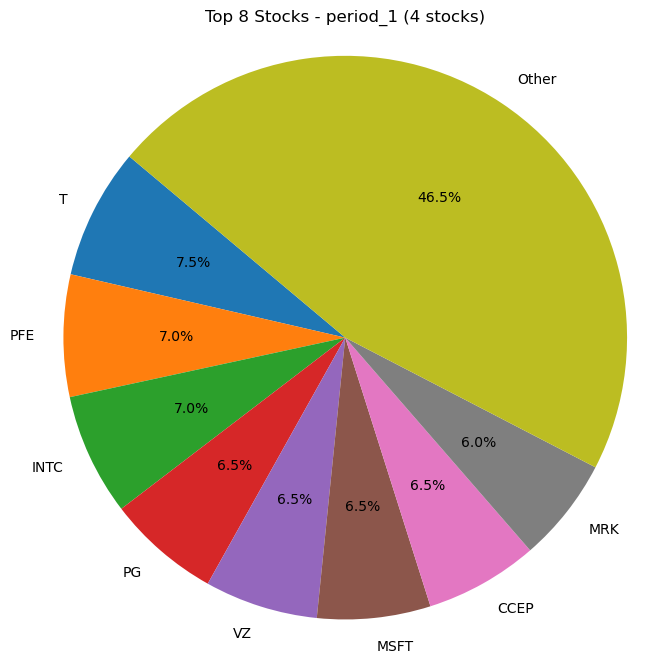

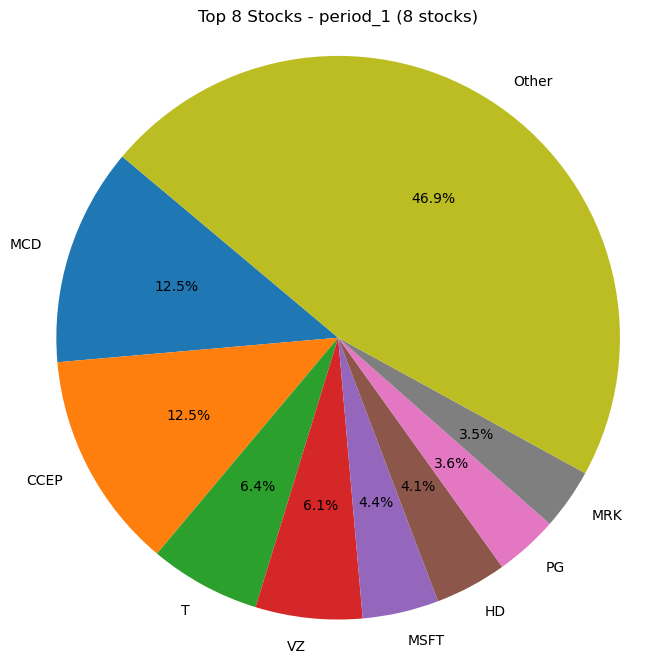

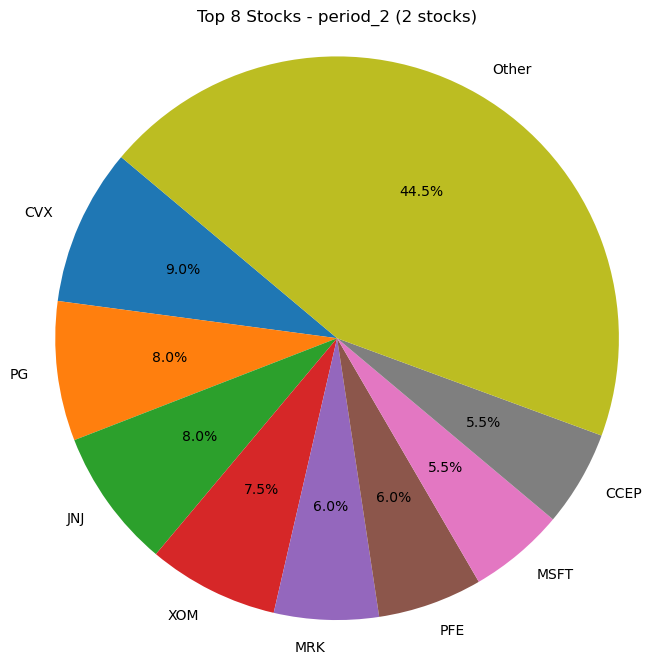

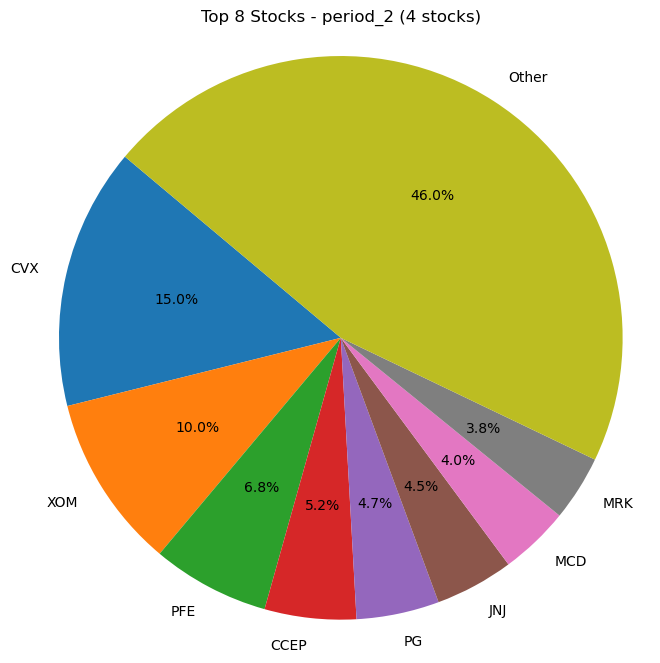

...

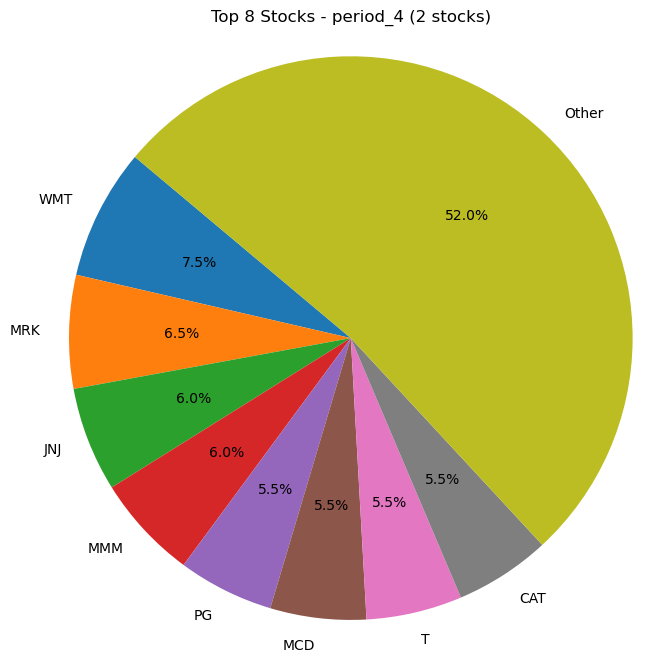

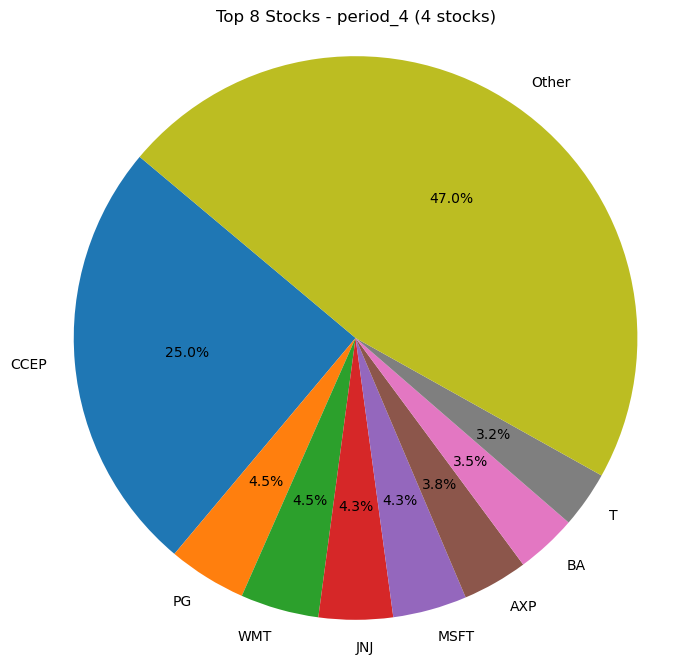

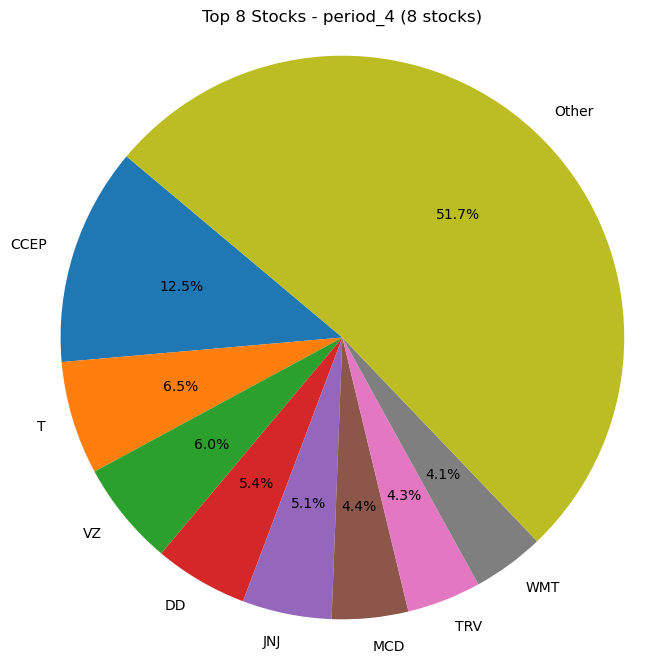

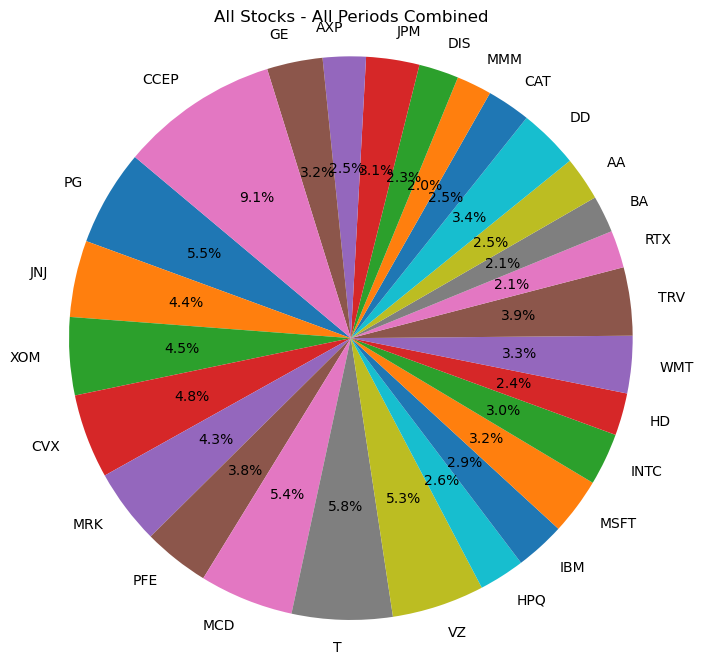

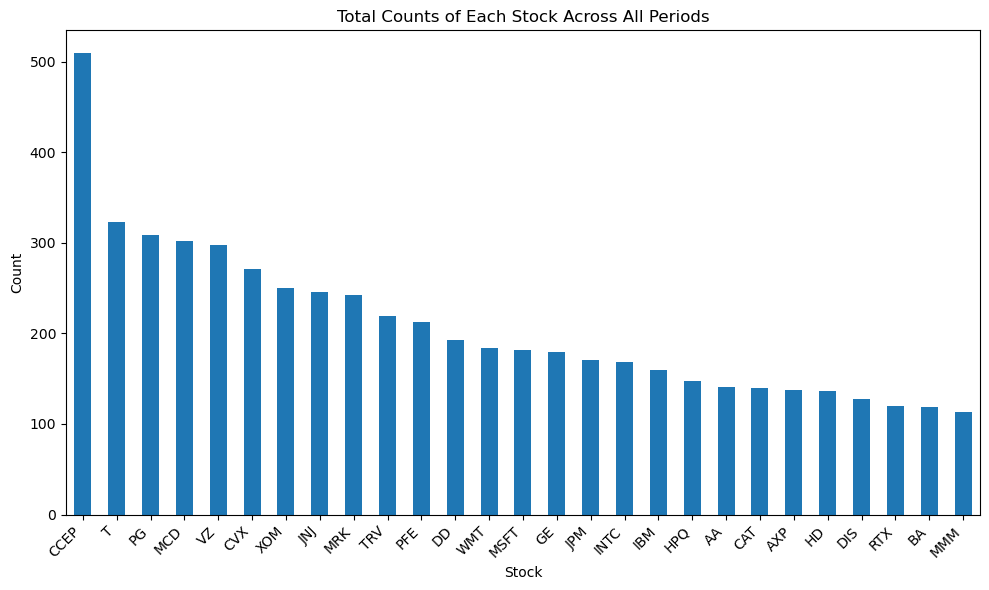

In [149]:
count_of_stocks(result_df_HCT,custom_tickers)

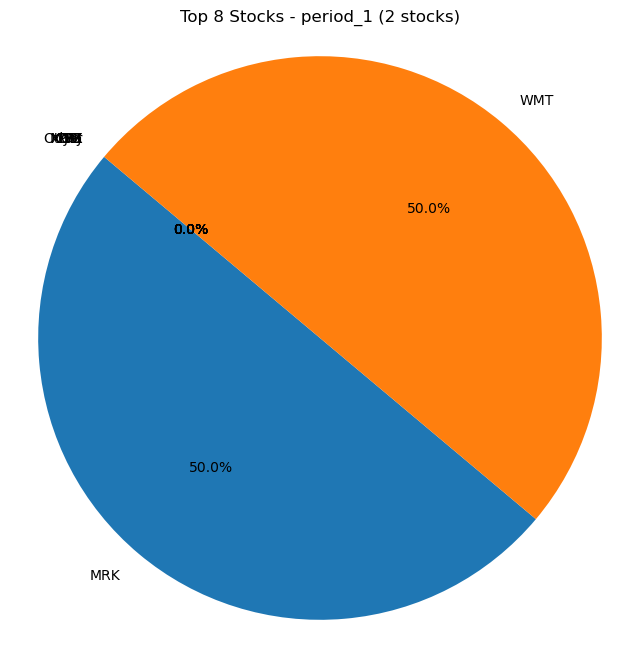

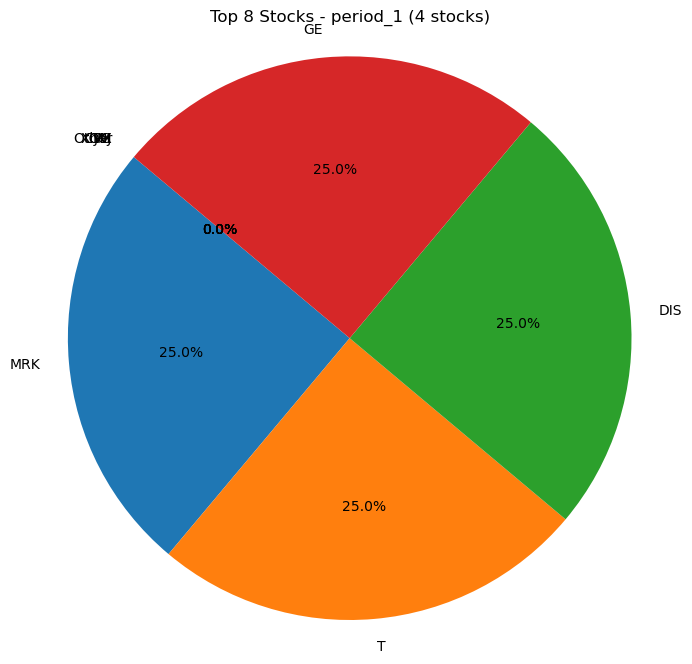

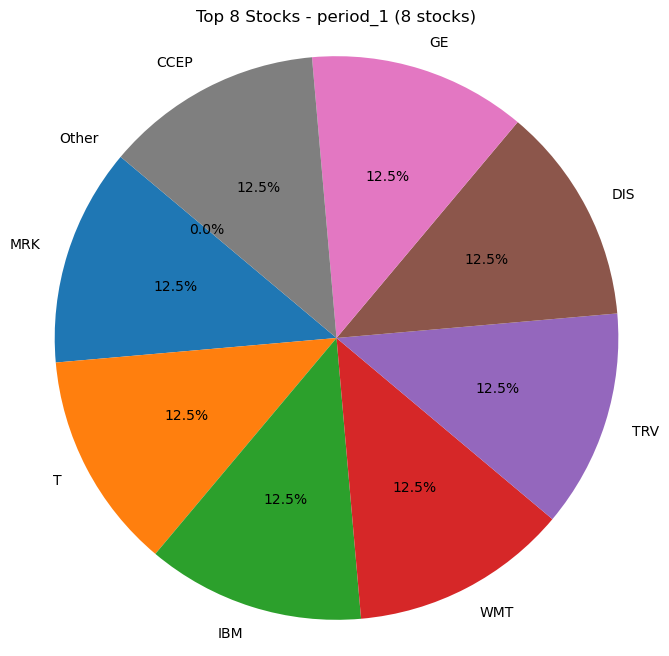

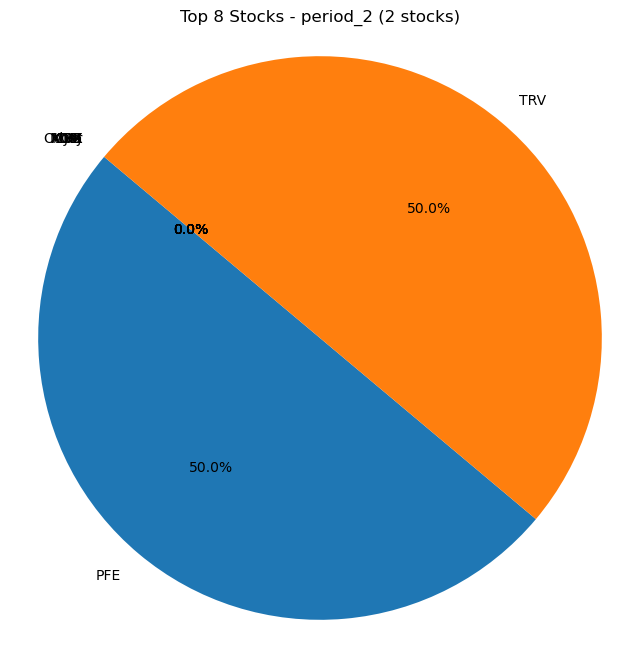

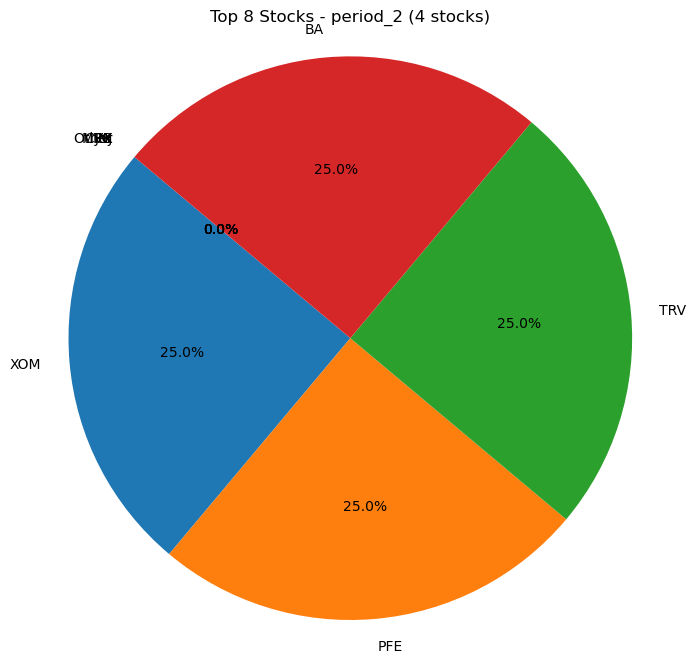

...

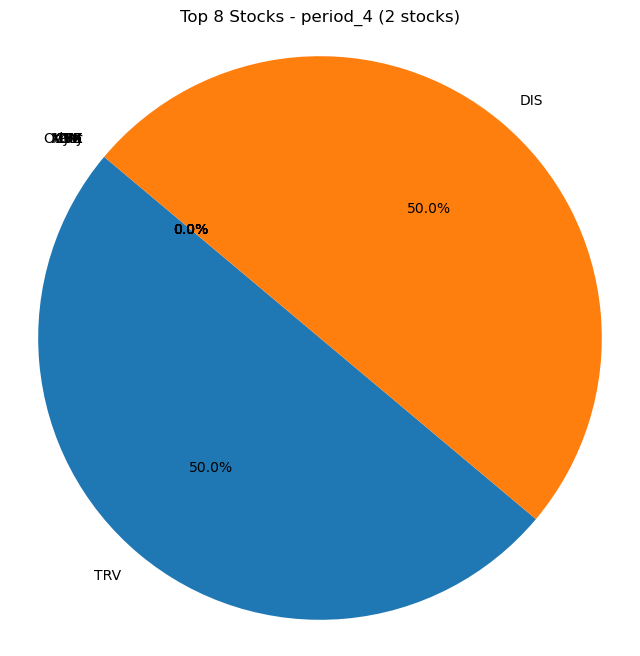

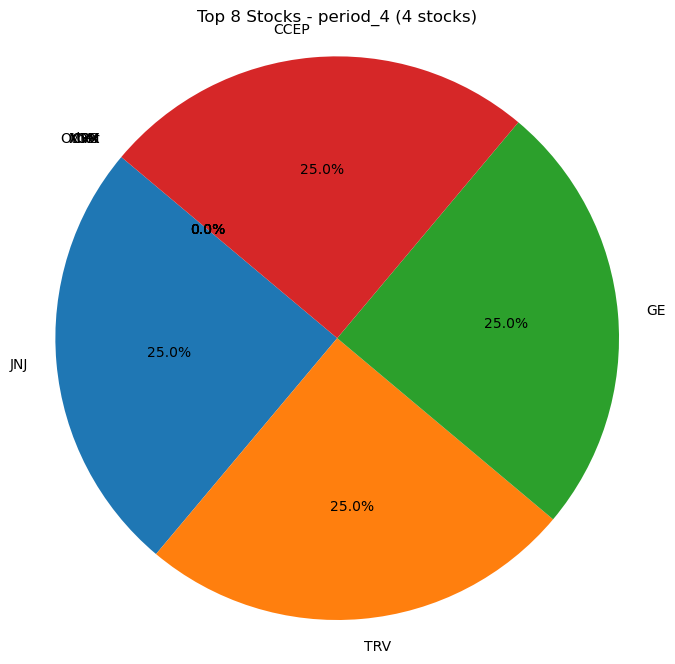

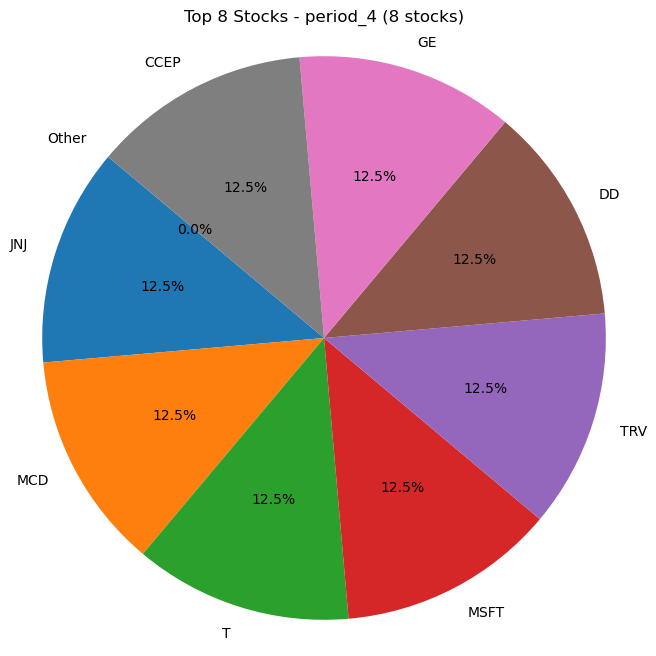

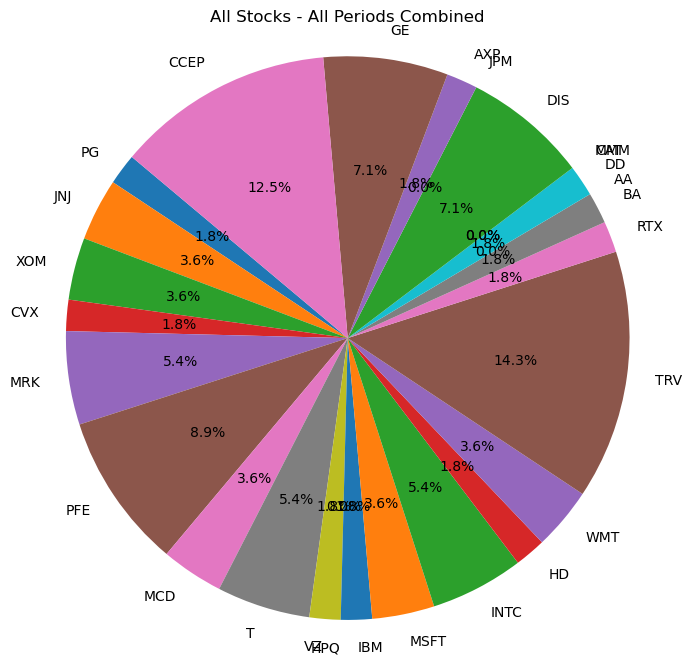

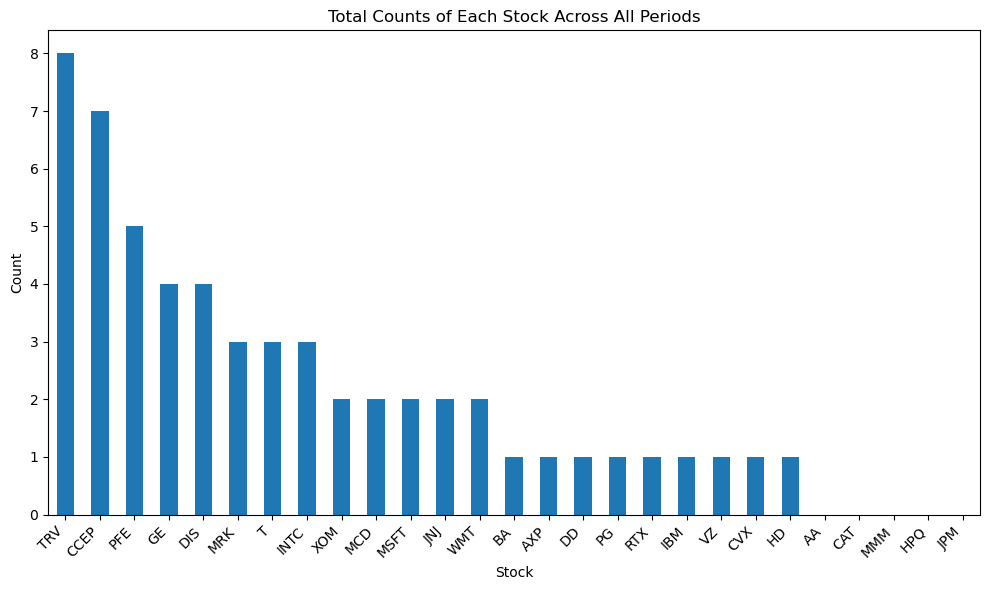

In [150]:
count_of_stocks(result_df_kmeans,custom_tickers)

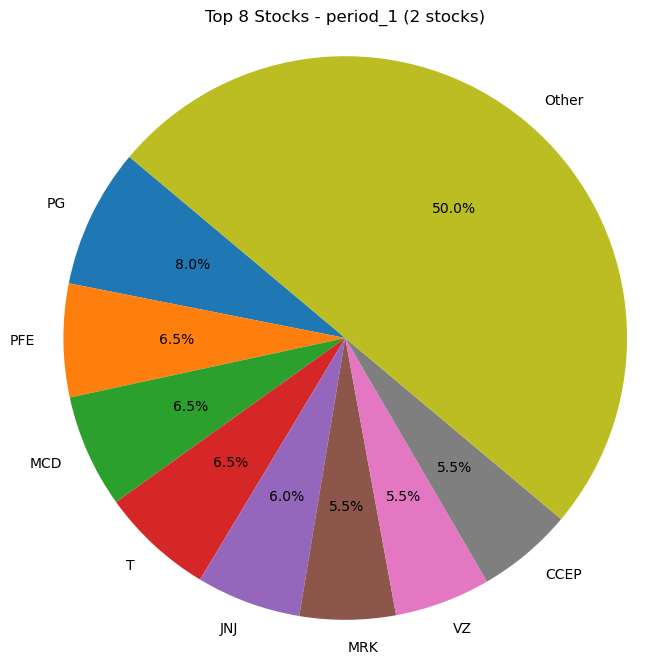

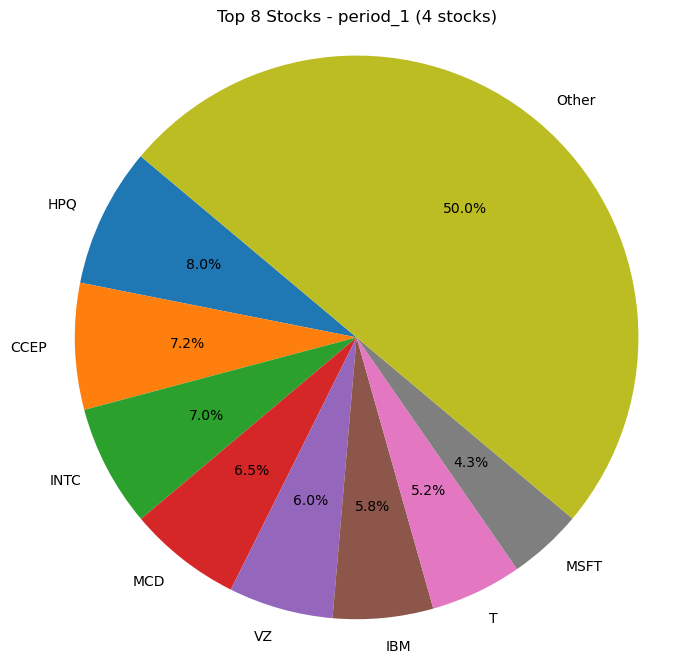

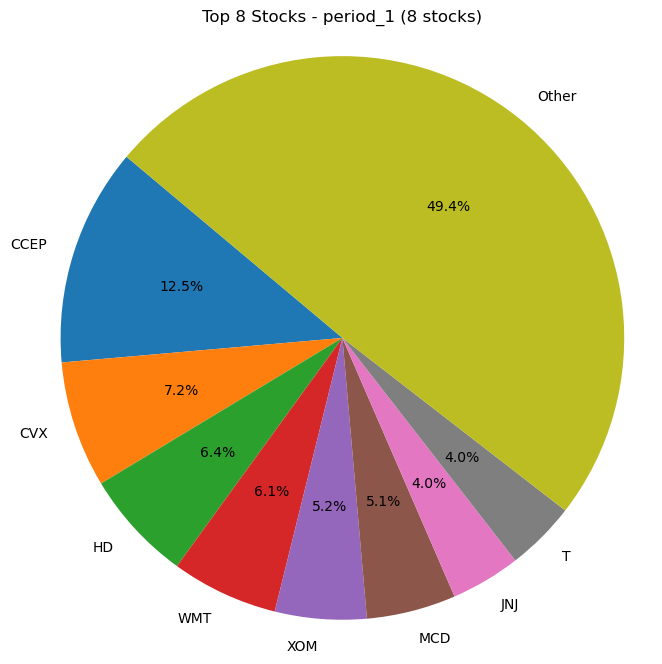

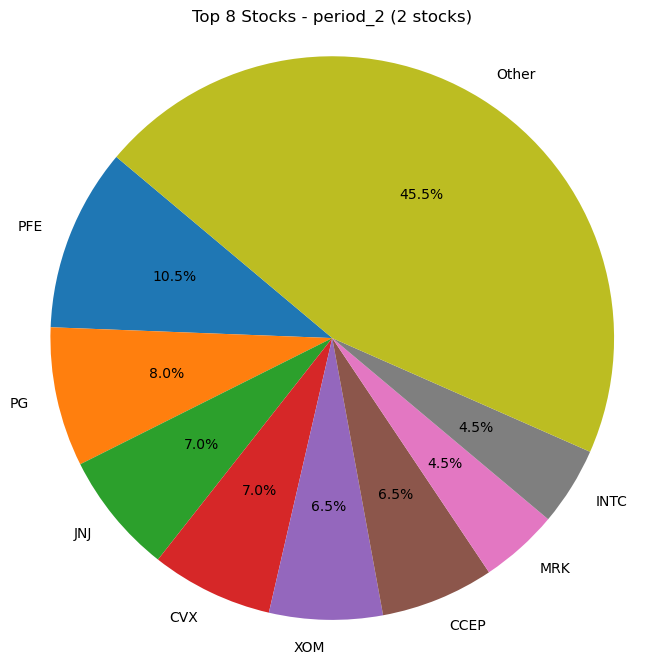

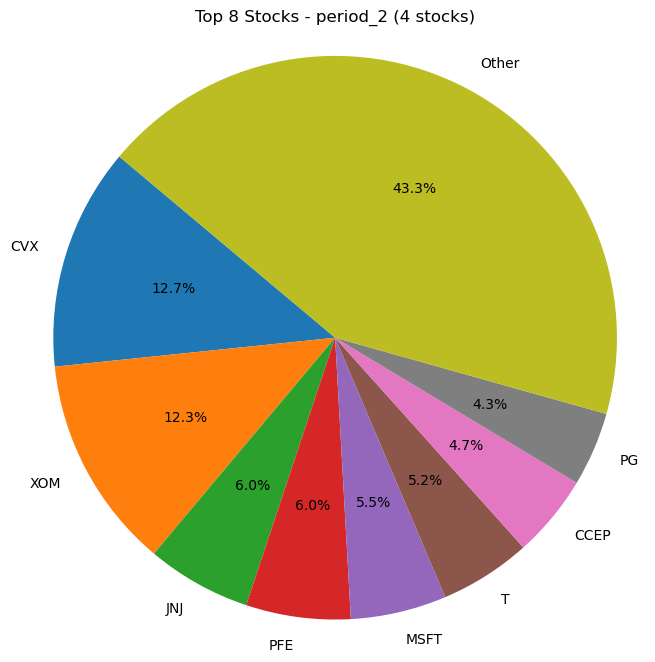

...

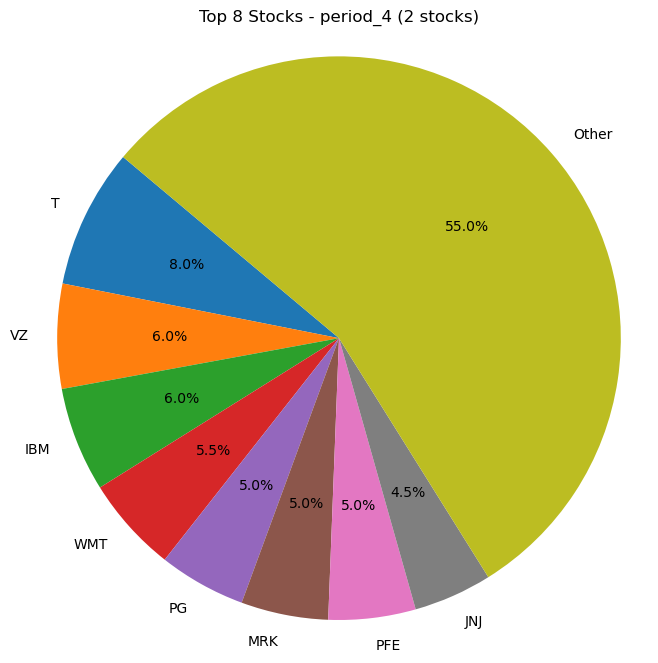

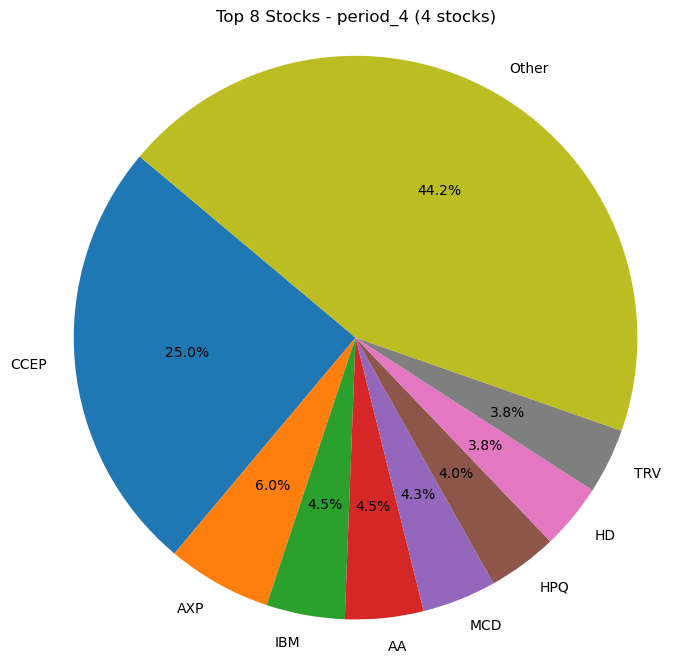

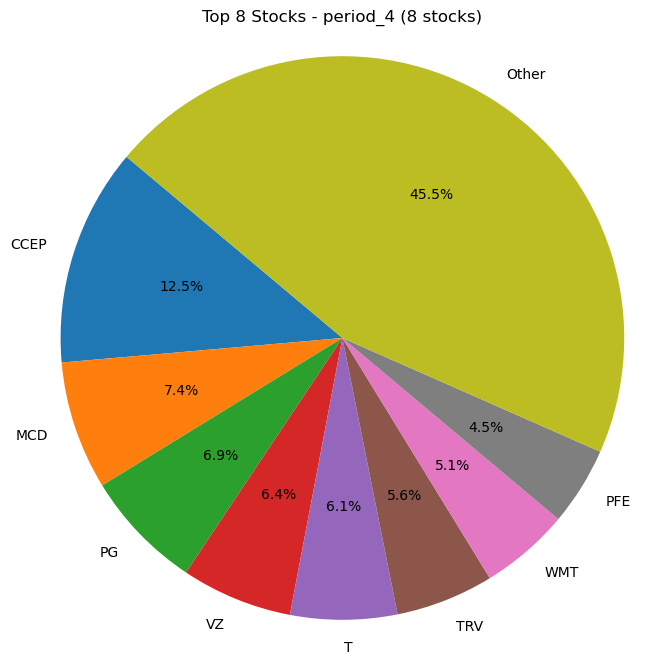

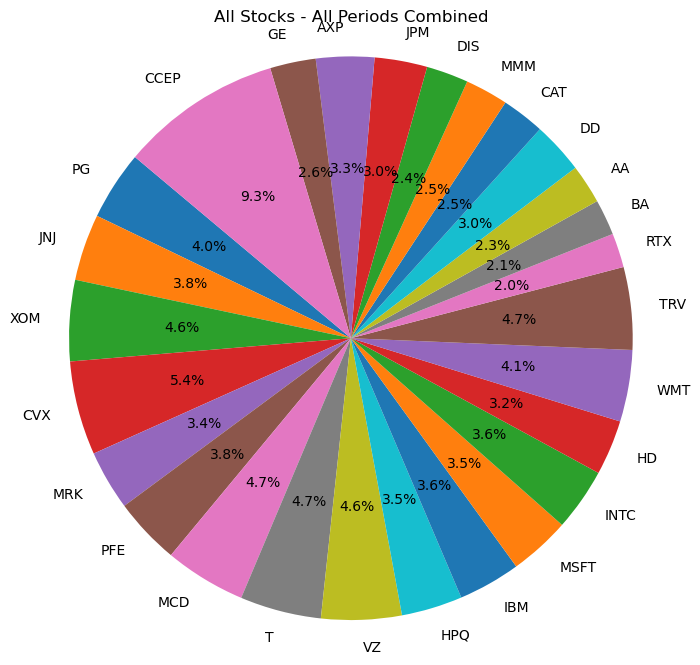

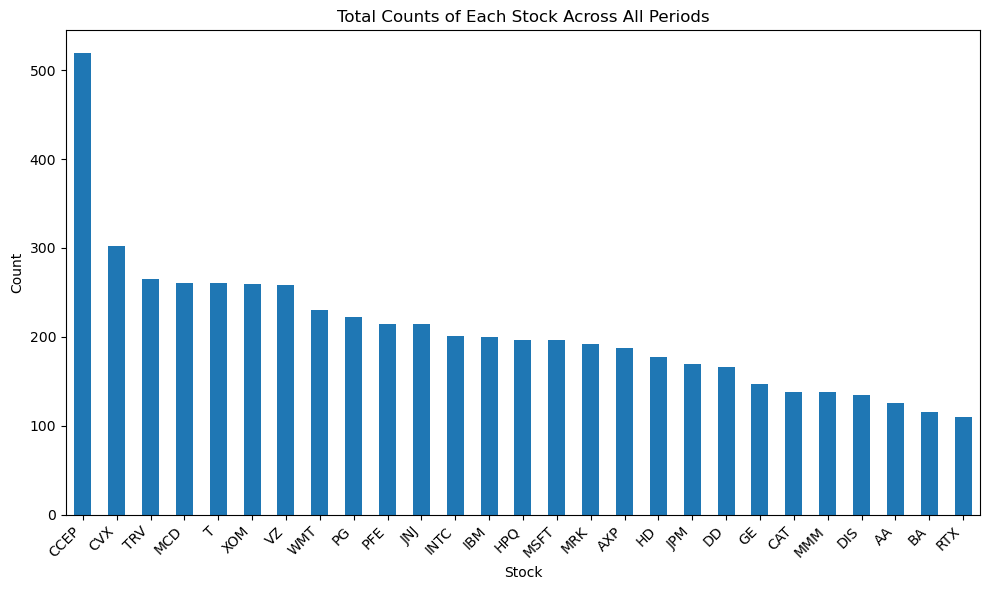

In [151]:
count_of_stocks(result_df_kmeans_rand,custom_tickers)

In [ ]:
#count_of_stocks(result_df_MST)

In [113]:
def plot_metric(metric_name,result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_random.index)
    
    random_values = [result_df_random.loc[label][metric_name] for label in labels]
    HCT_values = [result_df_HCT.loc[label][metric_name] for label in labels]
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    #MST_values = [result_df_MST.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.2  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width * 1.5, random_values, width, label='Random')
    rects2 = ax.bar(x - width * 0.5, HCT_values, width, label='HCT')
    rects3 = ax.bar(x + width * 0.5, kmeans_values, width, label='K-means')
    rects4 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='K-means Random')
    #rects5 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='MST')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of Random Values:", np.mean(random_values))
    print("Total Average " + metric_name + " of Cluster Values:", np.mean(HCT_values))
    print("Total Average " + metric_name + " of K-means Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    #print("Total Average " + metric_name + " of MST Values:", np.mean(MST_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of Random Values:", np.mean(random_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of Cluster Values:", np.mean(HCT_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))
        #print(period_label + " Average " + metric_name + " of MST:", np.mean(MST_values[(period_num - 1) * 3:period_num * 3]))

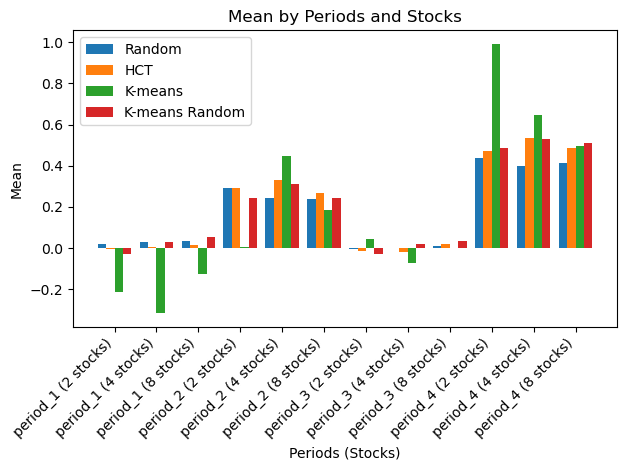

Total Average Mean of Random Values: 0.17609344389570725
Total Average Mean of Cluster Values: 0.1995438329862116
Total Average Mean of K-means Values: 0.17409310751503604
Total Average Mean of K-means Random Values: 0.20012604945164272

Period 1 Average Mean of Random Values: 0.02814180792001254
Period 1 Average Mean of Cluster Values: 0.005880387903054204
Period 1 Average Mean of K-means Values: -0.2179573396597844
Period 1 Average Mean of K-means Random Values: 0.0183555533647714
Period 2 Average Mean of Random Values: 0.2589269457765392
Period 2 Average Mean of Cluster Values: 0.2974139589242995
Period 2 Average Mean of K-means Values: 0.21315651064396532
Period 2 Average Mean of K-means Random Values: 0.2658805298421105
Period 3 Average Mean of Random Values: 0.0019288081091526626
Period 3 Average Mean of Cluster Values: -0.002834907293367188
Period 3 Average Mean of K-means Values: -0.00913566626702574
Period 3 Average Mean of K-means Random Values: 0.008427664058969797


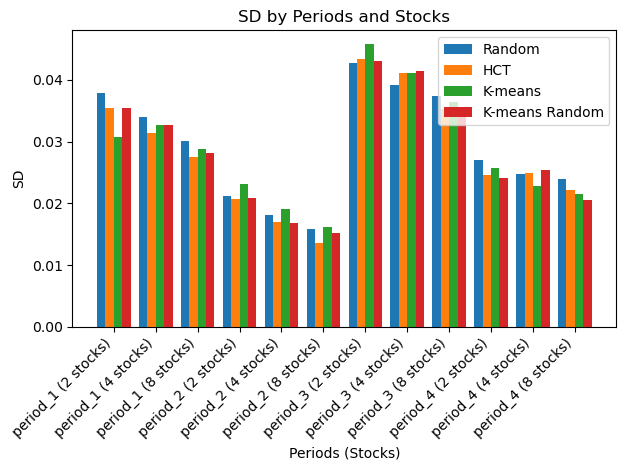

Total Average SD of Random Values: 0.02934534112561837
Total Average SD of Cluster Values: 0.02807101425329708
Total Average SD of K-means Values: 0.02866797582233409
Total Average SD of K-means Random Values: 0.028221235739456247

Period 1 Average SD of Random Values: 0.033994559763686434
Period 1 Average SD of Cluster Values: 0.03142604832428341
Period 1 Average SD of K-means Values: 0.03078124515038495
Period 1 Average SD of K-means Random Values: 0.03207628202501652
Period 2 Average SD of Random Values: 0.018376162078873146
Period 2 Average SD of Cluster Values: 0.01706165376250102
Period 2 Average SD of K-means Values: 0.019483428802071313
Period 2 Average SD of K-means Random Values: 0.017617142879868253
Period 3 Average SD of Random Values: 0.039767523311309005
Period 3 Average SD of Cluster Values: 0.039924343965970124
Period 3 Average SD of K-means Values: 0.041043661338604646
Period 3 Average SD of K-means Random Values: 0.03978814461215143


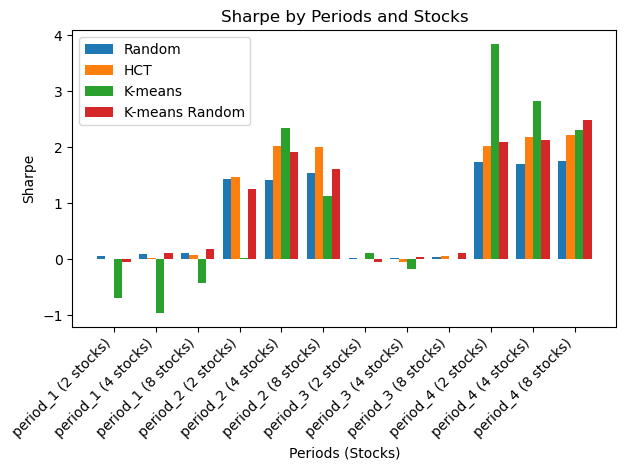

Total Average Sharpe of Random Values: 0.8265209788259323
Total Average Sharpe of Cluster Values: 1.002604858613749
Total Average Sharpe of K-means Values: 0.8598547538796885
Total Average Sharpe of K-means Random Values: 0.9861035492573897

Period 1 Average Sharpe of Random Values: 0.09242870457022699
Period 1 Average Sharpe of Cluster Values: 0.033742104168956295
Period 1 Average Sharpe of K-means Values: -0.6969373145213714
Period 1 Average Sharpe of K-means Random Values: 0.08453605949141117
Period 2 Average Sharpe of Random Values: 1.4594485624957894
Period 2 Average Sharpe of Cluster Values: 1.8323400422302623
Period 2 Average Sharpe of K-means Values: 1.1714784117702346
Period 2 Average Sharpe of K-means Random Values: 1.591649630845161
Period 3 Average Sharpe of Random Values: 0.023685633421025018
Period 3 Average Sharpe of Cluster Values: 0.006671681250403183
Period 3 Average Sharpe of K-means Values: -0.02625298149110652
Period 3 Average Sharpe of K-means Random Values: 0.031

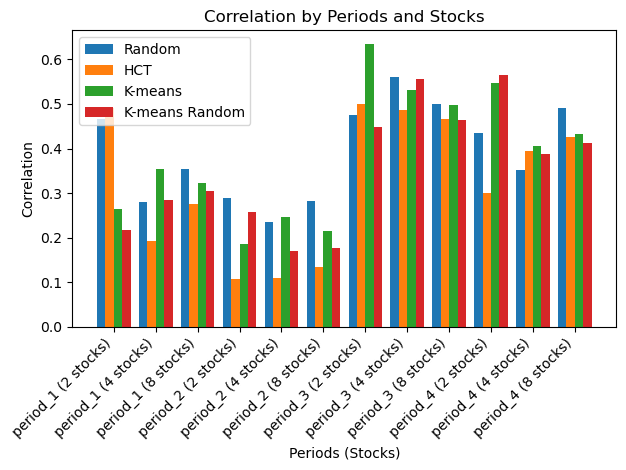

Total Average Correlation of Random Values: 0.3932773238642755
Total Average Correlation of Cluster Values: 0.32400826761199447
Total Average Correlation of K-means Values: 0.38639479882357586
Total Average Correlation of K-means Random Values: 0.3538518877911396

Period 1 Average Correlation of Random Values: 0.3670930051661048
Period 1 Average Correlation of Cluster Values: 0.3202038895841344
Period 1 Average Correlation of K-means Values: 0.31323778842356054
Period 1 Average Correlation of K-means Random Values: 0.2690238558369186
Period 2 Average Correlation of Random Values: 0.2679418801875159
Period 2 Average Correlation of Cluster Values: 0.11779238509506325
Period 2 Average Correlation of K-means Values: 0.2154903073740503
Period 2 Average Correlation of K-means Random Values: 0.2016838402923876
Period 3 Average Correlation of Random Values: 0.5122626198338693
Period 3 Average Correlation of Cluster Values: 0.48395373621695503
Period 3 Average Correlation of K-means Values: 0.5

In [114]:
# Plotting Mean
plot_metric('Mean',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric('SD',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric('Correlation',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand)

In [141]:
def plot_metric_kmeans(metric_name,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_kmeans.index)
    
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.35  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects3 = ax.bar(x - width/2, kmeans_values, width, label='K-means Centroid')
    rects4 = ax.bar(x + width/2, kmeans_rand_values, width, label='K-means Random')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))

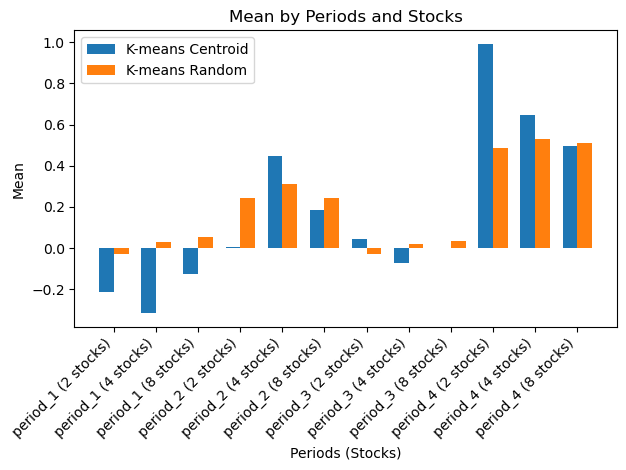

Total Average Mean of K-means Centroid Values: 0.17409310751503604
Total Average Mean of K-means Random Values: 0.20012604945164272

Period 1 Average Mean of K-means Centroid Values: -0.2179573396597844
Period 1 Average Mean of K-means Random Values: 0.0183555533647714
Period 2 Average Mean of K-means Centroid Values: 0.21315651064396532
Period 2 Average Mean of K-means Random Values: 0.2658805298421105
Period 3 Average Mean of K-means Centroid Values: -0.00913566626702574
Period 3 Average Mean of K-means Random Values: 0.008427664058969797


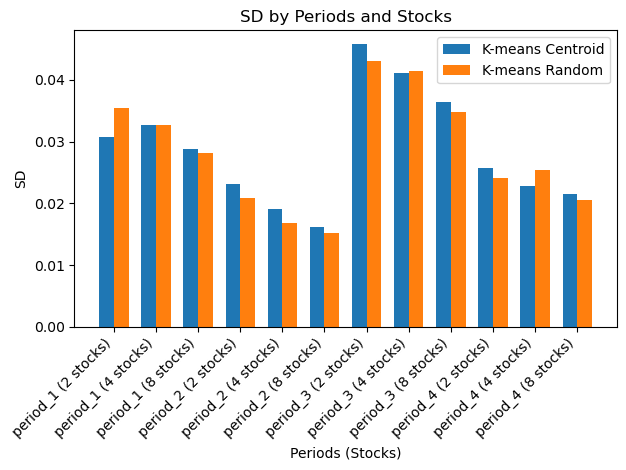

Total Average SD of K-means Centroid Values: 0.02866797582233409
Total Average SD of K-means Random Values: 0.028221235739456247

Period 1 Average SD of K-means Centroid Values: 0.03078124515038495
Period 1 Average SD of K-means Random Values: 0.03207628202501652
Period 2 Average SD of K-means Centroid Values: 0.019483428802071313
Period 2 Average SD of K-means Random Values: 0.017617142879868253
Period 3 Average SD of K-means Centroid Values: 0.041043661338604646
Period 3 Average SD of K-means Random Values: 0.03978814461215143


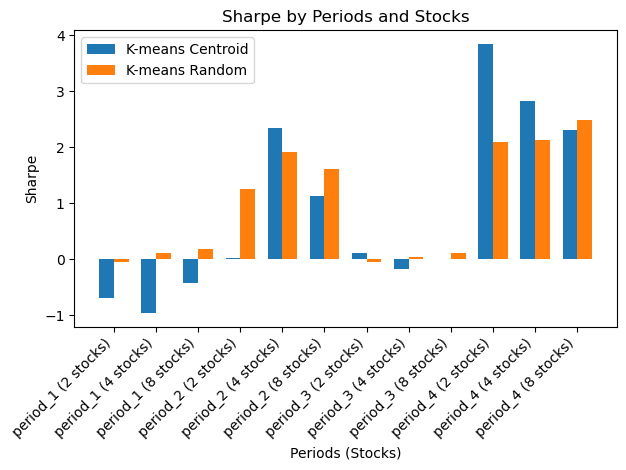

Total Average Sharpe of K-means Centroid Values: 0.8598547538796885
Total Average Sharpe of K-means Random Values: 0.9861035492573897

Period 1 Average Sharpe of K-means Centroid Values: -0.6969373145213714
Period 1 Average Sharpe of K-means Random Values: 0.08453605949141117
Period 2 Average Sharpe of K-means Centroid Values: 1.1714784117702346
Period 2 Average Sharpe of K-means Random Values: 1.591649630845161
Period 3 Average Sharpe of K-means Centroid Values: -0.02625298149110652
Period 3 Average Sharpe of K-means Random Values: 0.03161987617066297


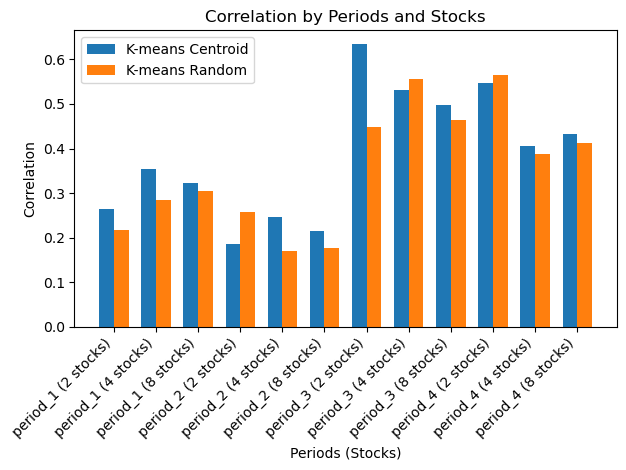

Total Average Correlation of K-means Centroid Values: 0.38639479882357586
Total Average Correlation of K-means Random Values: 0.3538518877911396

Period 1 Average Correlation of K-means Centroid Values: 0.31323778842356054
Period 1 Average Correlation of K-means Random Values: 0.2690238558369186
Period 2 Average Correlation of K-means Centroid Values: 0.2154903073740503
Period 2 Average Correlation of K-means Random Values: 0.2016838402923876
Period 3 Average Correlation of K-means Centroid Values: 0.5545642575954927
Period 3 Average Correlation of K-means Random Values: 0.4893166197829628


In [117]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans,result_df_kmeans_rand)

In [33]:
############# Out of sampling testing: other stocks ##############

In [91]:
custom_tickers_test = [
    "AAPL", "MSFT", "AMZN", "INTC", "ORCL", "CSCO",
    "AMGN", "GILD", "BIIB", "EBAY", 
    "ADBE", "NVDA", "ISRG", "MNST", "REGN", "ILMN", 
    "ORLY", "MAR", "ROST", "ADI", "ADP", "CTSH", "EA", "FAST", "INCY", "INTU",
    "JBHT", "MAT", "MCHP", "NTAP", "PCAR", "TXN", 
    "SIRI", "VRTX", "LRCX", "KLAC", "CSX", "VOD", "PAYX", 
    "REGN", "SHPG", "SRCL", "TSCO", "VRSN", "WBA", "XRAY"
    #"NFLX", "MDLZ" #IPO during period_1 so omit
]

In [94]:
period_dfs_test, correlation_matrices_test, distance_matrices_test = data_prep(custom_tickers_test, study_periods)

In [145]:
result_df_random_test = calculate_metrics_for_random_selection(period_dfs_test, num_stocks_list)
result_df_random_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.773867,0.059955,1.450389,0.138012,"[AMZN, SIRI, MSFT, JBHT, INCY, CTSH, AMGN, ADI..."
period_1 (4 stocks),0.579020,0.055073,1.182719,0.335902,"[INTC, AMZN, ADI, SRCL, MNST, WBA, REGN, MAT, ..."
period_1 (8 stocks),0.763355,0.046057,1.697872,0.237193,"[AMGN, MCHP, PCAR, PAYX, CSCO, ADBE, INTC, ILM..."
period_2 (2 stocks),0.852617,0.036952,2.176724,0.479935,"[JBHT, ILMN, LRCX, VRTX, BIIB, ROST, LRCX, GIL..."
period_2 (4 stocks),0.848737,0.030875,2.625148,0.231788,"[TSCO, VOD, LRCX, ADP, TSCO, MAT, MAR, PCAR, A..."
period_2 (8 stocks),0.732531,0.026453,2.760196,0.218983,"[FAST, AAPL, AMZN, XRAY, EBAY, AMGN, SHPG, JBH..."
period_3 (2 stocks),0.207574,0.050336,0.388765,0.209811,"[REGN, LRCX, VRTX, REGN, LRCX, INTC, INTU, NTA..."
period_3 (4 stocks),0.240500,0.044858,0.539705,0.419252,"[CTSH, GILD, AAPL, INCY, NVDA, SIRI, JBHT, EA,..."
period_3 (8 stocks),0.254058,0.040840,0.622027,0.455803,"[MSFT, CTSH, CSX, NTAP, EA, VOD, KLAC, ISRG, X..."
period_4 (2 stocks),1.018886,0.034582,2.975574,0.154345,"[ROST, VRTX, ORCL, FAST, FAST, TXN, MSFT, VRTX..."


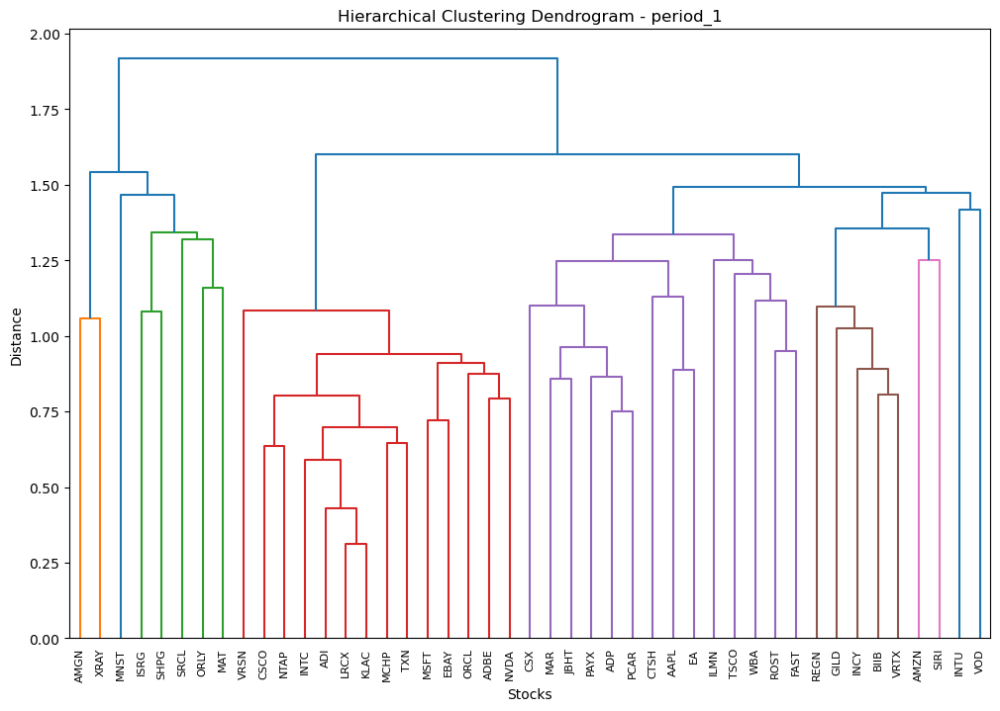

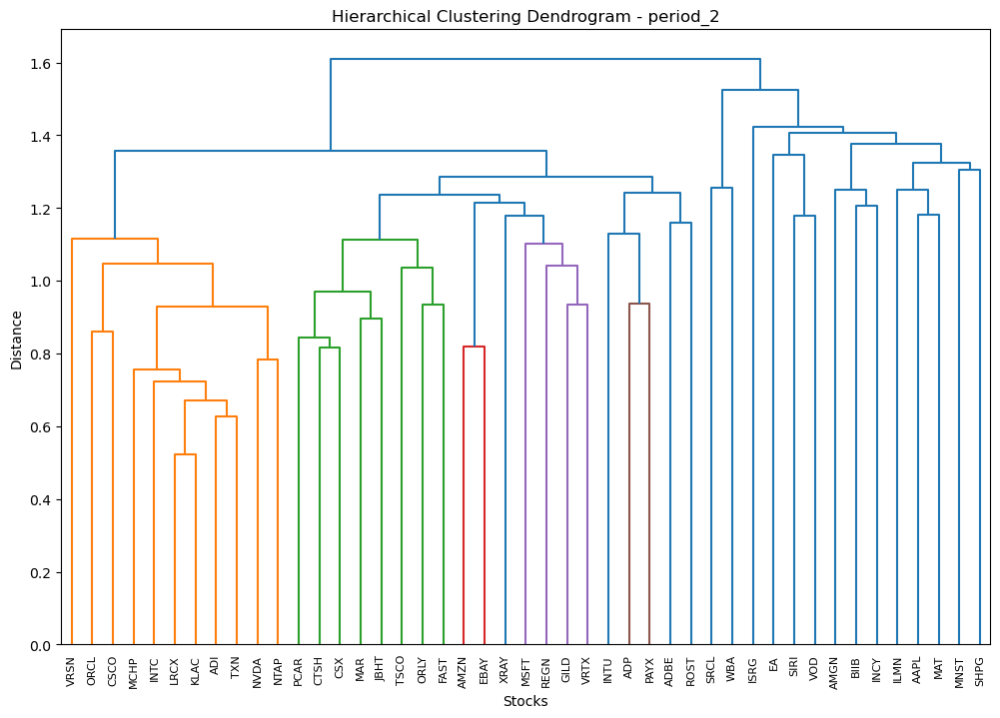

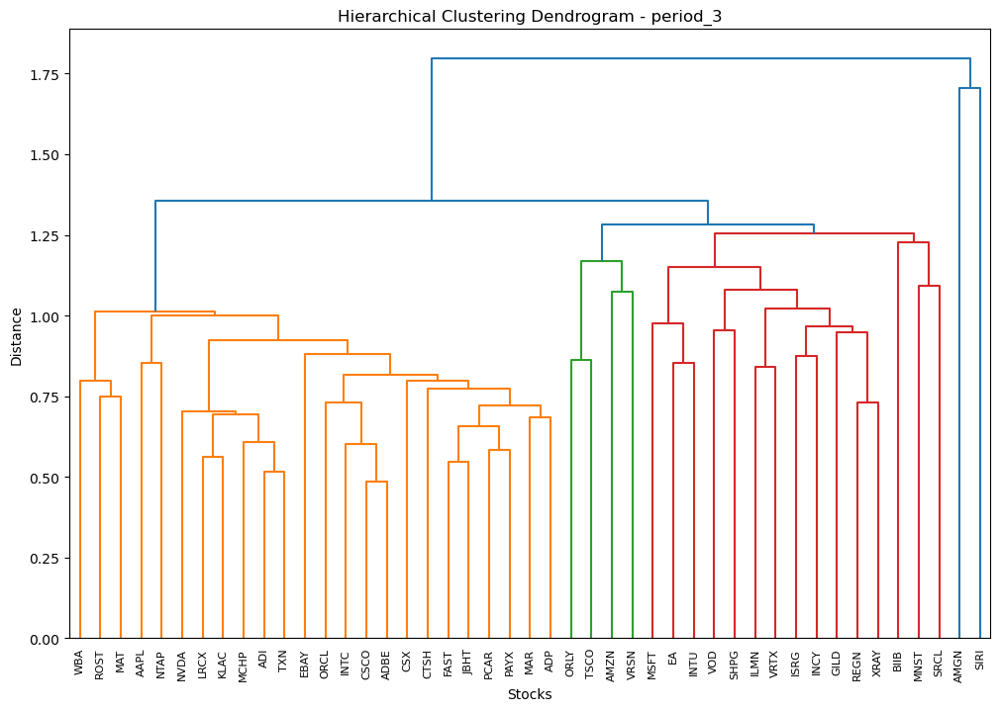

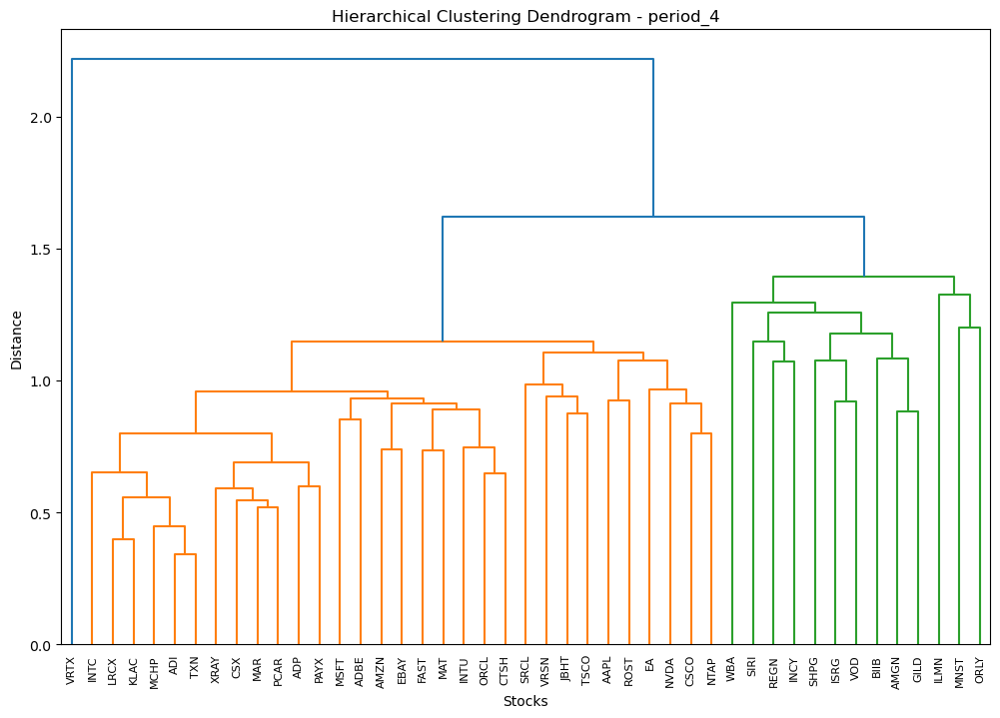

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.513889,0.063423,0.932168,0.133143,"[ISRG, ADI, ILMN, ORCL, AAPL, MCHP, ORLY, NVDA..."
period_1 (4 stocks),0.723097,0.048238,1.563697,0.193008,"[EA, CSCO, ROST, JBHT, VOD, MSFT, SHPG, PCAR, ..."
period_1 (8 stocks),0.767285,0.042093,1.862001,0.258399,"[INTU, EBAY, MCHP, XRAY, BIIB, MNST, WBA, CSX,..."
period_2 (2 stocks),1.399147,0.035688,3.223036,0.246944,"[MAT, REGN, AAPL, FAST, ILMN, ADP, ILMN, INCY,..."
period_2 (4 stocks),0.860647,0.032650,2.541133,0.279531,"[SHPG, VRTX, ROST, MCHP, AMGN, INCY, ROST, KLA..."
period_2 (8 stocks),0.723306,0.024894,2.842408,0.211328,"[MNST, REGN, ISRG, NVDA, CSCO, JBHT, VOD, WBA,..."
period_3 (2 stocks),0.206636,0.050455,0.426561,0.441781,"[MCHP, SRCL, NTAP, GILD, KLAC, INCY, LRCX, AMZ..."
period_3 (4 stocks),0.303527,0.042931,0.720521,0.367667,"[ROST, SHPG, NVDA, MNST, ROST, ISRG, LRCX, SRC..."
period_3 (8 stocks),0.085882,0.040686,0.201552,0.323238,"[AAPL, ISRG, ADI, CTSH, AMGN, ILMN, ROST, SIRI..."
period_4 (2 stocks),1.270562,0.034716,3.646752,0.246860,"[ORCL, SHPG, CTSH, SHPG, CSCO, ILMN, TXN, SHPG..."


In [96]:
all_cluster_stocks_HCT_test = HCT(correlation_matrices_test)
result_df_HCT_test = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT_test, period_dfs_test)
result_df_HCT_test

In [99]:
all_cluster_stocks_kmeans_test, centroid_vectors_test = generate_clusters_and_centroids(periods, distance_matrices_test,custom_tickers_test)

/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warning

In [101]:
result_df_kmeans_rand_test = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans_test, period_dfs_test)
result_df_kmeans_rand_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.788480,0.062866,1.388305,0.214163,"[BIIB, ORCL, AMGN, MCHP, ROST, EBAY, GILD, INT..."
period_1 (4 stocks),0.625964,0.049631,1.376989,0.228703,"[INTC, INCY, ROST, ISRG, MCHP, VOD, PAYX, ORLY..."
period_1 (8 stocks),0.616347,0.042400,1.496532,0.204534,"[TSCO, SRCL, MAT, BIIB, INTC, AMGN, ISRG, INTU..."
period_2 (2 stocks),0.930414,0.038191,2.032597,-0.000994,"[ISRG, ORCL, ILMN, NTAP, REGN, KLAC, VRSN, KLA..."
period_2 (4 stocks),0.929645,0.032795,2.741319,0.216722,"[REGN, FAST, TXN, AAPL, MAT, PAYX, INTC, MNST,..."
period_2 (8 stocks),0.955824,0.026931,3.478849,0.204476,"[VRTX, FAST, CTSH, MAT, SHPG, ADP, ORCL, EBAY,..."
period_3 (2 stocks),0.248286,0.051397,0.477075,0.401479,"[MCHP, INCY, CTSH, AMZN, FAST, AMGN, NTAP, WBA..."
period_3 (4 stocks),0.169463,0.043582,0.387252,0.437211,"[FAST, BIIB, NTAP, ORLY, MAR, MNST, ADI, ORLY,..."
period_3 (8 stocks),0.254384,0.039892,0.643122,0.337437,"[ISRG, INTC, ROST, CSX, BIIB, TSCO, ORLY, MNST..."
period_4 (2 stocks),1.142384,0.034086,3.332931,0.041355,"[ROST, ORCL, AAPL, INTU, REGN, MAT, INCY, TXN,..."


In [107]:
result_df_kmeans_test, stocks_by_period_kmeans_test = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans_test, period_dfs_test, centroid_vectors_test,distance_matrices_test)
result_df_kmeans_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.215358,0.081922,0.262882,0.300087,"[ILMN, MSFT]"
period_1 (4 stocks),0.932098,0.053887,1.729743,0.246332,"[MSFT, ILMN, JBHT, ORLY]"
period_1 (8 stocks),1.778217,0.047083,3.776761,0.232158,"[TSCO, JBHT, ORLY, ILMN, INTC, SHPG, ISRG, CTSH]"
period_2 (2 stocks),1.073024,0.041628,2.577669,0.342596,"[ADP, NVDA]"
period_2 (4 stocks),0.615460,0.030105,2.044378,0.239863,"[MAT, FAST, NVDA, VOD]"
period_2 (8 stocks),0.398347,0.024892,1.600297,0.241079,"[MSFT, FAST, NVDA, MAT, VOD, ADP, TSCO, EBAY]"
period_3 (2 stocks),0.616200,0.053408,1.153767,0.453722,"[ROST, ILMN]"
period_3 (4 stocks),0.196228,0.049192,0.398902,0.411697,"[EBAY, ILMN, NVDA, INTU]"
period_3 (8 stocks),0.777601,0.041327,1.881575,0.369608,"[ISRG, NVDA, ROST, ADP, BIIB, AAPL, SRCL, ILMN]"
period_4 (2 stocks),0.863361,0.031137,2.772755,0.354952,"[SHPG, AMZN]"


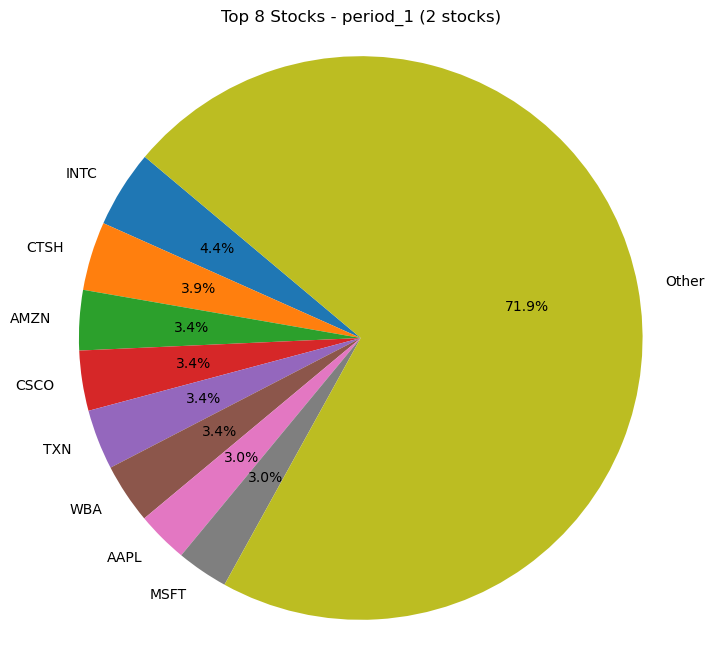

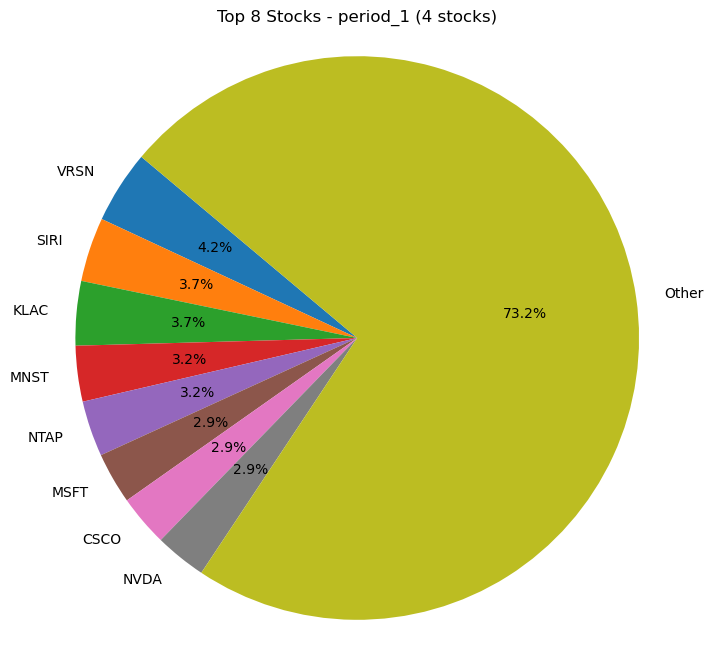

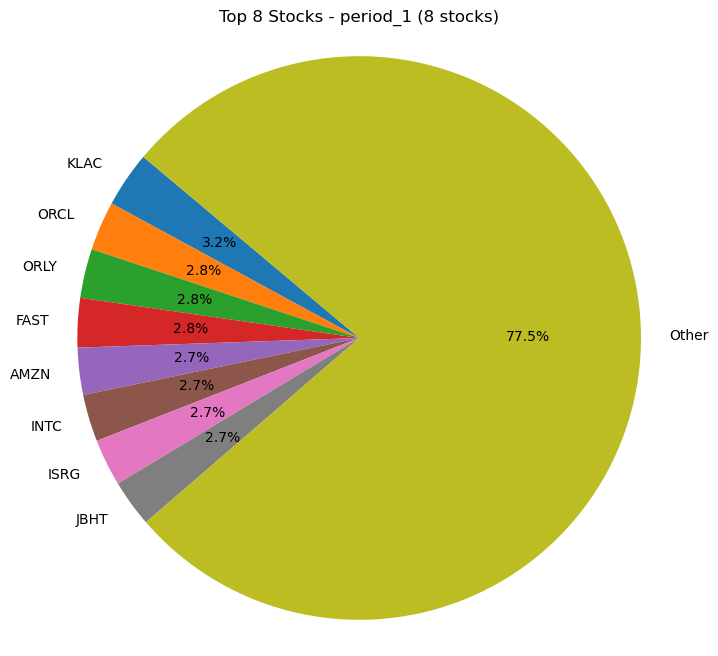

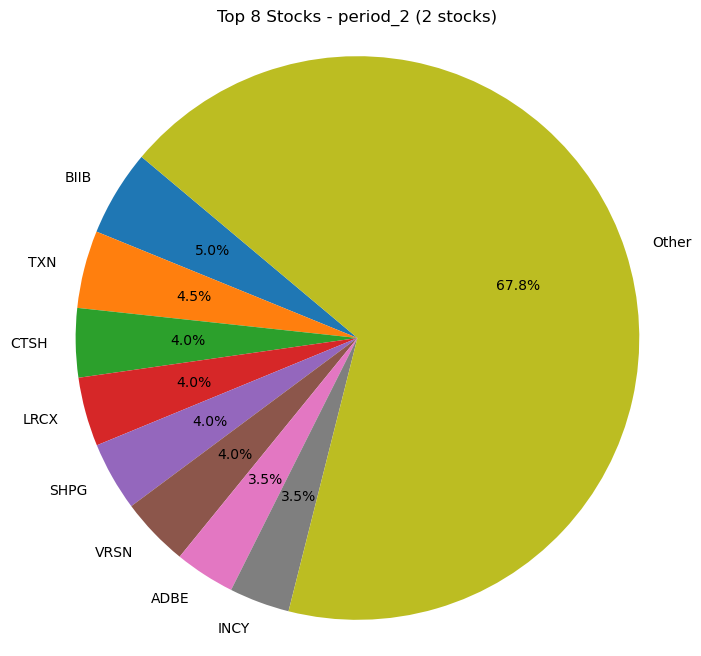

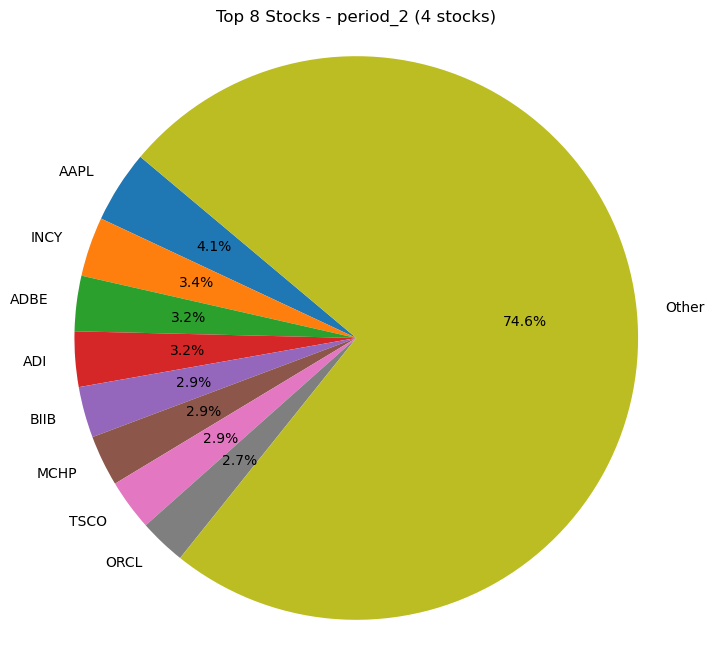

...

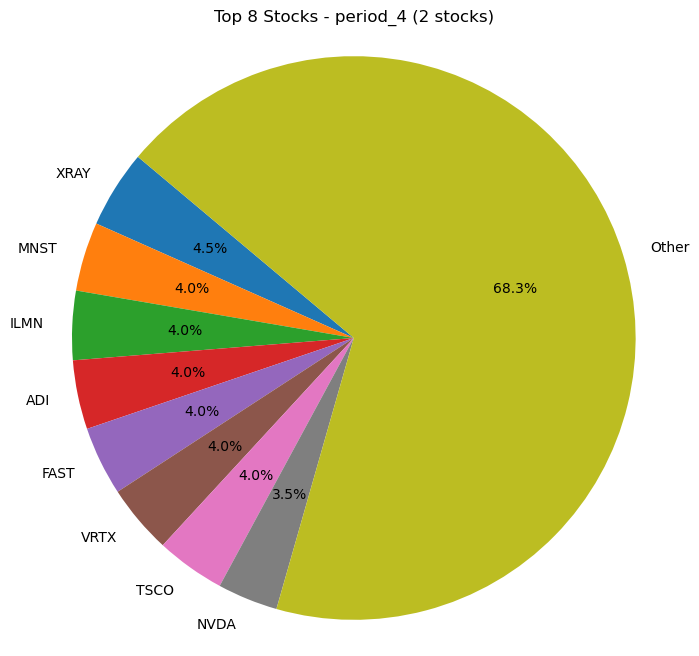

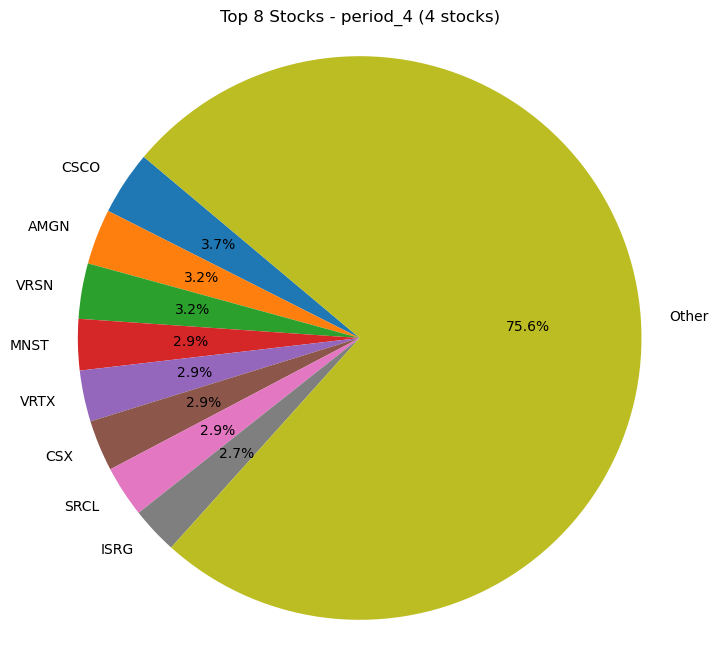

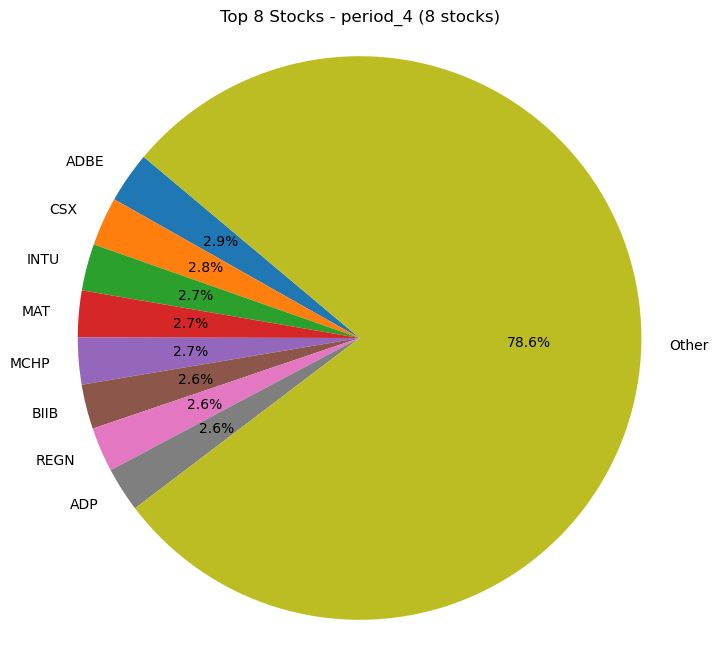

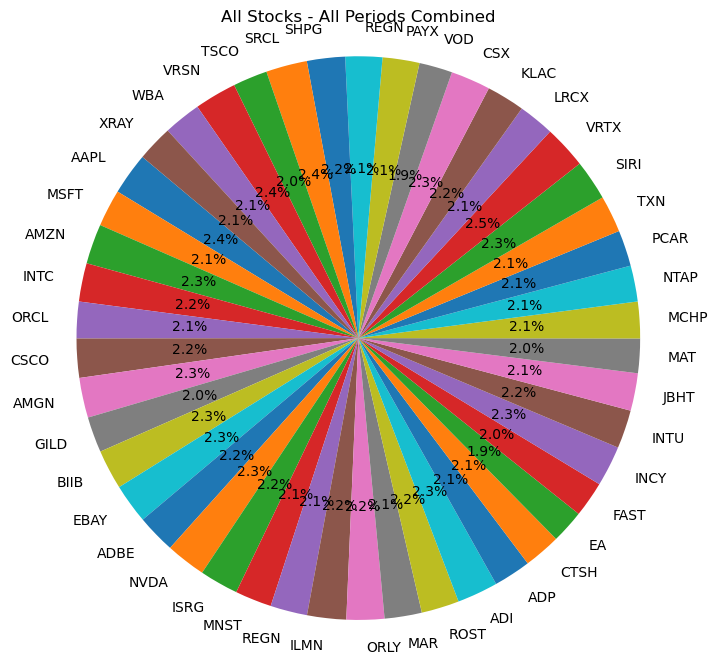

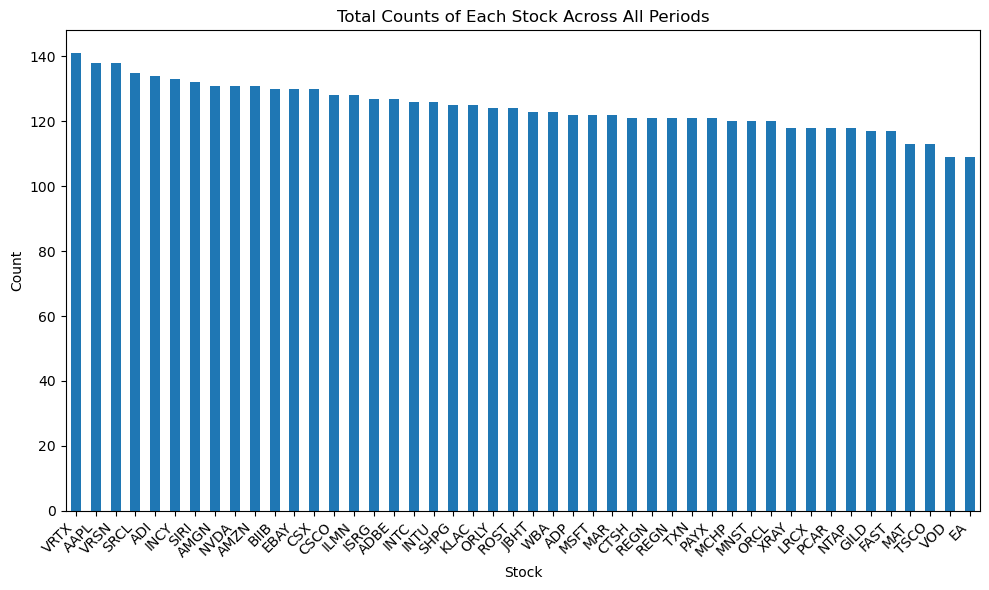

In [152]:
count_of_stocks(result_df_random_test,custom_tickers_test)

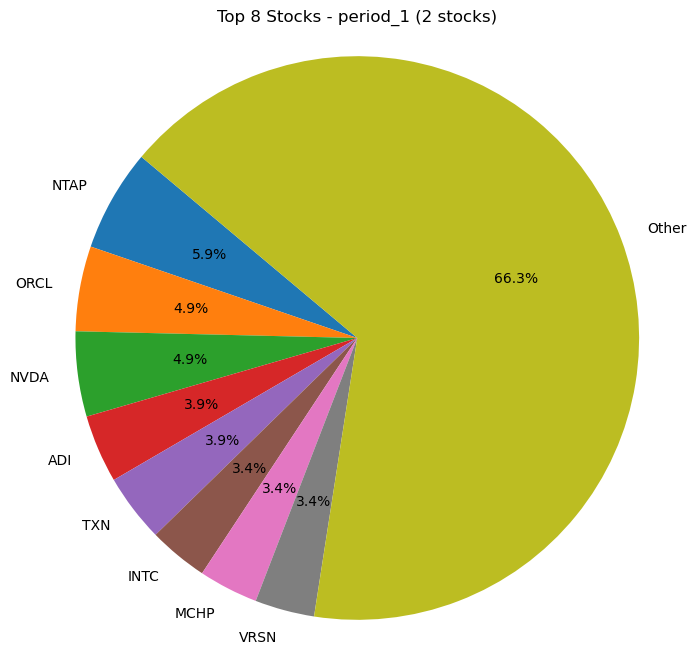

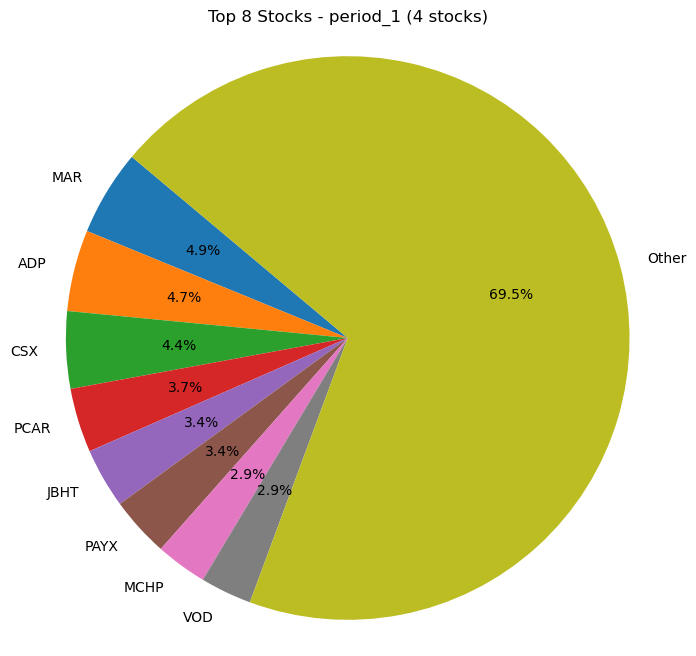

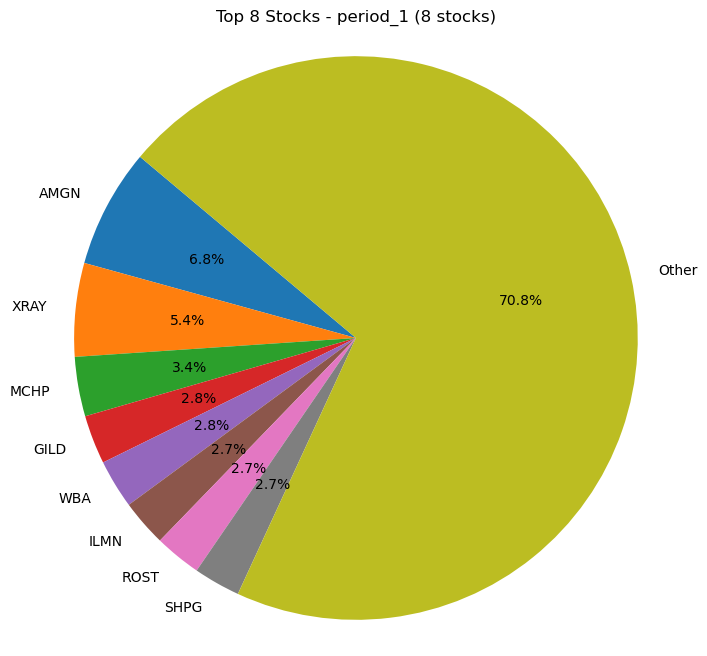

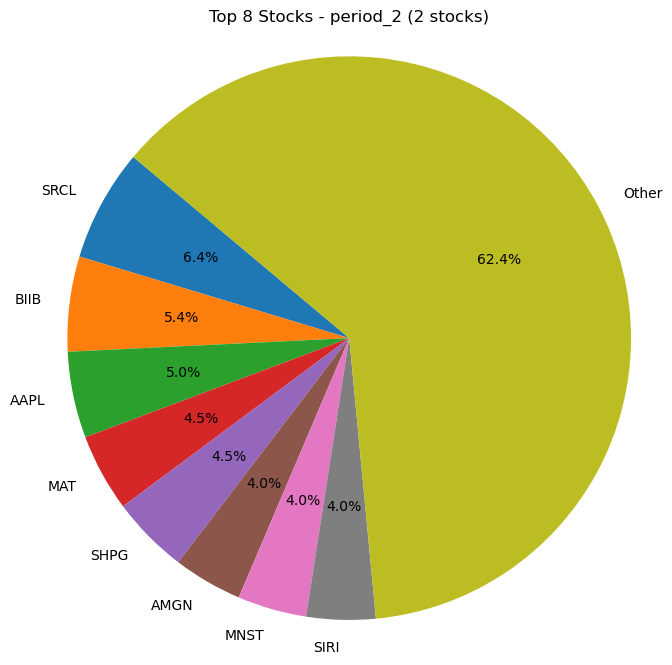

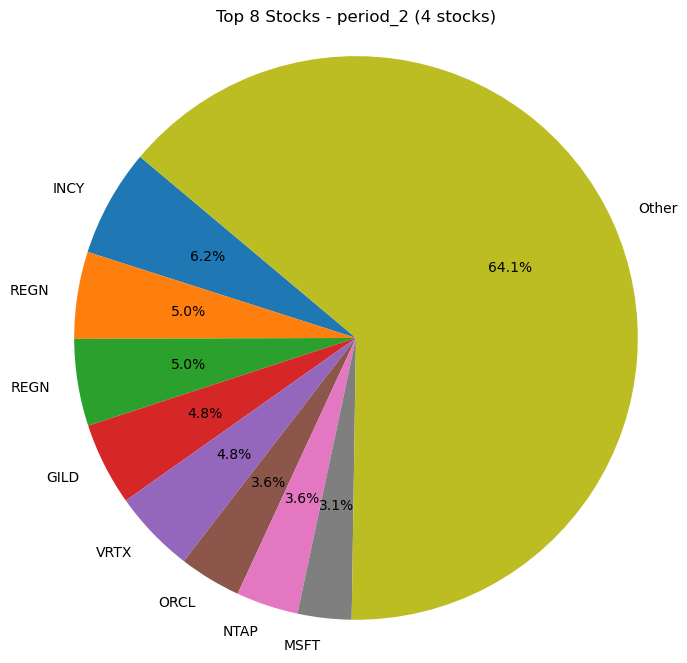

...

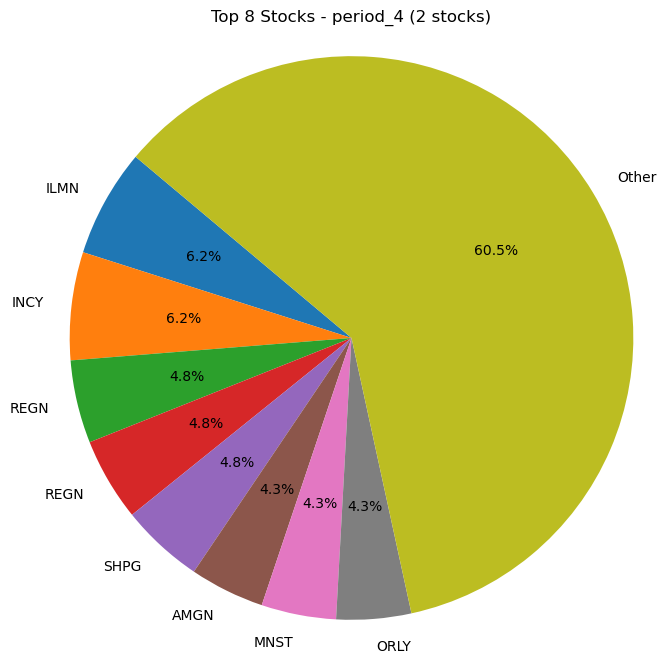

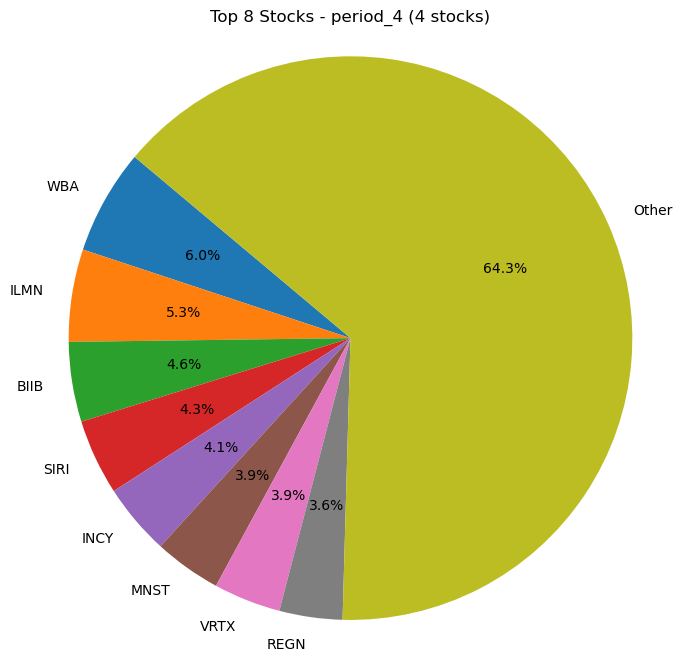

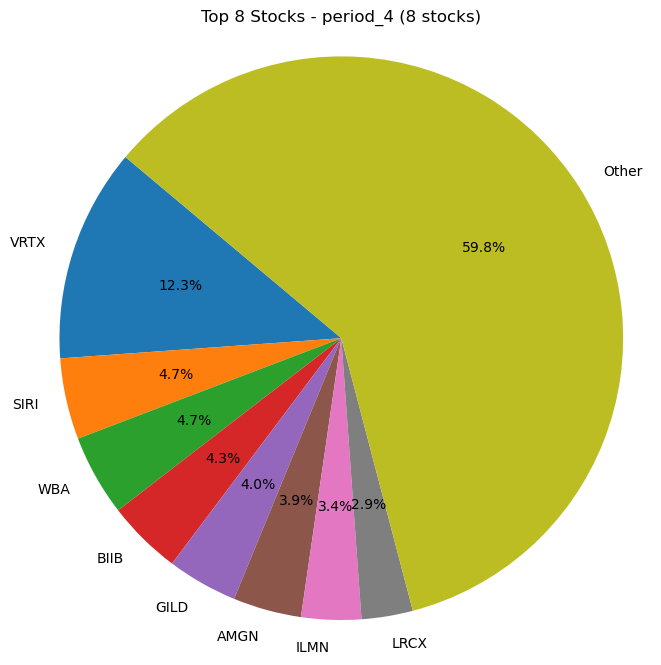

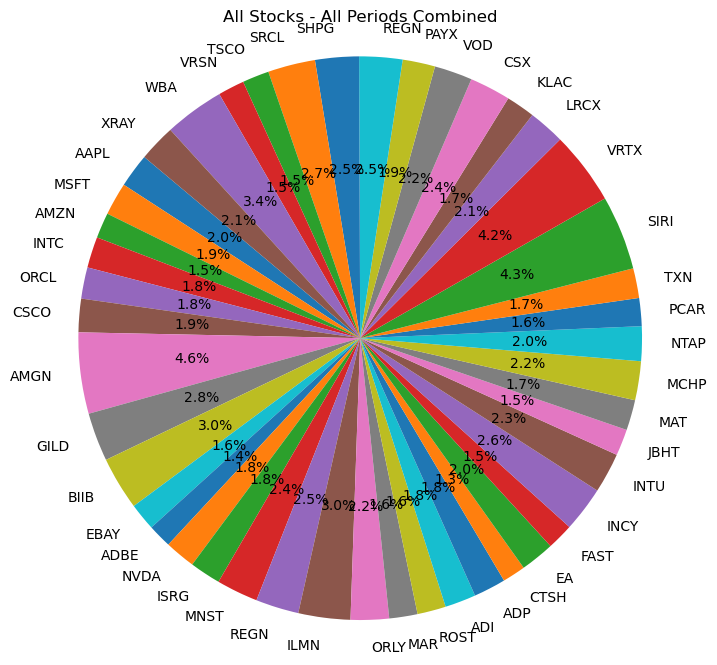

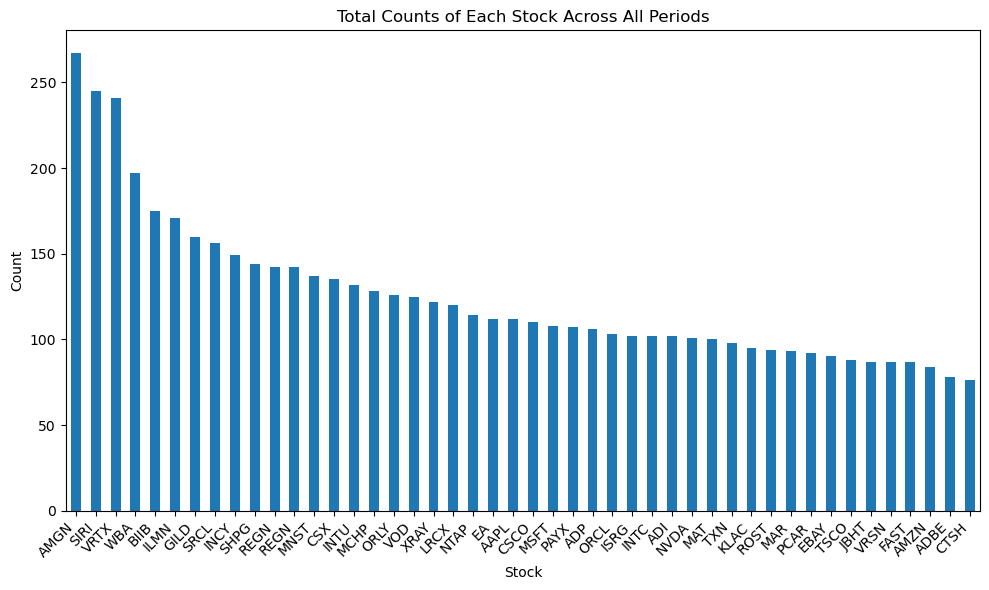

In [153]:
count_of_stocks(result_df_HCT_test,custom_tickers_test)

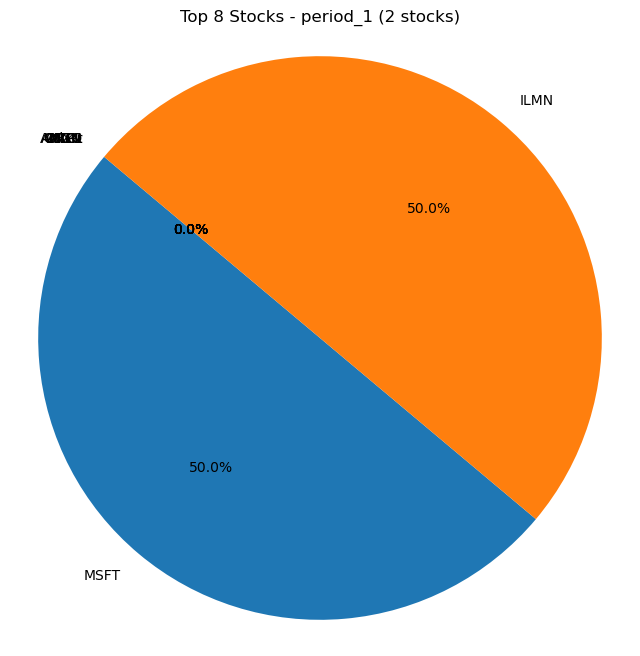

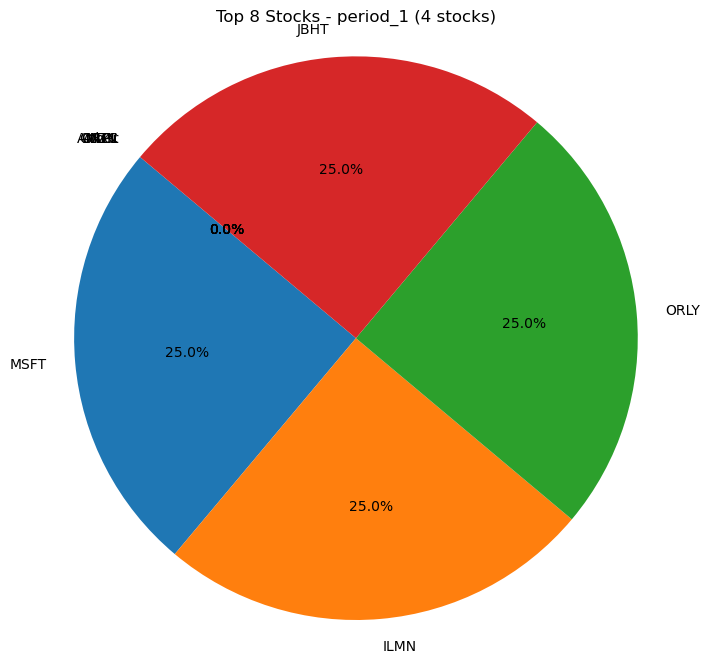

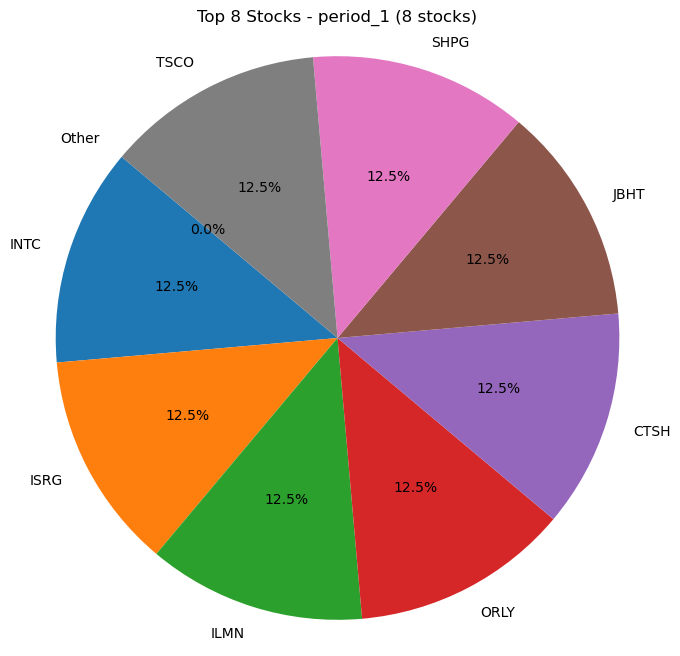

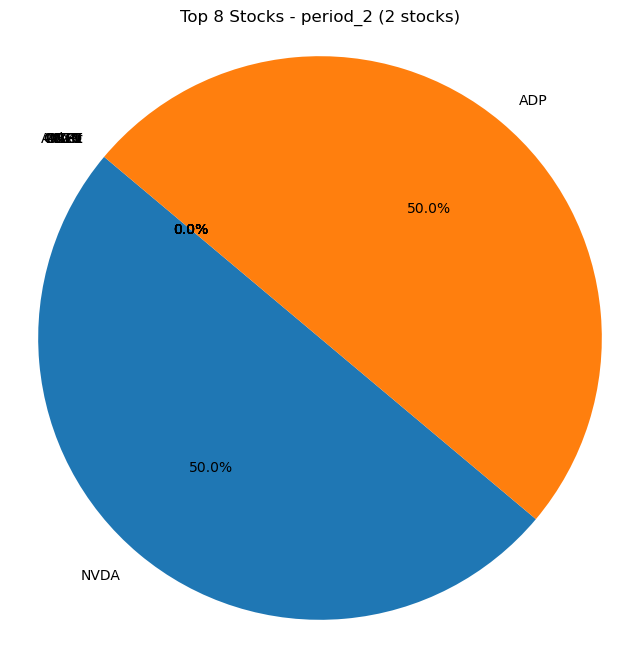

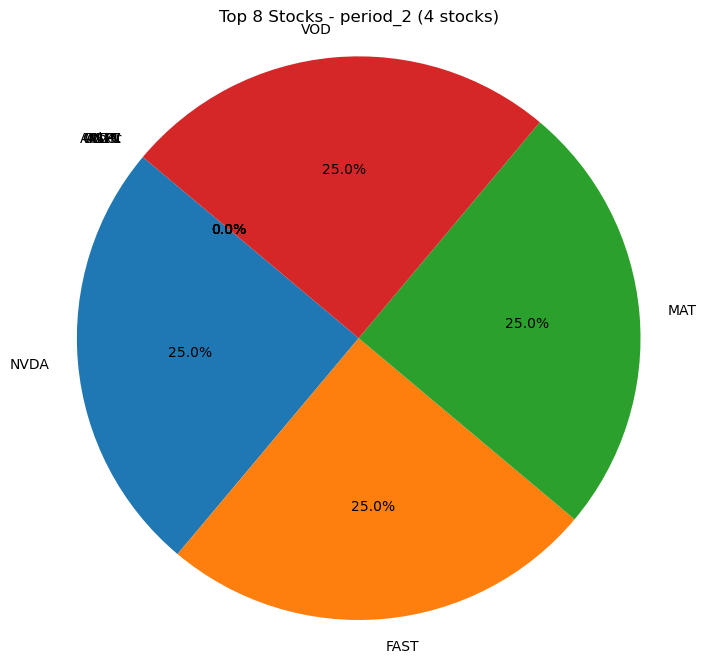

...

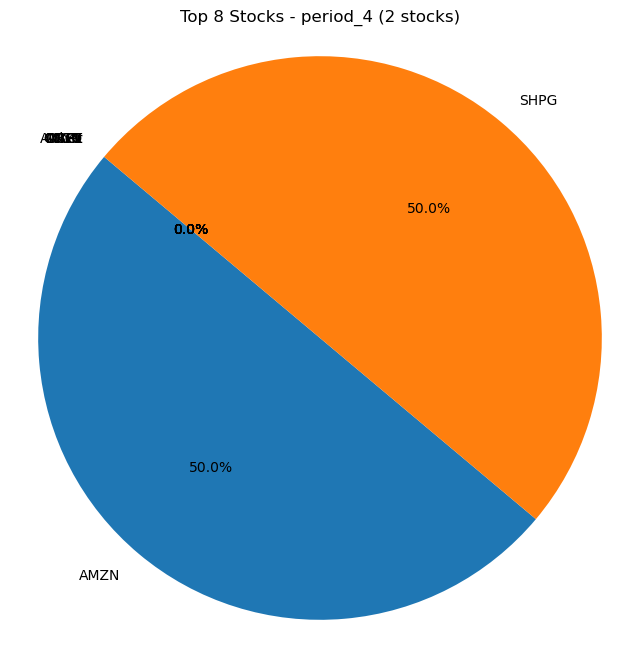

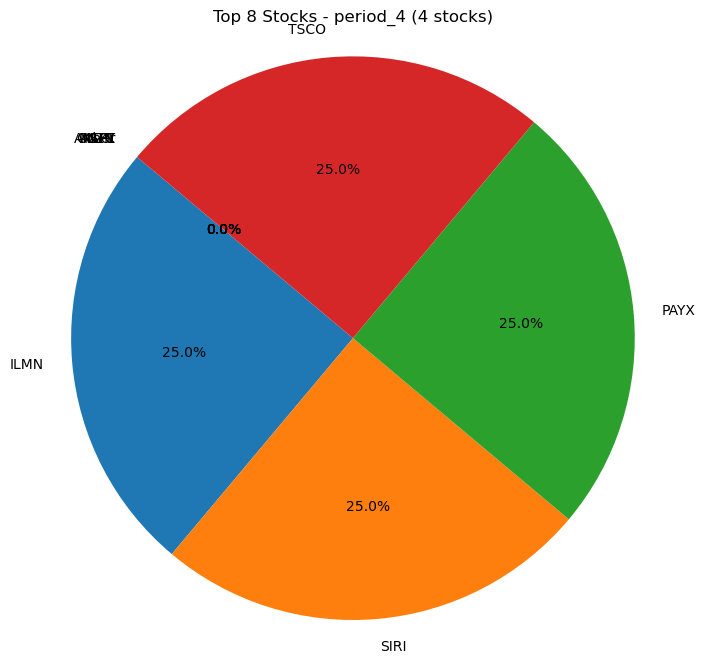

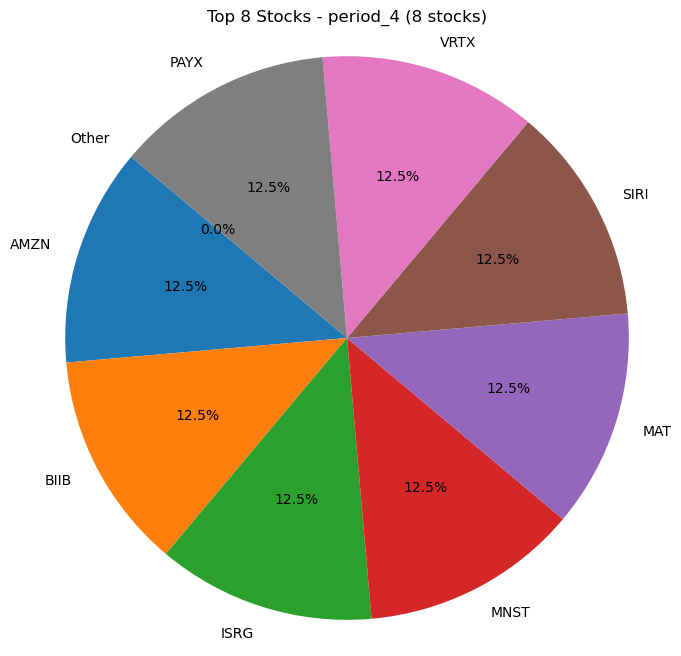

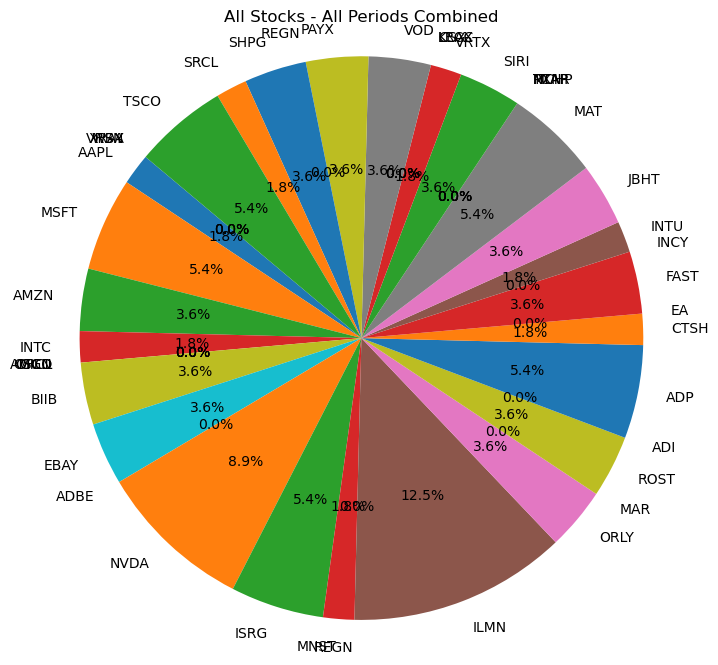

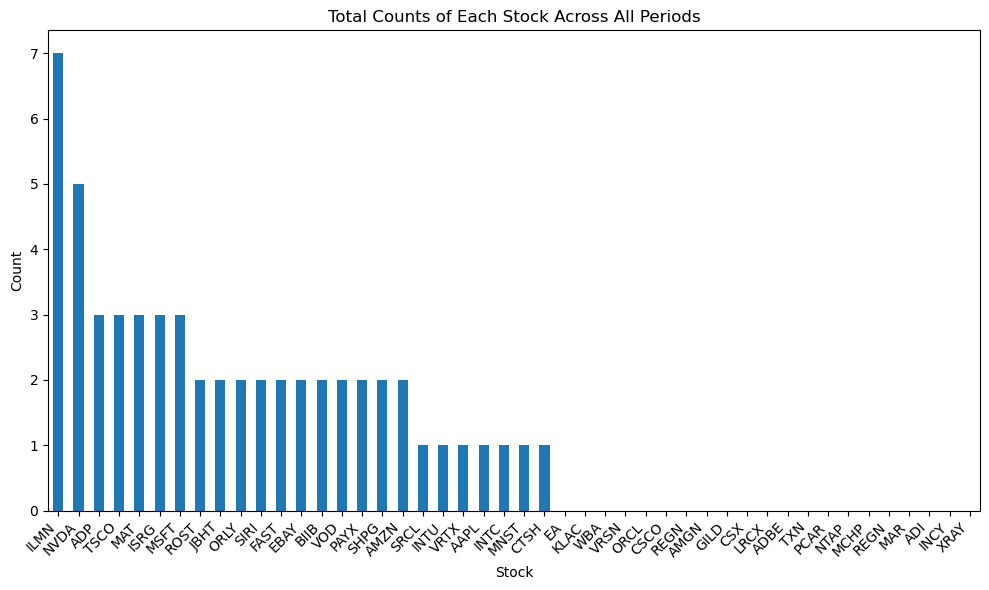

In [154]:
count_of_stocks(result_df_kmeans_test,custom_tickers_test)

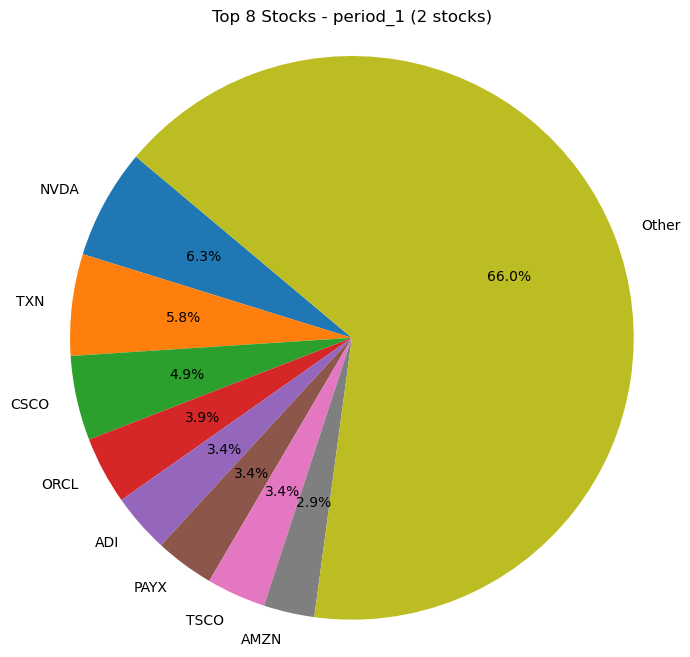

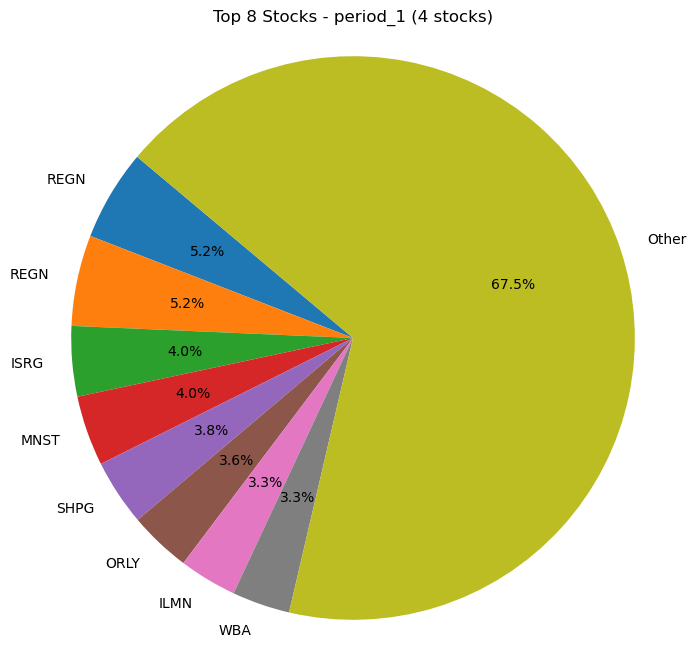

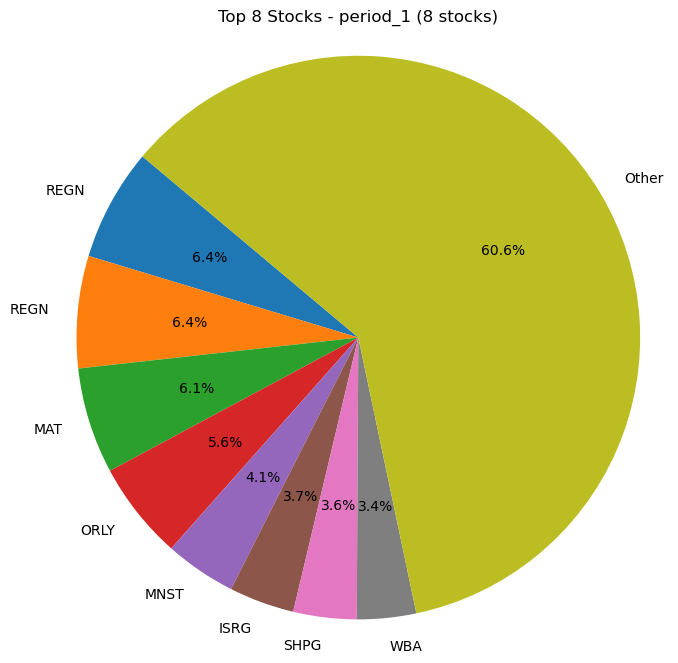

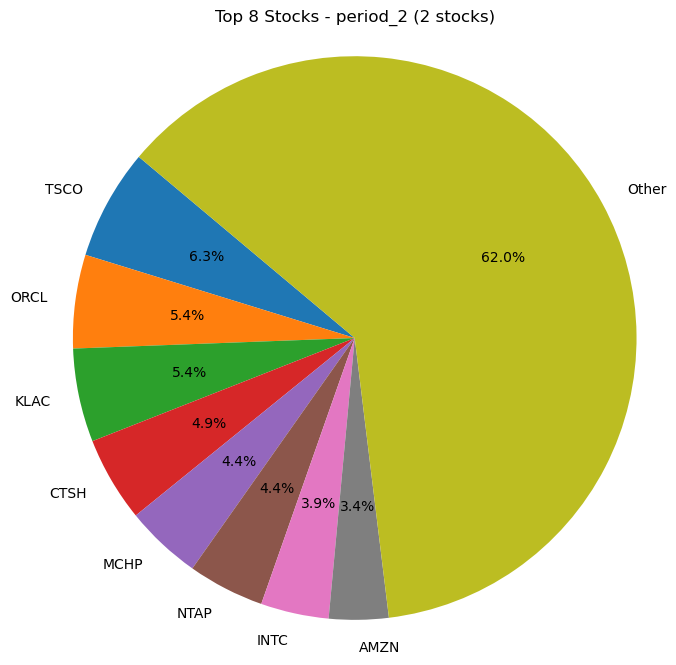

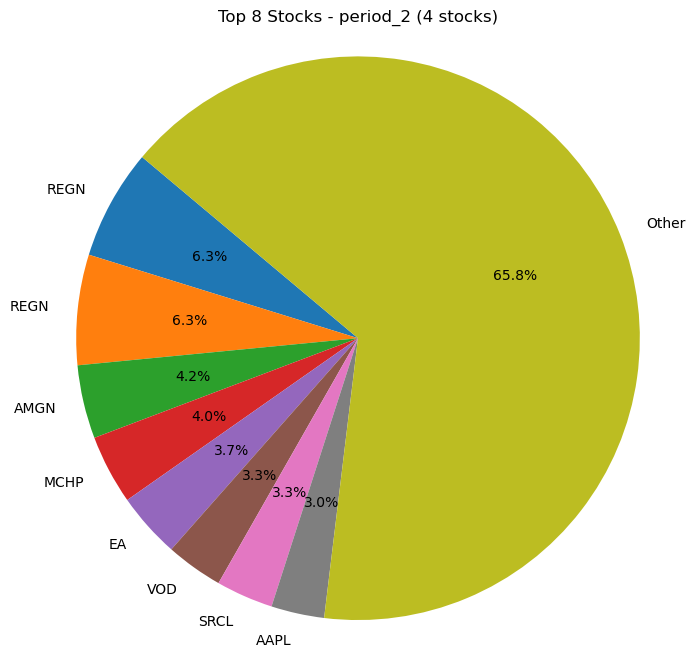

...

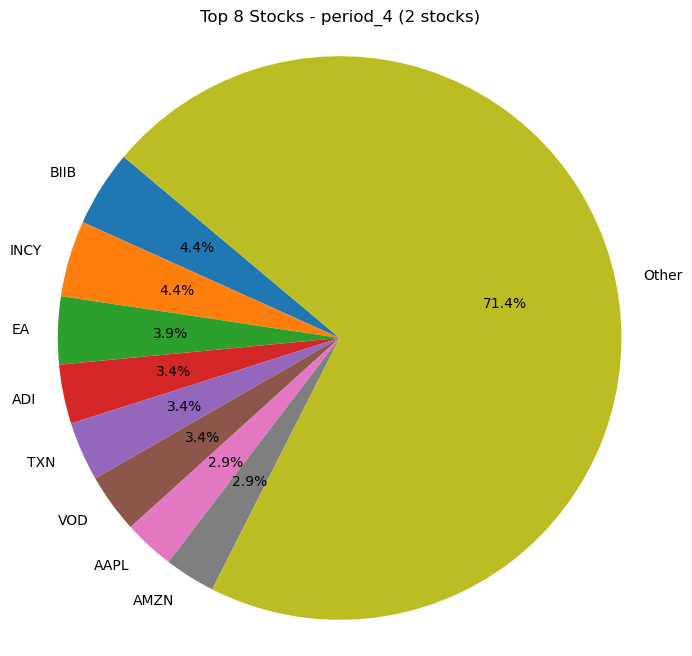

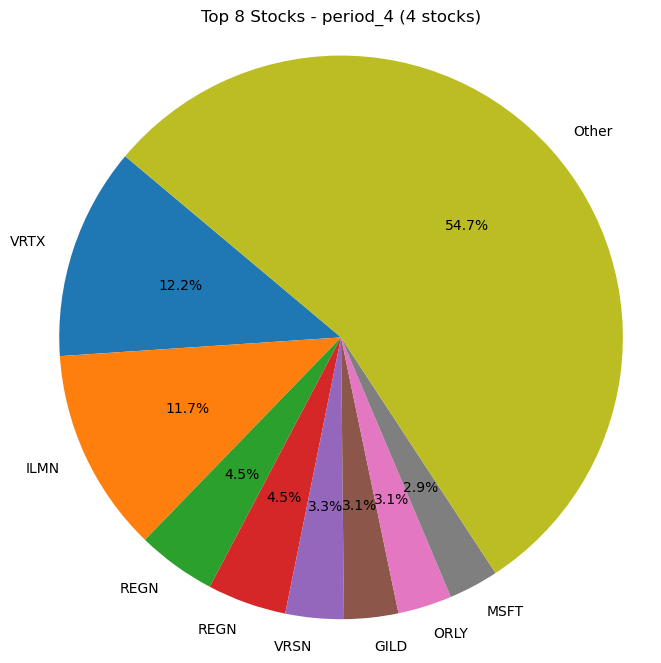

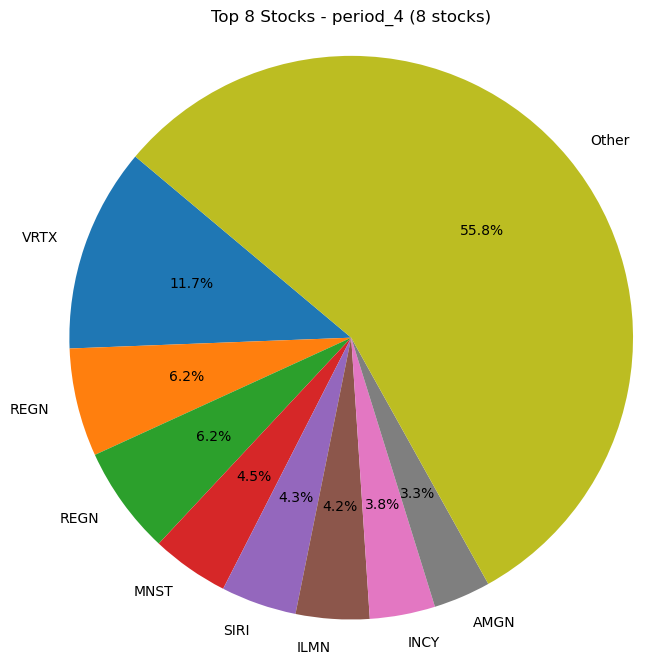

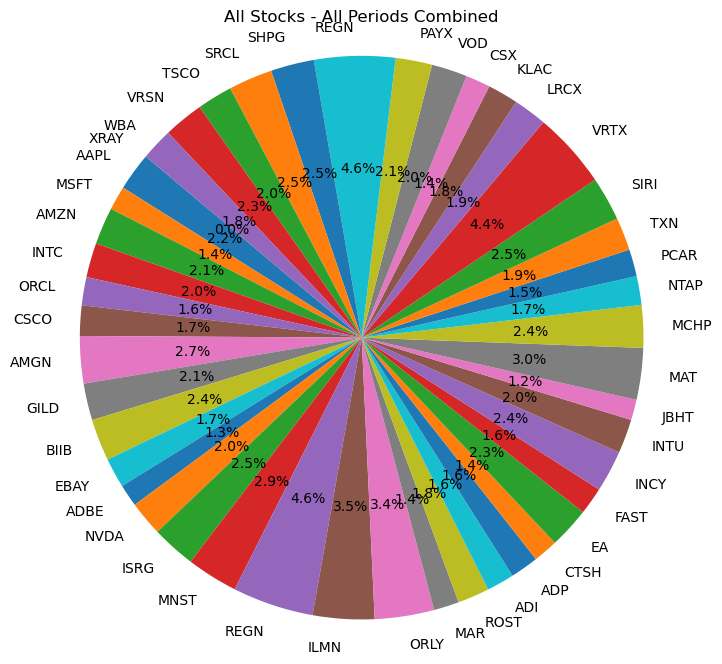

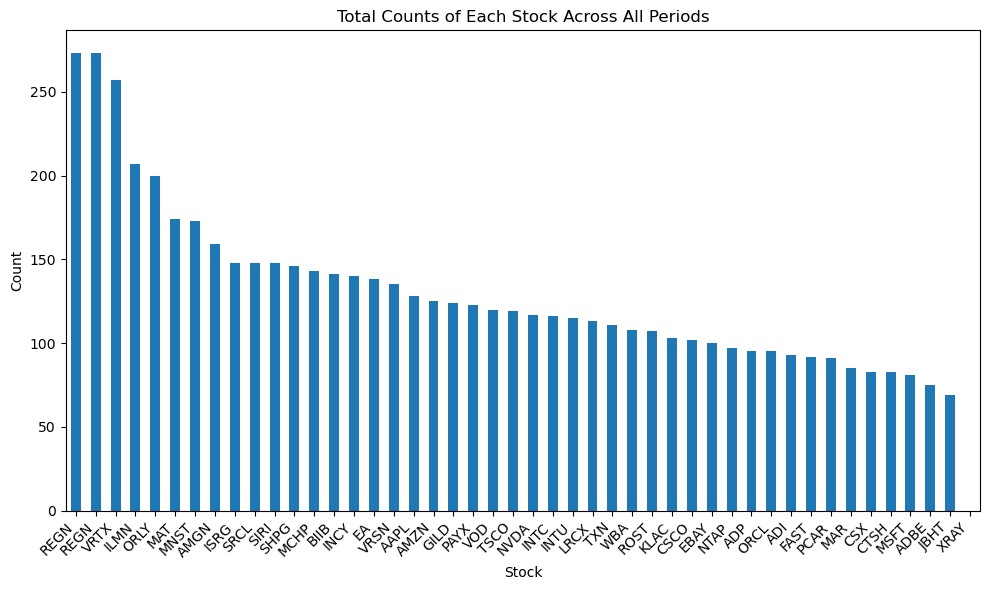

In [156]:
count_of_stocks(result_df_kmeans_rand_test,custom_tickers_test)

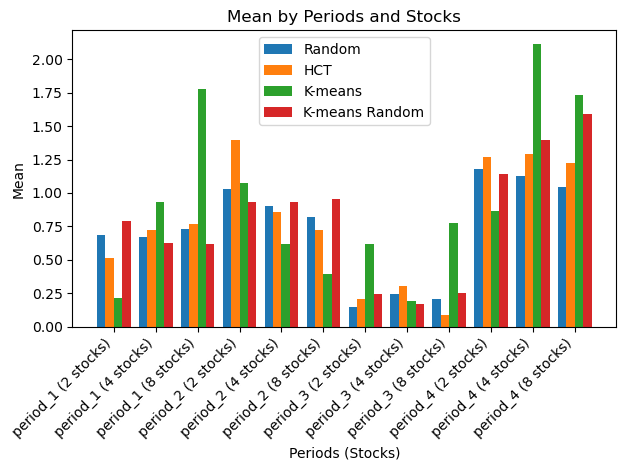

Total Average Mean of Random Values: 0.7332216678436055
Total Average Mean of Cluster Values: 0.7813158110309374
Total Average Mean of K-means Values: 0.9424929588334167
Total Average Mean of K-means Random Values: 0.8040300295508548

Period 1 Average Mean of Random Values: 0.695781193206699
Period 1 Average Mean of Cluster Values: 0.6680903195320812
Period 1 Average Mean of K-means Values: 0.9752243692286487
Period 1 Average Mean of K-means Random Values: 0.6769305764276297
Period 2 Average Mean of Random Values: 0.9176325668444899
Period 2 Average Mean of Cluster Values: 0.9943665933801281
Period 2 Average Mean of K-means Values: 0.6956103739515654
Period 2 Average Mean of K-means Random Values: 0.9386276902695917
Period 3 Average Mean of Random Values: 0.19956544864908343
Period 3 Average Mean of Cluster Values: 0.19868126748501283
Period 3 Average Mean of K-means Values: 0.5300094721187633
Period 3 Average Mean of K-means Random Values: 0.22404454198622004


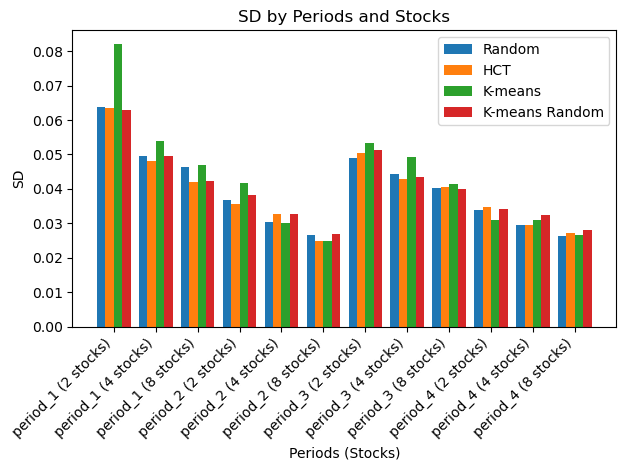

Total Average SD of Random Values: 0.03977267309962182
Total Average SD of Cluster Values: 0.03939431971895815
Total Average SD of K-means Values: 0.04269859207270435
Total Average SD of K-means Random Values: 0.04019215188832267

Period 1 Average SD of Random Values: 0.05324356804288815
Period 1 Average SD of Cluster Values: 0.051251074509318595
Period 1 Average SD of K-means Values: 0.060963807267125074
Period 1 Average SD of K-means Random Values: 0.05163237671647244
Period 2 Average SD of Random Values: 0.03133472216515689
Period 2 Average SD of Cluster Values: 0.031077515114892217
Period 2 Average SD of K-means Values: 0.03220825805581325
Period 2 Average SD of K-means Random Values: 0.03263885180659002
Period 3 Average SD of Random Values: 0.04446071246856723
Period 3 Average SD of Cluster Values: 0.04469077238569036
Period 3 Average SD of K-means Values: 0.04797561170927942
Period 3 Average SD of K-means Random Values: 0.044957194833995164


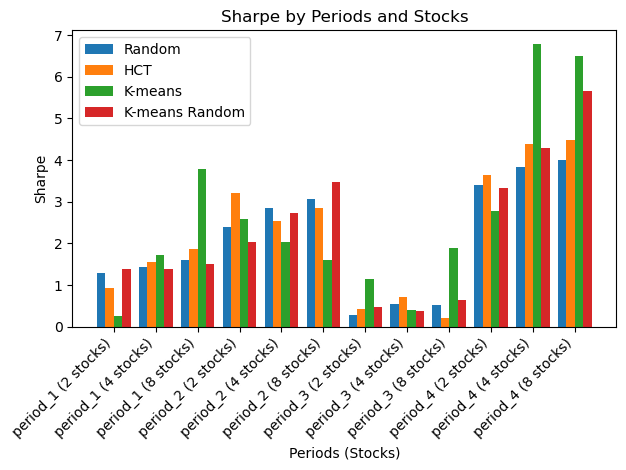

Total Average Sharpe of Random Values: 2.104466385086257
Total Average Sharpe of Cluster Values: 2.236345287486034
Total Average Sharpe of K-means Values: 2.6231875435325147
Total Average Sharpe of K-means Random Values: 2.2740478776161295

Period 1 Average Sharpe of Random Values: 1.4490804433608055
Period 1 Average Sharpe of Cluster Values: 1.45262190893047
Period 1 Average Sharpe of K-means Values: 1.9231287305500384
Period 1 Average Sharpe of K-means Random Values: 1.4206088218459436
Period 2 Average Sharpe of Random Values: 2.7686045300644118
Period 2 Average Sharpe of Cluster Values: 2.868859079959428
Period 2 Average Sharpe of K-means Values: 2.074114231942785
Period 2 Average Sharpe of K-means Random Values: 2.7509216834860357
Period 3 Average Sharpe of Random Values: 0.4549788481350978
Period 3 Average Sharpe of Cluster Values: 0.4495446690782476
Period 3 Average Sharpe of K-means Values: 1.144747915303982
Period 3 Average Sharpe of K-means Random Values: 0.5024829426109022


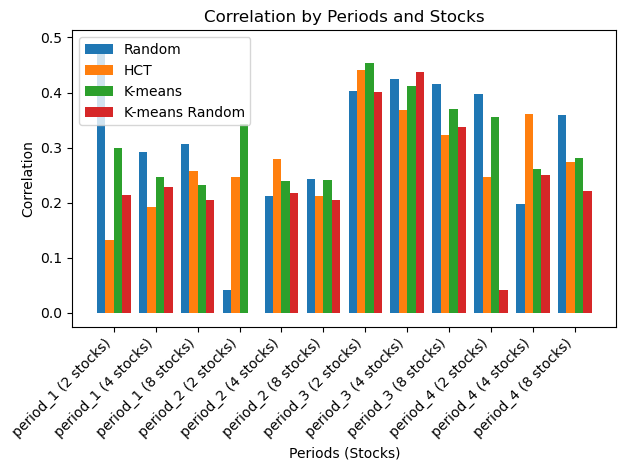

Total Average Correlation of Random Values: 0.31504288264479535
Total Average Correlation of Cluster Values: 0.2780417684902005
Total Average Correlation of K-means Values: 0.31122978350032526
Total Average Correlation of K-means Random Values: 0.22982001004972527

Period 1 Average Correlation of Random Values: 0.36214666814684265
Period 1 Average Correlation of Cluster Values: 0.19485016402160768
Period 1 Average Correlation of K-means Values: 0.2595256495088718
Period 1 Average Correlation of K-means Random Values: 0.21580001279830666
Period 2 Average Correlation of Random Values: 0.16608362067109098
Period 2 Average Correlation of Cluster Values: 0.24593462347491957
Period 2 Average Correlation of K-means Values: 0.27451262178083874
Period 2 Average Correlation of K-means Random Values: 0.14006790375092484
Period 3 Average Correlation of Random Values: 0.41391232252367255
Period 3 Average Correlation of Cluster Values: 0.3775621538905536
Period 3 Average Correlation of K-means Value

In [115]:
# Plotting Mean
plot_metric('Mean',result_df_random_test,result_df_HCT_test,result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting SD
plot_metric('SD',result_df_random_test,result_df_HCT_test,result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test,result_df_HCT_test,result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test,result_df_HCT_test,result_df_kmeans_test,result_df_kmeans_rand_test)

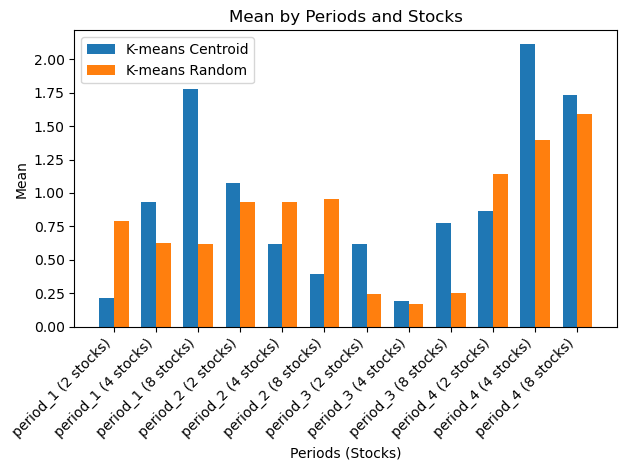

Total Average Mean of K-means Centroid Values: 0.9424929588334167
Total Average Mean of K-means Random Values: 0.8040300295508548

Period 1 Average Mean of K-means Centroid Values: 0.9752243692286487
Period 1 Average Mean of K-means Random Values: 0.6769305764276297
Period 2 Average Mean of K-means Centroid Values: 0.6956103739515654
Period 2 Average Mean of K-means Random Values: 0.9386276902695917
Period 3 Average Mean of K-means Centroid Values: 0.5300094721187633
Period 3 Average Mean of K-means Random Values: 0.22404454198622004


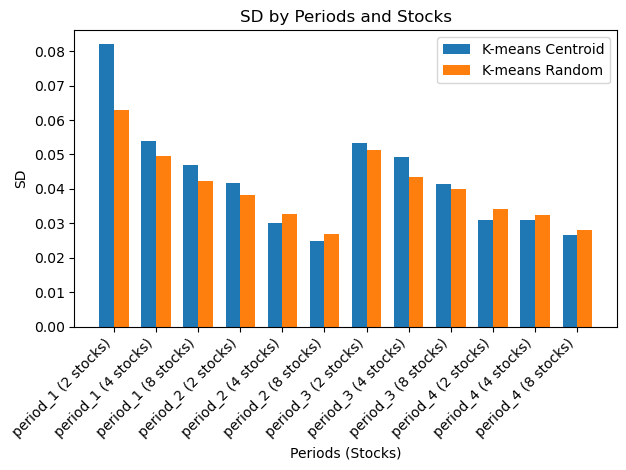

Total Average SD of K-means Centroid Values: 0.04269859207270435
Total Average SD of K-means Random Values: 0.04019215188832267

Period 1 Average SD of K-means Centroid Values: 0.060963807267125074
Period 1 Average SD of K-means Random Values: 0.05163237671647244
Period 2 Average SD of K-means Centroid Values: 0.03220825805581325
Period 2 Average SD of K-means Random Values: 0.03263885180659002
Period 3 Average SD of K-means Centroid Values: 0.04797561170927942
Period 3 Average SD of K-means Random Values: 0.044957194833995164


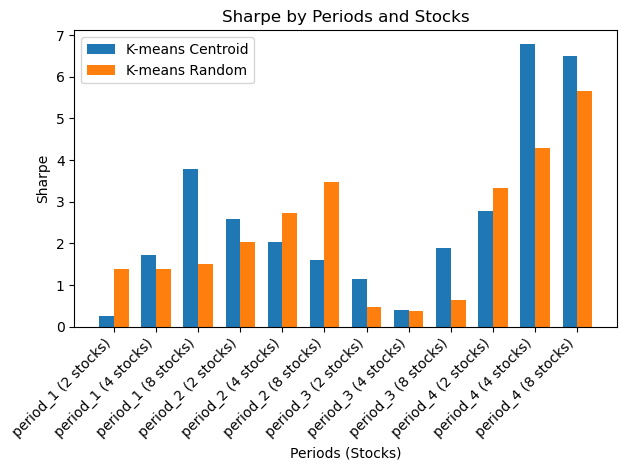

Total Average Sharpe of K-means Centroid Values: 2.6231875435325147
Total Average Sharpe of K-means Random Values: 2.2740478776161295

Period 1 Average Sharpe of K-means Centroid Values: 1.9231287305500384
Period 1 Average Sharpe of K-means Random Values: 1.4206088218459436
Period 2 Average Sharpe of K-means Centroid Values: 2.074114231942785
Period 2 Average Sharpe of K-means Random Values: 2.7509216834860357
Period 3 Average Sharpe of K-means Centroid Values: 1.144747915303982
Period 3 Average Sharpe of K-means Random Values: 0.5024829426109022


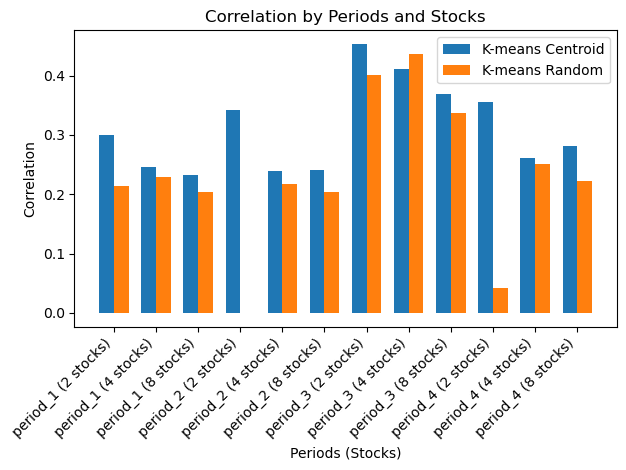

Total Average Correlation of K-means Centroid Values: 0.31122978350032526
Total Average Correlation of K-means Random Values: 0.22982001004972527

Period 1 Average Correlation of K-means Centroid Values: 0.2595256495088718
Period 1 Average Correlation of K-means Random Values: 0.21580001279830666
Period 2 Average Correlation of K-means Centroid Values: 0.27451262178083874
Period 2 Average Correlation of K-means Random Values: 0.14006790375092484
Period 3 Average Correlation of K-means Centroid Values: 0.41167562412606573
Period 3 Average Correlation of K-means Random Values: 0.3920424269128502


In [144]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test,result_df_kmeans_rand_test)

In [119]:
############# Out of sampling testing: time ##############

In [121]:
def calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_stocks = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlations = []
            selected_stocks_list = {}

            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(train_returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]

            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}
        results_by_period[test_period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

In [122]:
num_stocks_list = [2, 4, 8]
result_df_random_test1 = calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list)
result_df_random_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.259866,0.021823,1.234823,0.248926,"[HPQ, MRK, AXP, MSFT, DD, HD, RTX, GE, CVX, MM..."
period_2 (4 stocks),0.252590,0.018247,1.420121,0.244006,"[MMM, MSFT, GE, MCD, PG, AXP, VZ, MMM, T, GE, ..."
period_2 (8 stocks),0.254087,0.016074,1.598606,0.245693,"[TRV, HD, MMM, WMT, DD, HPQ, CCEP, XOM, MMM, J..."
period_3 (2 stocks),-0.024255,0.044116,-0.023628,0.500421,"[INTC, WMT, T, GE, GE, JNJ, T, IBM, JPM, JNJ, ..."
period_3 (4 stocks),-0.005770,0.039986,0.004316,0.503301,"[JPM, AXP, TRV, WMT, MCD, XOM, TRV, MMM, XOM, ..."
period_3 (8 stocks),0.007119,0.037677,0.025737,0.501194,"[MSFT, XOM, MRK, HD, HPQ, JPM, DD, TRV, PFE, A..."
period_4 (2 stocks),0.425161,0.027229,1.724553,0.480846,"[GE, PFE, BA, JPM, HPQ, HD, INTC, TRV, DIS, IB..."
period_4 (4 stocks),0.432480,0.024879,1.829360,0.488587,"[HPQ, DIS, AXP, CAT, T, RTX, CCEP, BA, GE, HPQ..."
period_4 (8 stocks),0.425884,0.023473,1.857128,0.488671,"[JNJ, XOM, MCD, CAT, DD, PFE, RTX, MSFT, MRK, ..."


In [127]:
def calculate_metrics_for_all_clusters_test(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        selected_stocks_list = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]

                try:
                    selected_stocks_list[num_clusters] = np.concatenate([selected_stocks_list[num_clusters], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)

            final_stocks_list = [selected_stocks_list[num_clusters]]

            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}

        results_by_period[test_period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [128]:
result_df_HCT_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_HCT, period_dfs)
result_df_HCT_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.239118,0.021086,1.211595,0.179876,"[MCD, CAT, MCD, CVX, PFE, TRV, MRK, CAT, VZ, G..."
period_2 (4 stocks),0.206982,0.017484,1.224730,0.187126,"[JNJ, AXP, CCEP, HPQ, PFE, DD, VZ, INTC, PG, G..."
period_2 (8 stocks),0.275955,0.014808,1.884671,0.195707,"[PG, CVX, MCD, T, IBM, AXP, BA, CCEP, PG, HD, ..."
period_3 (2 stocks),-0.023523,0.040546,-0.037463,0.477392,"[CCEP, MCD, MRK, MMM, MRK, AXP, PG, JPM, JNJ, ..."
period_3 (4 stocks),0.015646,0.037366,0.053450,0.498864,"[MRK, XOM, CAT, VZ, JNJ, XOM, DIS, HPQ, JNJ, C..."
period_3 (8 stocks),0.030898,0.034002,0.094956,0.509643,"[PG, MRK, CVX, MCD, VZ, HPQ, DD, CCEP, PG, PFE..."
period_4 (2 stocks),0.439855,0.026372,1.783481,0.453925,"[MRK, CAT, PFE, DD, WMT, IBM, JNJ, DD, PFE, IB..."
period_4 (4 stocks),0.419822,0.025246,1.710893,0.503180,"[MCD, XOM, HD, DD, PG, T, DIS, JPM, MSFT, CVX,..."
period_4 (8 stocks),0.481564,0.021828,2.228527,0.479278,"[PFE, XOM, MSFT, T, HPQ, TRV, BA, JPM, MRK, CV..."


In [129]:
result_df_kmeans_rand_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.226981,0.020880,1.167335,0.175873,"[PFE, XOM, MCD, AXP, JNJ, AA, T, AA, MCD, GE, ..."
period_2 (4 stocks),0.216633,0.017265,1.294736,0.207162,"[MSFT, CAT, T, JNJ, MSFT, CAT, VZ, PG, INTC, W..."
period_2 (8 stocks),0.181027,0.014984,1.231809,0.207938,"[PFE, GE, IBM, T, CCEP, TRV, INTC, HD, PG, AA,..."
period_3 (2 stocks),-0.040338,0.040810,-0.079459,0.473566,"[T, PFE, DD, JNJ, AXP, CCEP, DIS, JNJ, IBM, JN..."
period_3 (4 stocks),0.010117,0.037159,0.039077,0.494290,"[DIS, CVX, AA, MRK, GE, CVX, DD, PG, IBM, XOM,..."
period_3 (8 stocks),0.042685,0.036964,0.121230,0.510959,"[MRK, IBM, XOM, T, DD, CCEP, INTC, WMT, PG, IB..."
period_4 (2 stocks),0.457406,0.026038,1.867099,0.448701,"[PG, AXP, WMT, DD, TRV, GE, TRV, MMM, MRK, GE,..."
period_4 (4 stocks),0.397748,0.025395,1.644111,0.471551,"[HPQ, AA, MRK, HD, IBM, CAT, MCD, GE, IBM, MMM..."
period_4 (8 stocks),0.470200,0.021374,2.224297,0.469742,"[CVX, BA, HPQ, VZ, GE, TRV, MRK, WMT, XOM, DIS..."


In [130]:
def calculate_metrics_for_kmeans_test(all_cluster_stocks, period_dfs, centroid_vectors, distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        stocks_by_cluster = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[train_period][str(num_clusters)]
                distance_matrix = distance_matrices[train_period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks": [selected_stocks]}

        results_by_period[test_period] = results_by_cluster
        stocks_by_period[test_period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [131]:
result_df_kmeans_test1, stocks_by_period_kmeans_test1 = calculate_metrics_for_kmeans_test(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)
result_df_kmeans_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),-0.062222,0.024382,-0.255193,0.150983,"[MRK, WMT]"
period_2 (4 stocks),0.246710,0.016889,1.460807,0.164507,"[DIS, GE, T, MRK]"
period_2 (8 stocks),0.169327,0.014393,1.176452,0.198846,"[MRK, GE, IBM, T, CCEP, TRV, DIS, WMT]"
period_3 (2 stocks),-0.152147,0.038371,-0.396513,0.452278,"[TRV, PFE]"
period_3 (4 stocks),-0.148859,0.035693,-0.417053,0.498239,"[TRV, XOM, BA, PFE]"
period_3 (8 stocks),0.089131,0.032418,0.274946,0.485924,"[PFE, TRV, XOM, MSFT, RTX, CCEP, INTC, MCD]"
period_4 (2 stocks),1.042642,0.031509,3.309010,0.343359,"[CCEP, DIS]"
period_4 (4 stocks),0.807548,0.024208,3.335849,0.345899,"[INTC, CCEP, PFE, HD]"
period_4 (8 stocks),0.641711,0.020273,3.165272,0.403283,"[CVX, CCEP, INTC, VZ, AXP, TRV, PFE, PG]"


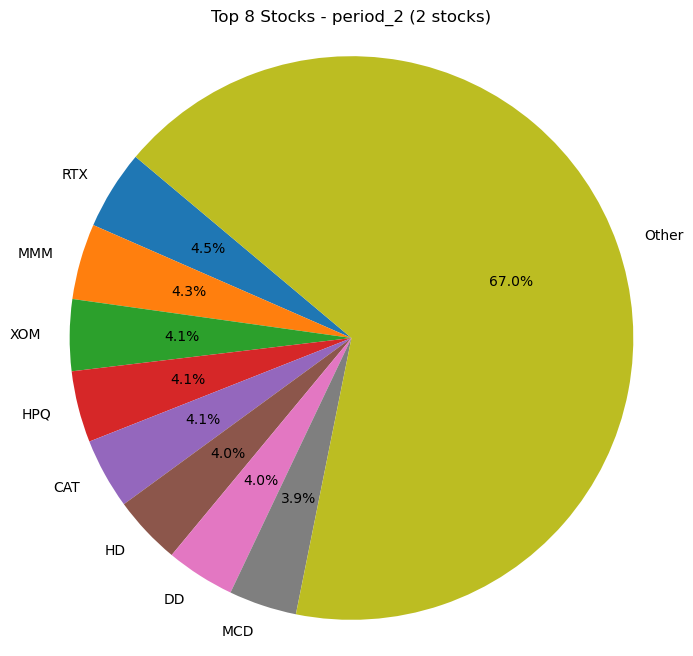

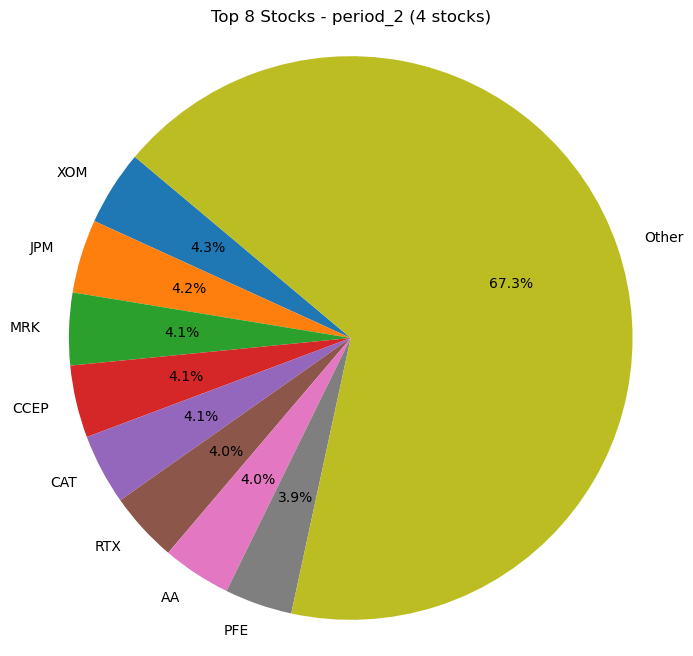

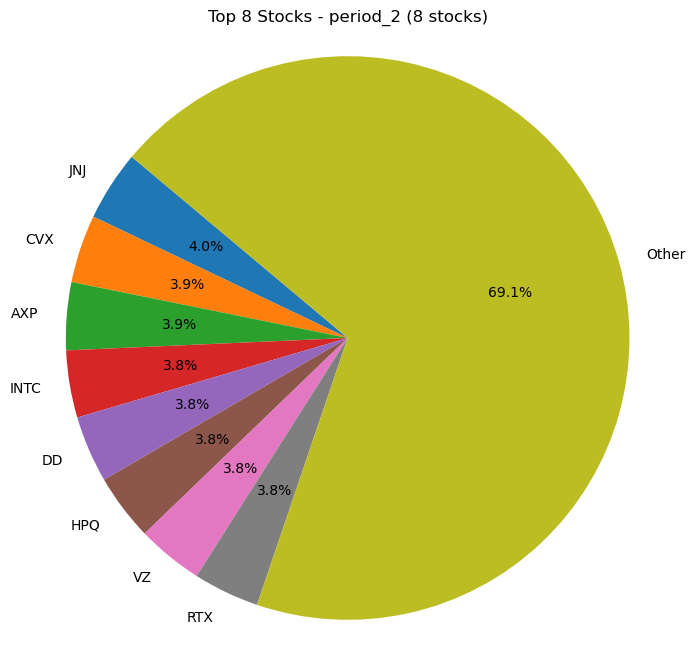

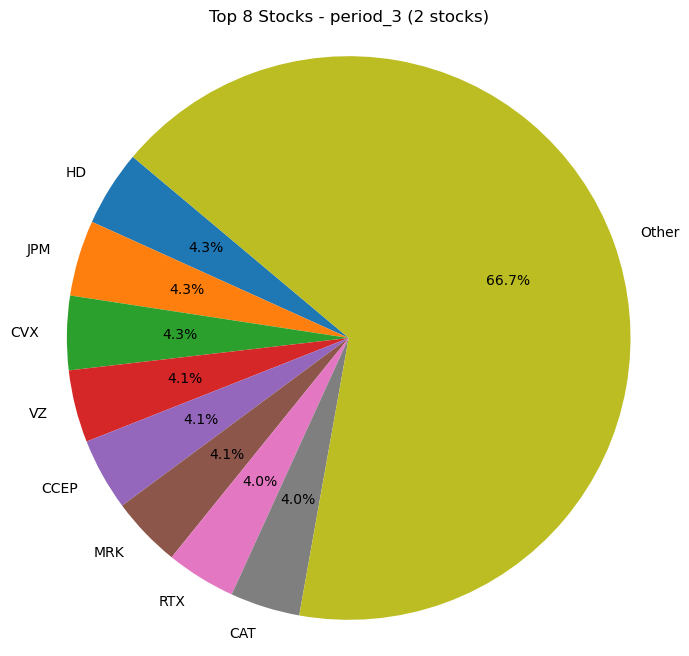

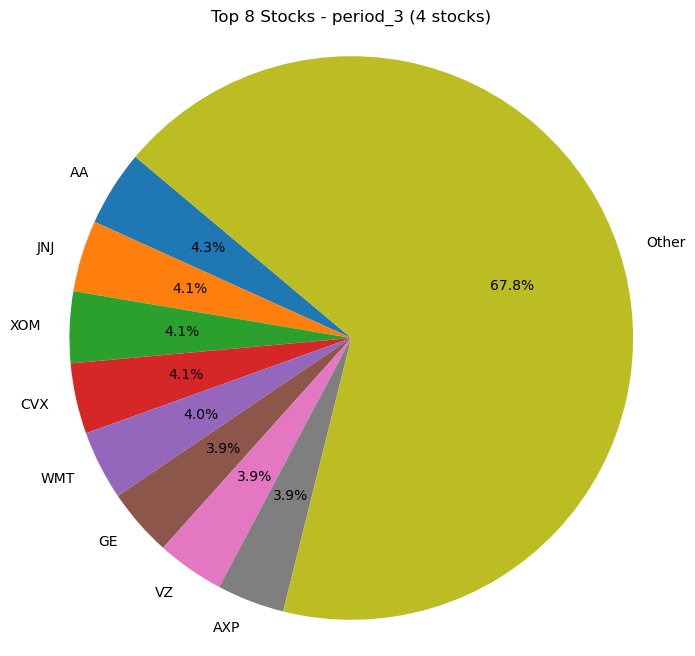

...

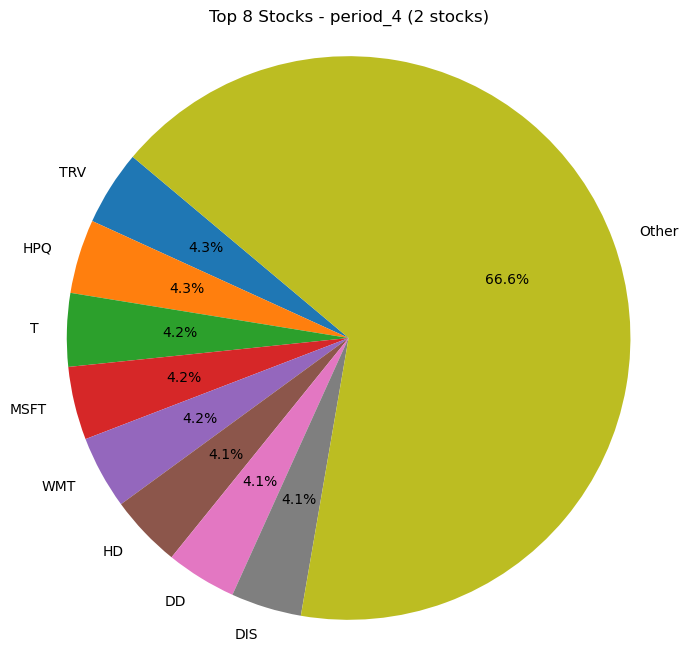

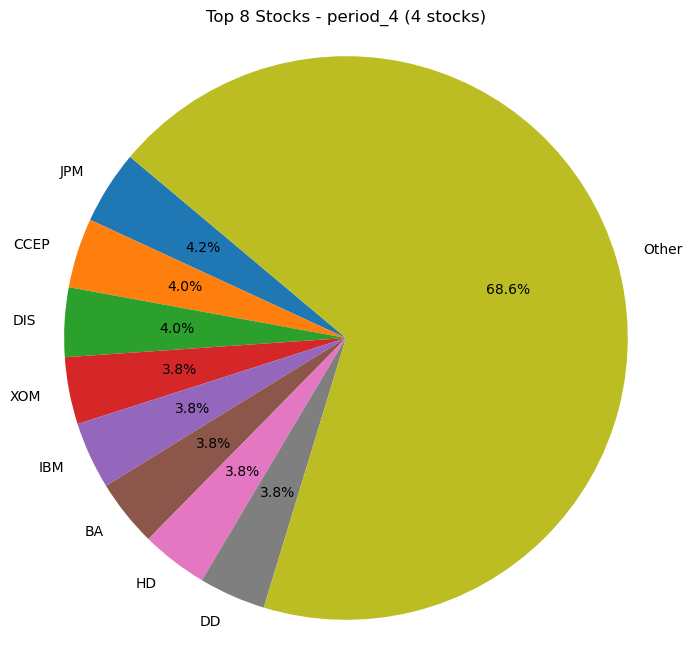

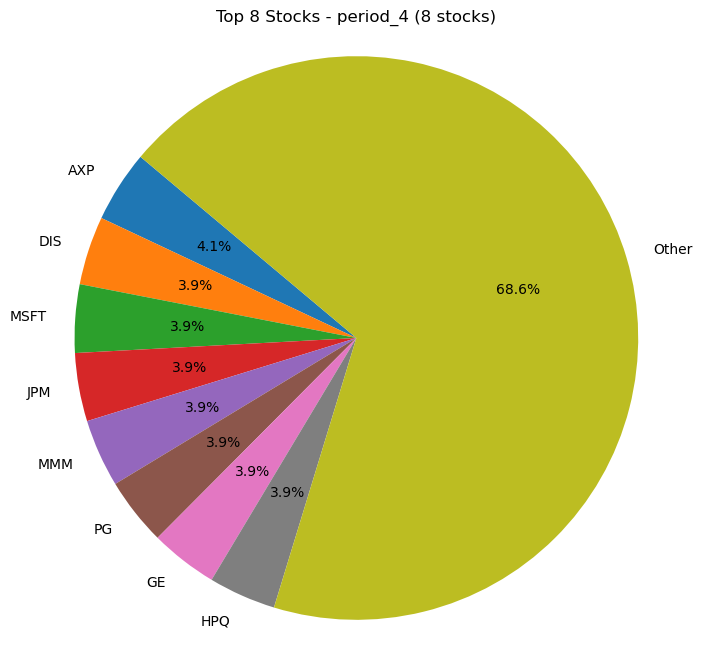

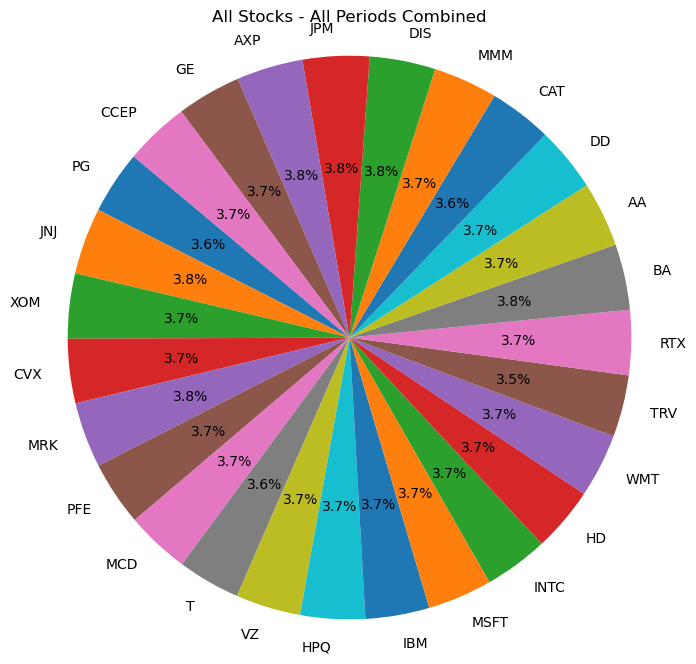

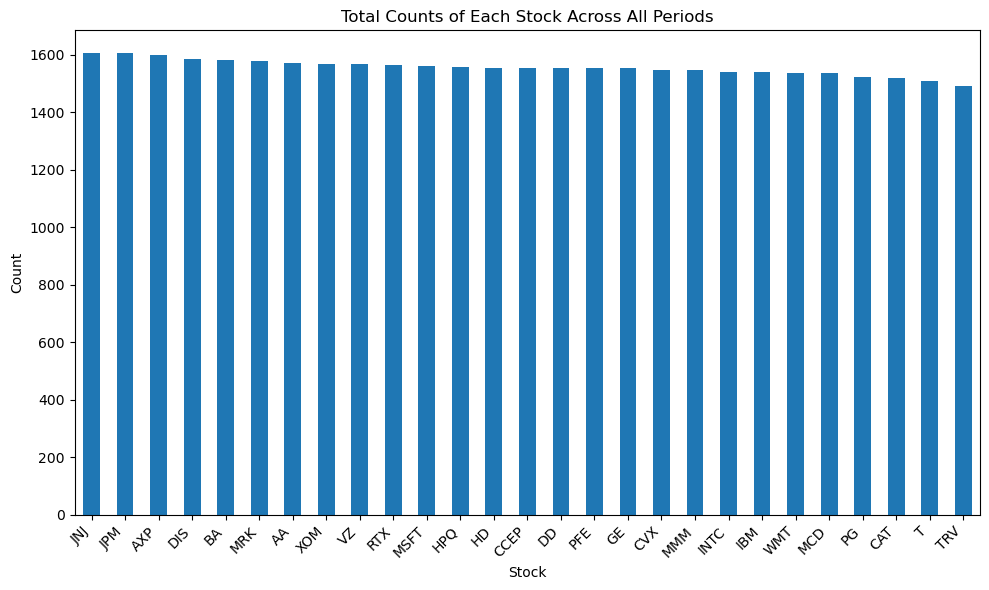

In [132]:
count_of_stocks(result_df_random_test1)

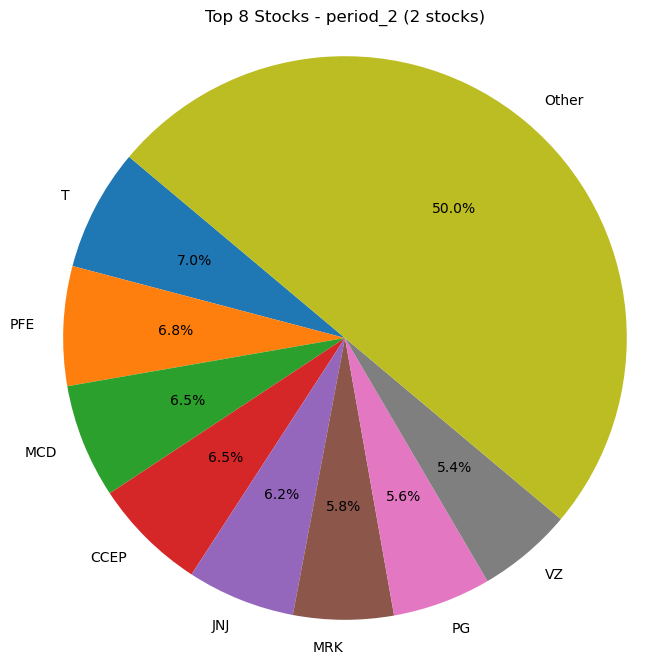

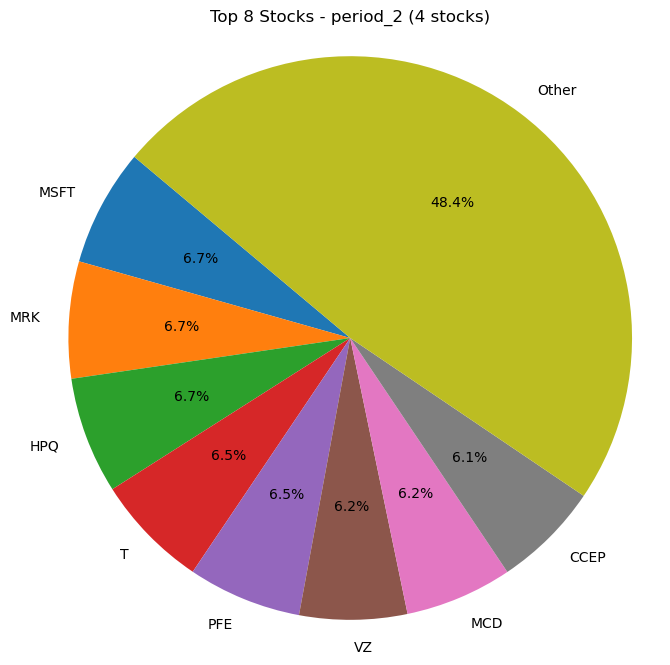

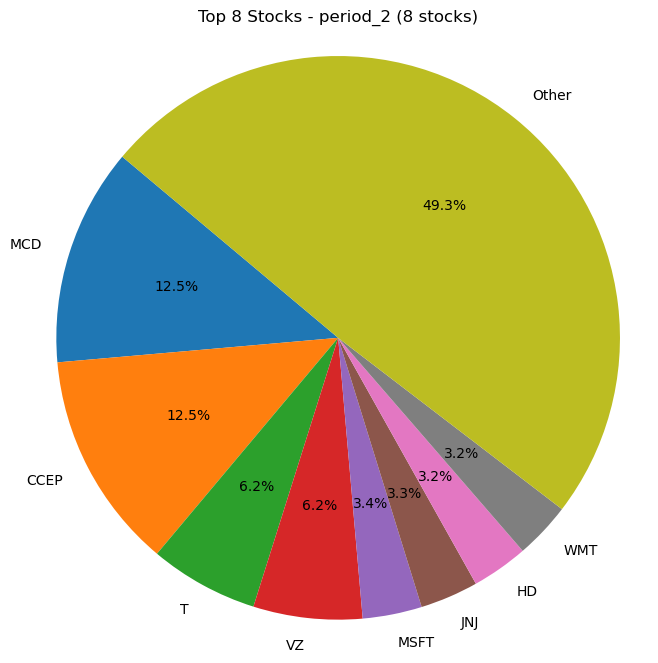

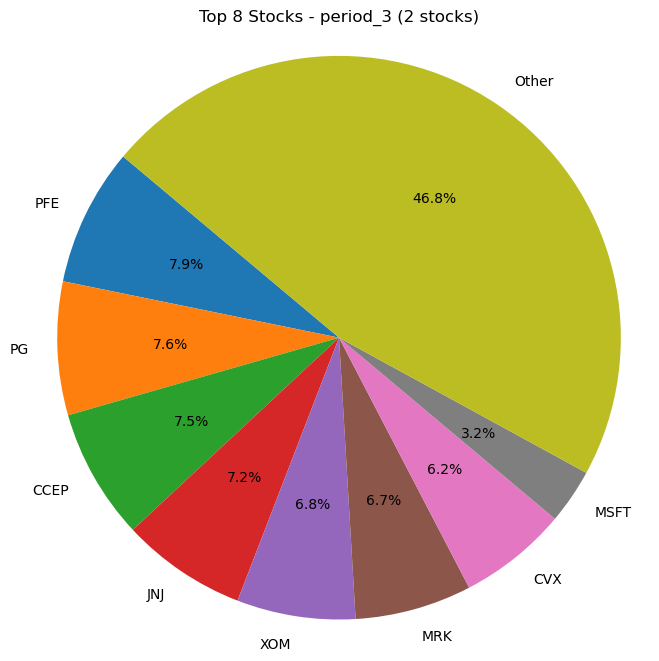

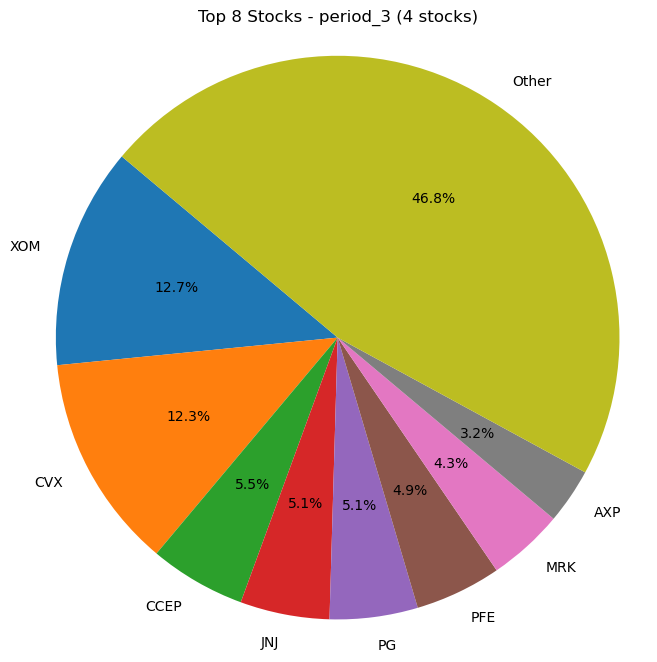

...

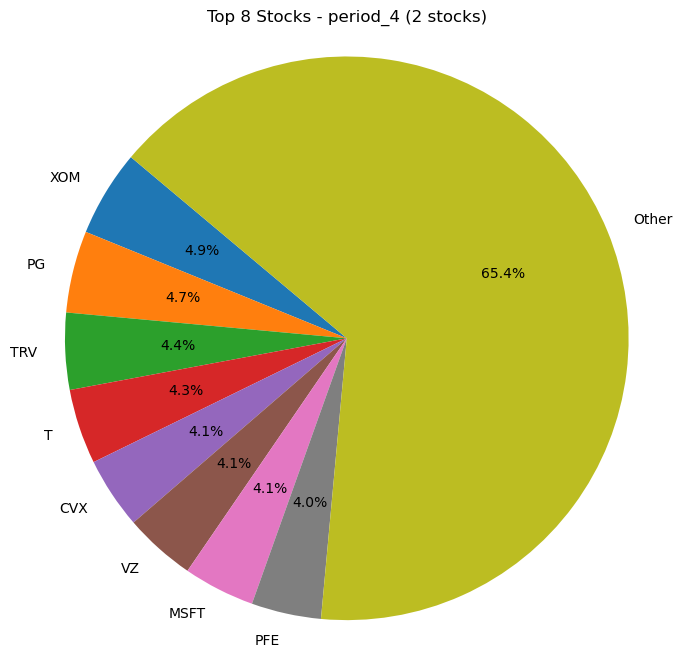

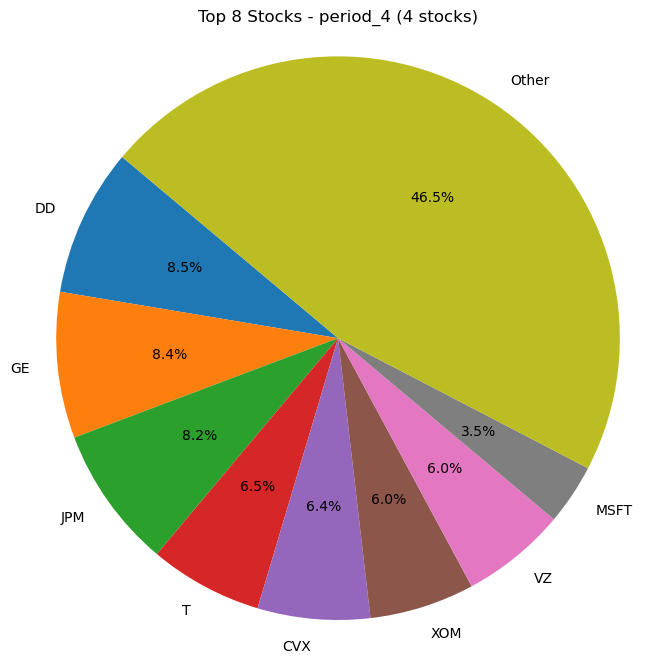

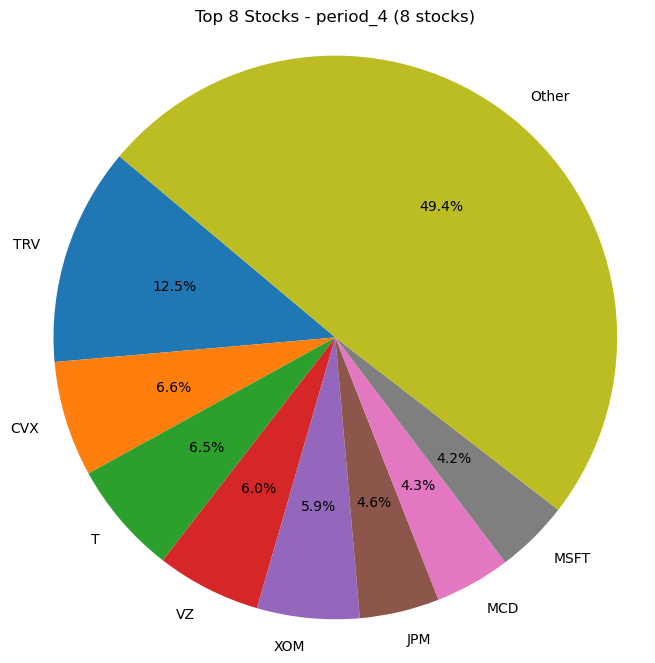

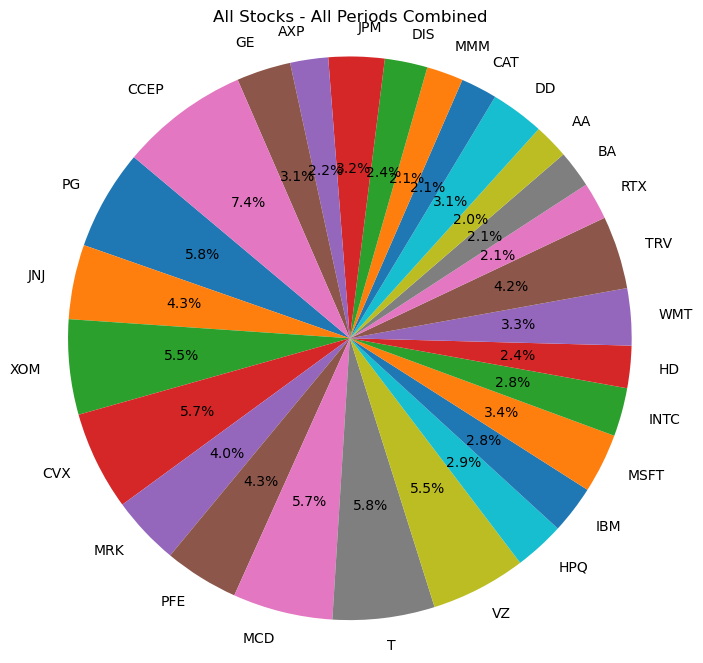

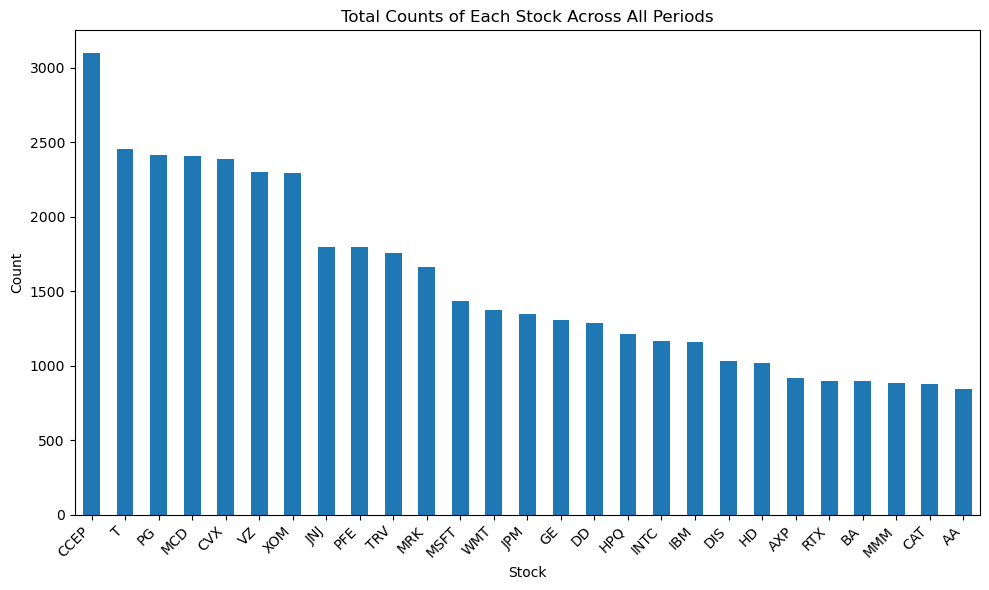

In [133]:
count_of_stocks(result_df_HCT_test1)

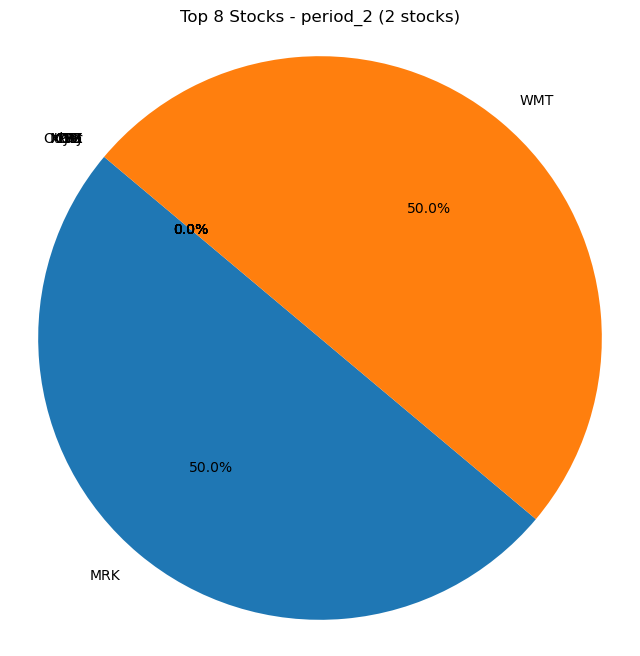

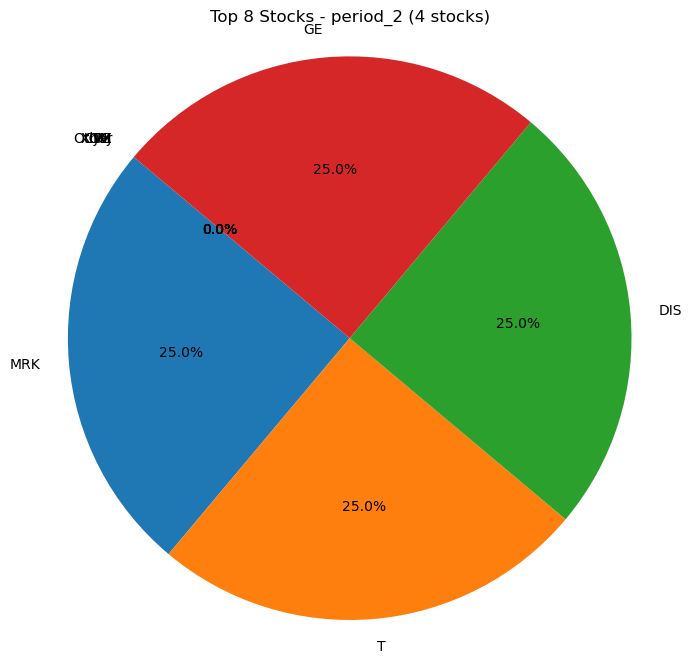

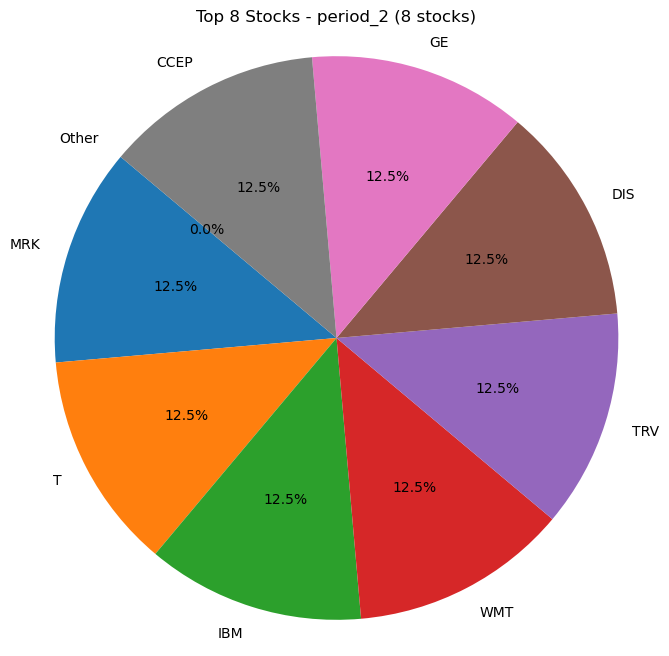

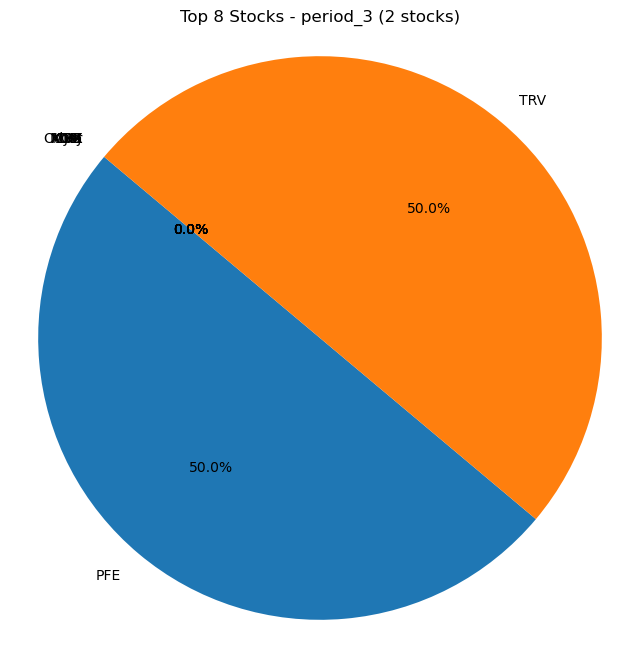

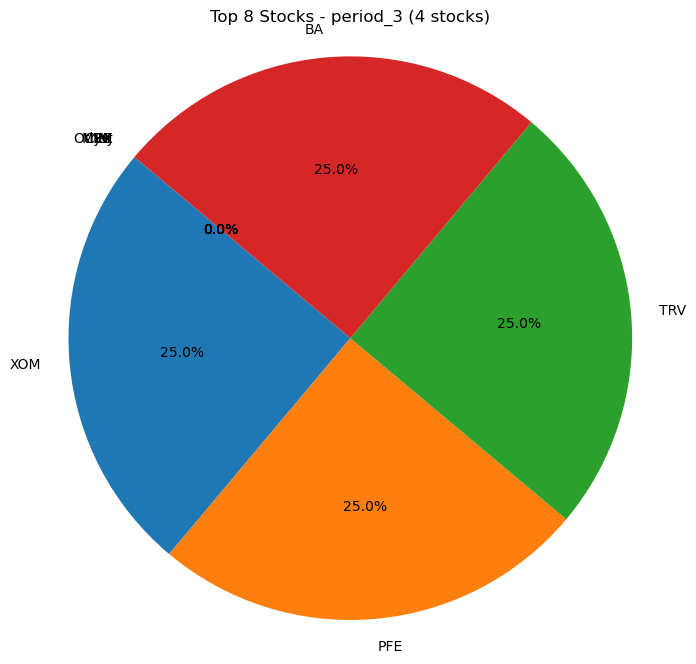

...

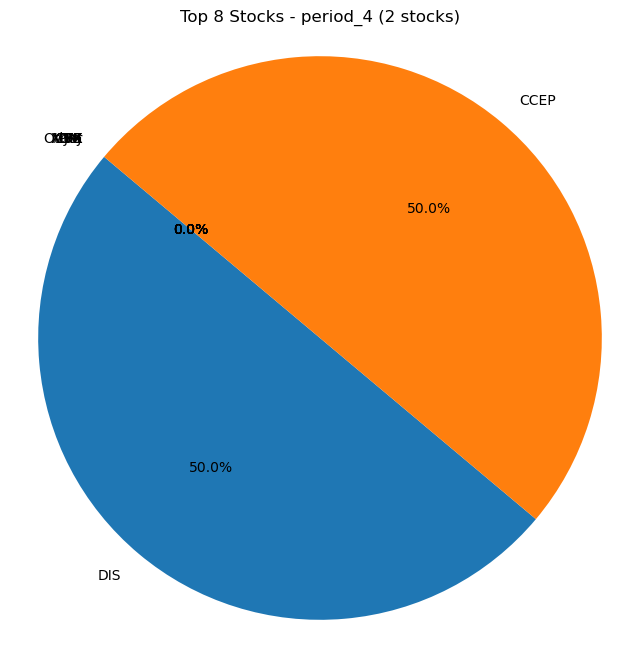

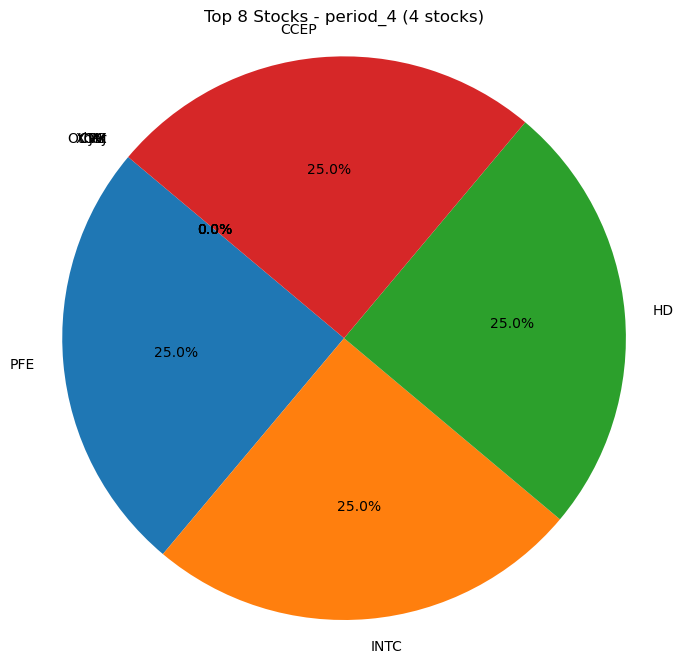

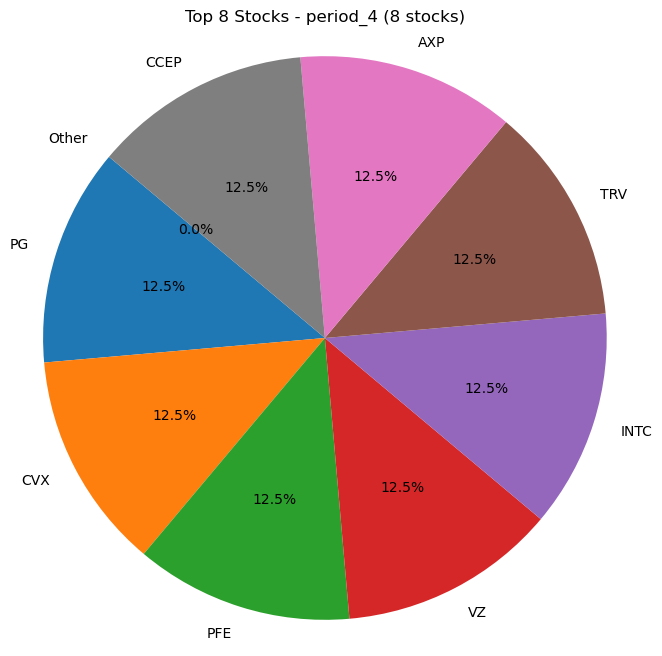

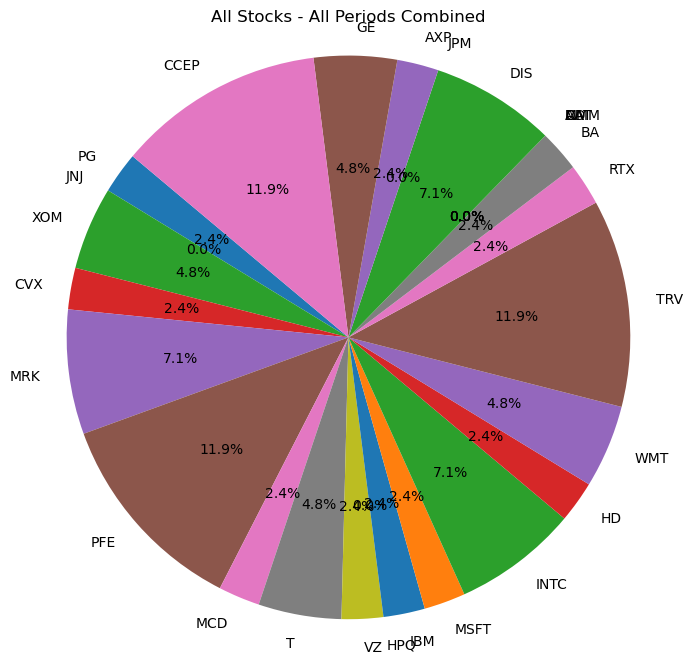

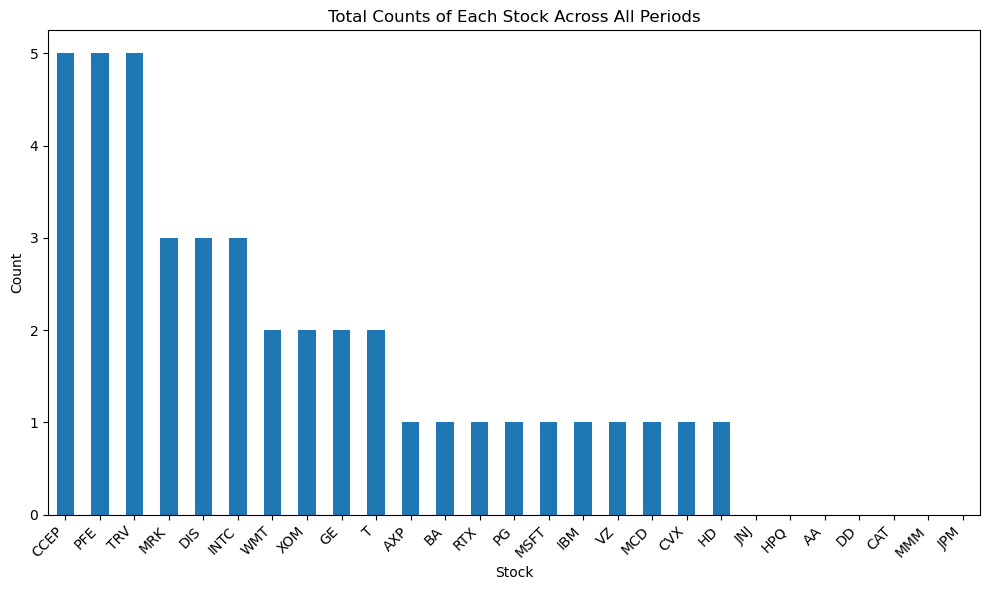

In [134]:
count_of_stocks(result_df_kmeans_test1)

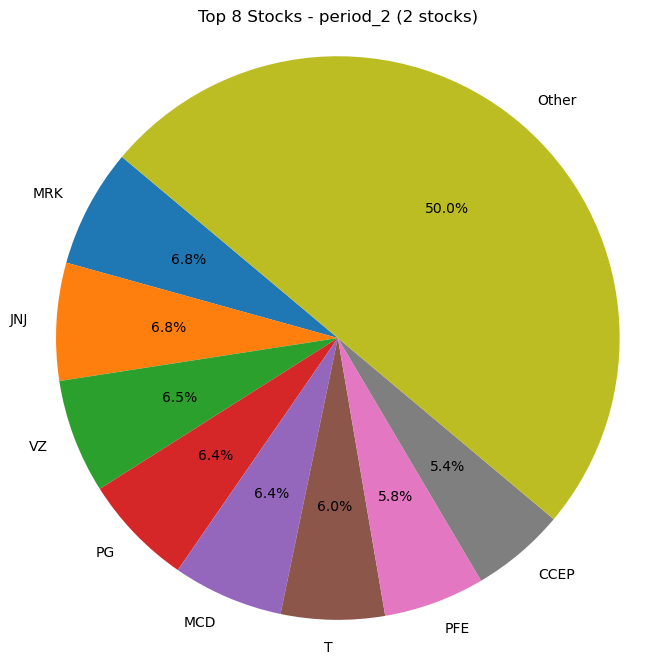

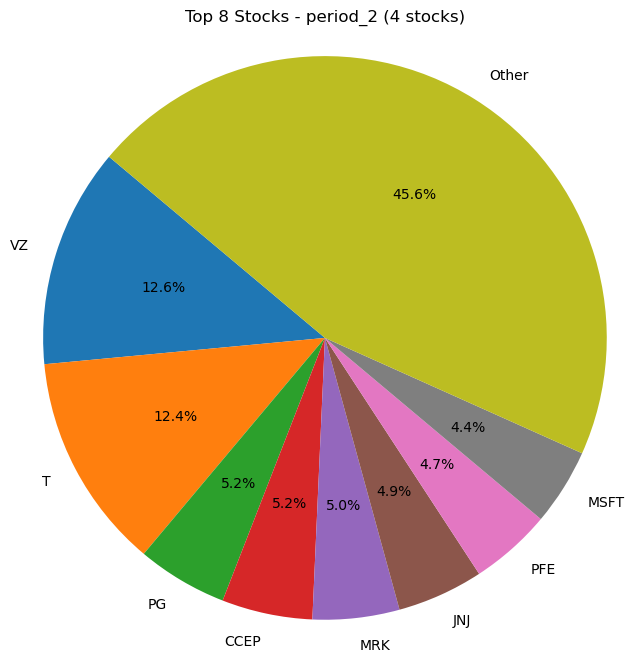

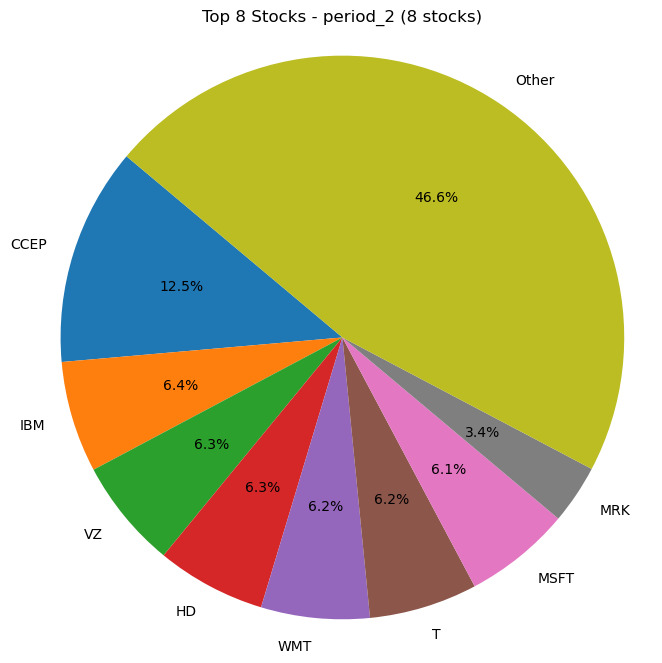

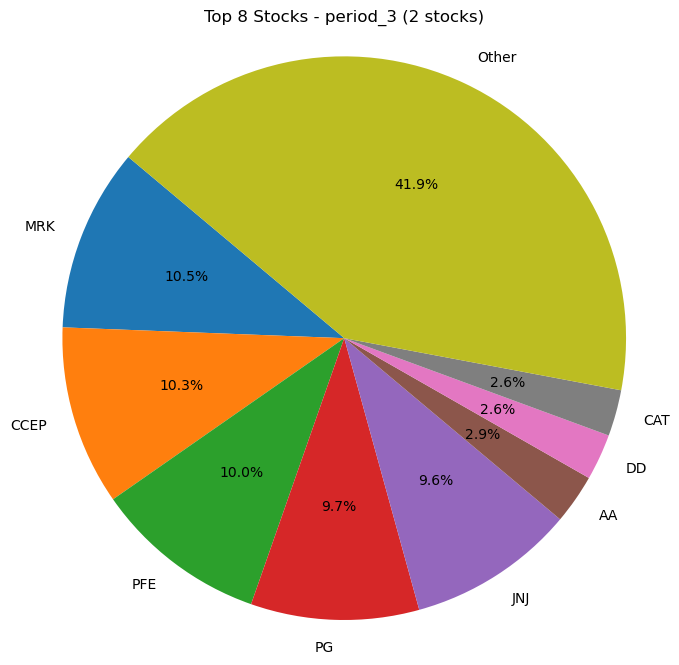

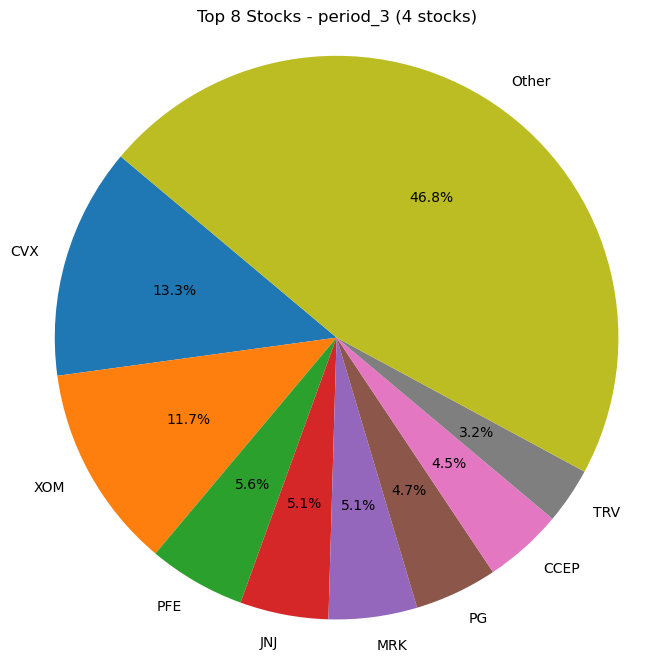

...

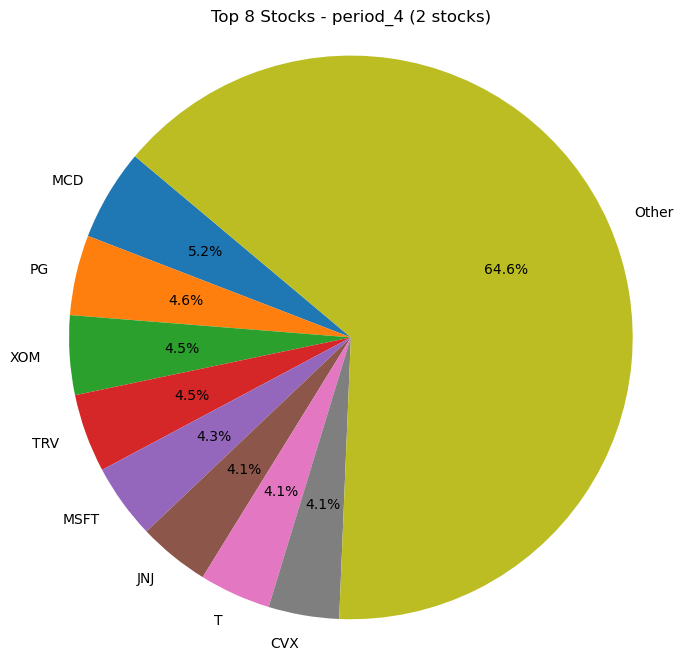

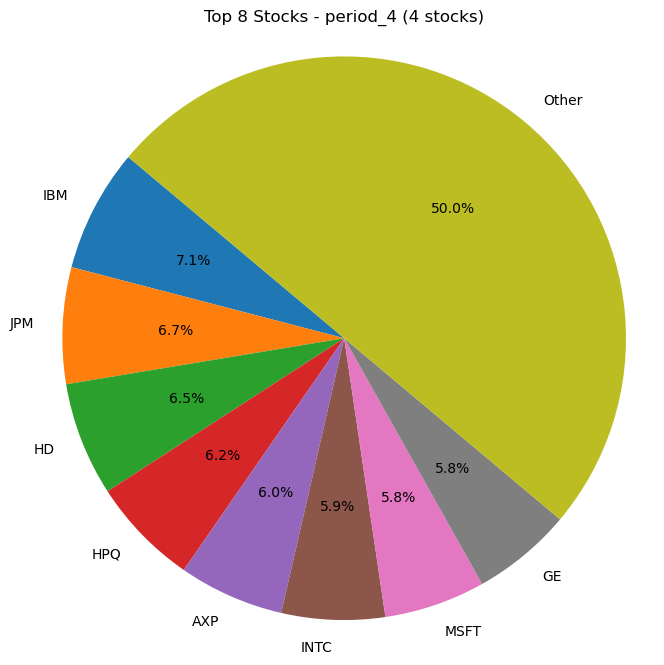

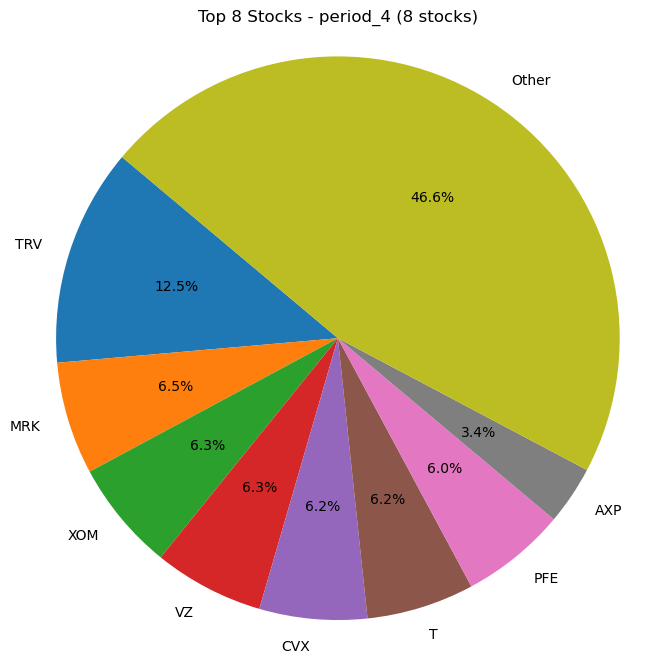

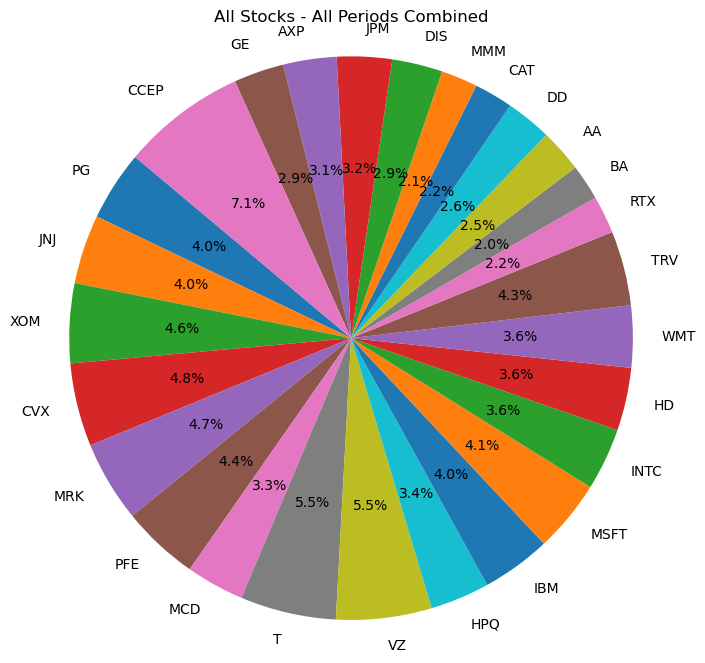

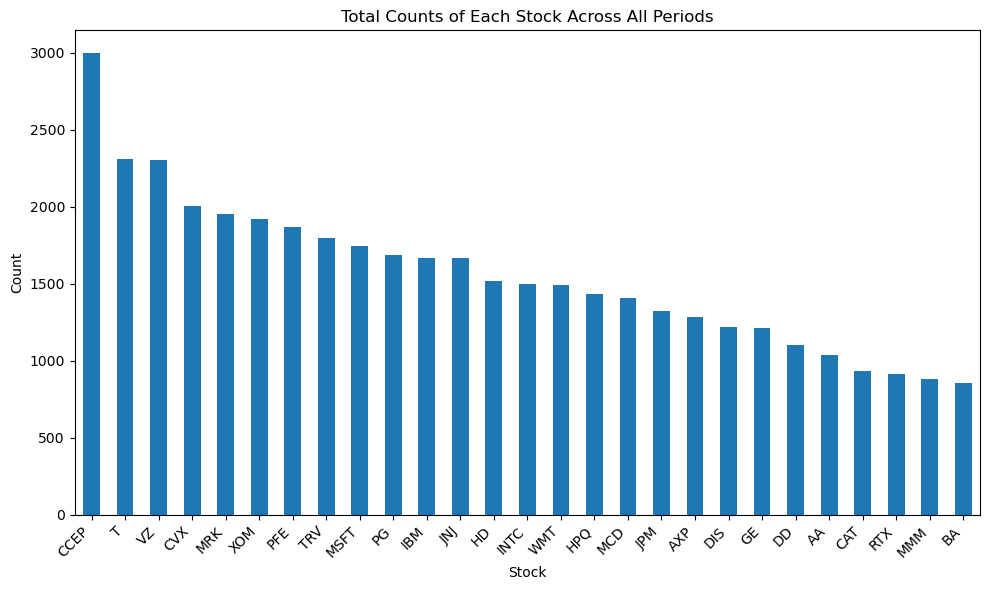

In [135]:
count_of_stocks(result_df_kmeans_rand_test1)

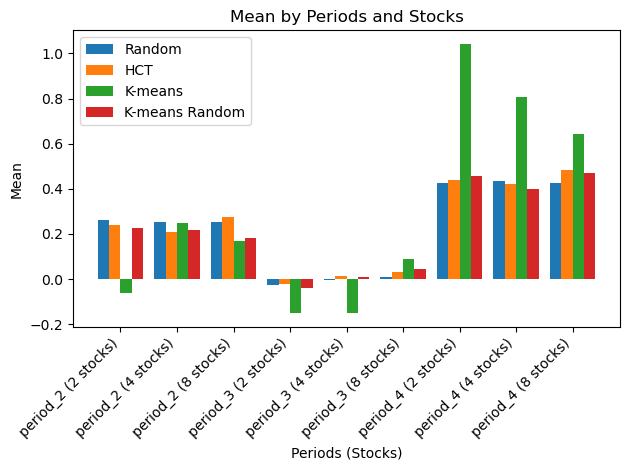

Total Average Mean of Random Values: 0.2252401875903115
Total Average Mean of Cluster Values: 0.23181291092756634
Total Average Mean of K-means Values: 0.2926489542719529
Total Average Mean of K-means Random Values: 0.2180510566666291

Period 1 Average Mean of Random Values: 0.2555143274271717
Period 1 Average Mean of Cluster Values: 0.24068516564143153
Period 1 Average Mean of K-means Values: 0.11793817789582188
Period 1 Average Mean of K-means Random Values: 0.20821337382229713
Period 2 Average Mean of Random Values: -0.007635374110515787
Period 2 Average Mean of Cluster Values: 0.0076734569713348385
Period 2 Average Mean of K-means Values: -0.07062491651807239
Period 2 Average Mean of K-means Random Values: 0.004154746125127259
Period 3 Average Mean of Random Values: 0.4278416094542787
Period 3 Average Mean of Cluster Values: 0.4470801101699327
Period 3 Average Mean of K-means Values: 0.8306336014381093
Period 3 Average Mean of K-means Random Values: 0.44178505005246294


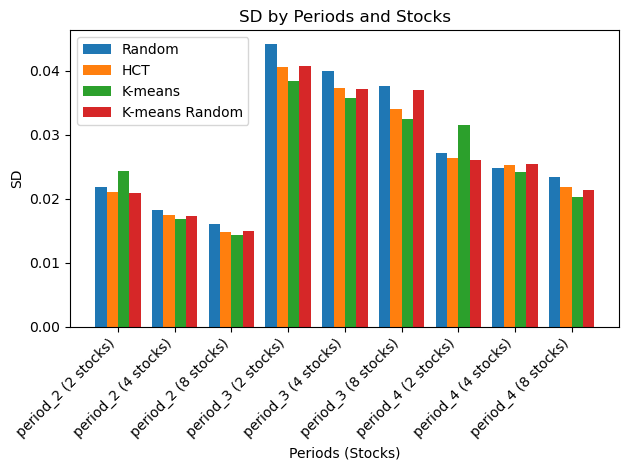

Total Average SD of Random Values: 0.028167210029143908
Total Average SD of Cluster Values: 0.026526530536430257
Total Average SD of K-means Values: 0.026459670122485436
Total Average SD of K-means Random Values: 0.02676328331729237

Period 1 Average SD of Random Values: 0.018714808027296543
Period 1 Average SD of Cluster Values: 0.017792546731641184
Period 1 Average SD of K-means Values: 0.01855469805148161
Period 1 Average SD of K-means Random Values: 0.017709704585054414
Period 2 Average SD of Random Values: 0.040592854586773176
Period 2 Average SD of Cluster Values: 0.037304952300862865
Period 2 Average SD of K-means Values: 0.03549403497453357
Period 2 Average SD of K-means Random Values: 0.03831112404947499
Period 3 Average SD of Random Values: 0.02519396747336201
Period 3 Average SD of Cluster Values: 0.024482092576786723
Period 3 Average SD of K-means Values: 0.025330277341441124
Period 3 Average SD of K-means Random Values: 0.024269021317347702


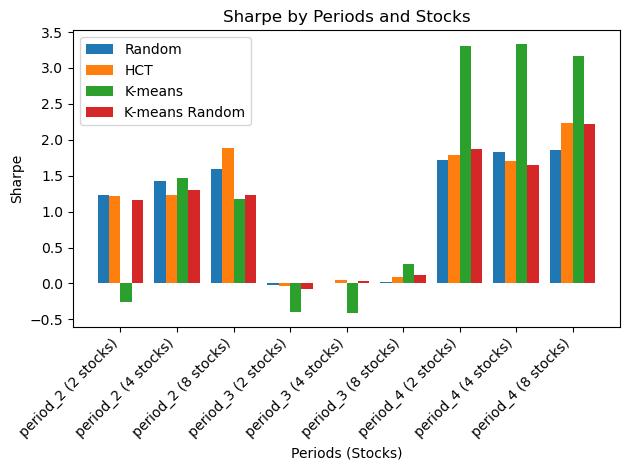

Total Average Sharpe of Random Values: 1.0745572845746905
Total Average Sharpe of Cluster Values: 1.1283155921534915
Total Average Sharpe of K-means Values: 1.294841795601902
Total Average Sharpe of K-means Random Values: 1.0566927023920796

Period 1 Average Sharpe of Random Values: 1.4178500467104878
Period 1 Average Sharpe of Cluster Values: 1.4403322448129912
Period 1 Average Sharpe of K-means Values: 0.7940217455068233
Period 1 Average Sharpe of K-means Random Values: 1.2312932774394096
Period 2 Average Sharpe of Random Values: 0.002141308110462066
Period 2 Average Sharpe of Cluster Values: 0.036980938936029197
Period 2 Average Sharpe of K-means Values: -0.1795400740314477
Period 2 Average Sharpe of K-means Random Values: 0.02694921346383623
Period 3 Average Sharpe of Random Values: 1.8036804989031212
Period 3 Average Sharpe of Cluster Values: 1.9076335927114538
Period 3 Average Sharpe of K-means Values: 3.270043715330331
Period 3 Average Sharpe of K-means Random Values: 1.91183561

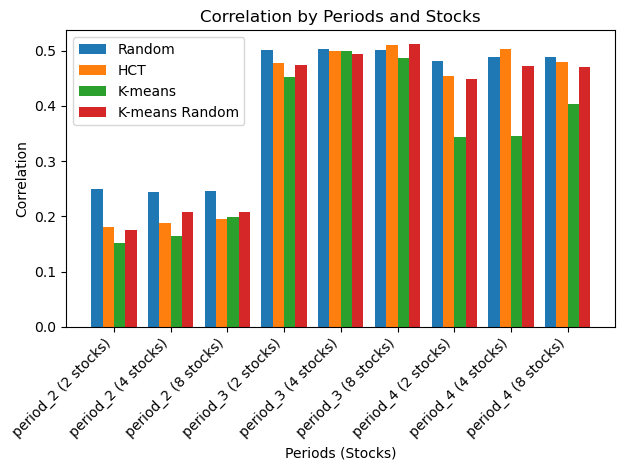

Total Average Correlation of Random Values: 0.4112938875868671
Total Average Correlation of Cluster Values: 0.387221351274237
Total Average Correlation of K-means Values: 0.3381464119004986
Total Average Correlation of K-means Random Values: 0.38442022080700683

Period 1 Average Correlation of Random Values: 0.24620823843943473
Period 1 Average Correlation of Cluster Values: 0.18756998919866605
Period 1 Average Correlation of K-means Values: 0.17144526439917826
Period 1 Average Correlation of K-means Random Values: 0.19699089691449934
Period 2 Average Correlation of Random Values: 0.5016386303928079
Period 2 Average Correlation of Cluster Values: 0.4952997581886618
Period 2 Average Correlation of K-means Values: 0.47881343253680814
Period 2 Average Correlation of K-means Random Values: 0.4929382883486803
Period 3 Average Correlation of Random Values: 0.48603479392835874
Period 3 Average Correlation of Cluster Values: 0.4787943064353833
Period 3 Average Correlation of K-means Values: 0.

In [136]:
# Plotting Mean
plot_metric('Mean',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric('SD',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

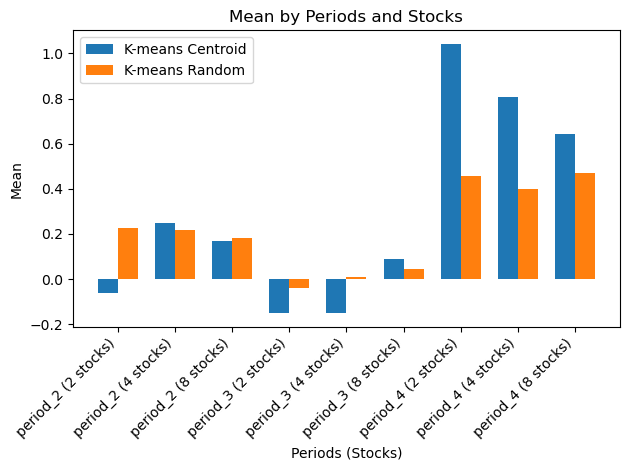

Total Average Mean of K-means Centroid Values: 0.2926489542719529
Total Average Mean of K-means Random Values: 0.2180510566666291

Period 1 Average Mean of K-means Centroid Values: 0.11793817789582188
Period 1 Average Mean of K-means Random Values: 0.20821337382229713
Period 2 Average Mean of K-means Centroid Values: -0.07062491651807239
Period 2 Average Mean of K-means Random Values: 0.004154746125127259
Period 3 Average Mean of K-means Centroid Values: 0.8306336014381093
Period 3 Average Mean of K-means Random Values: 0.44178505005246294


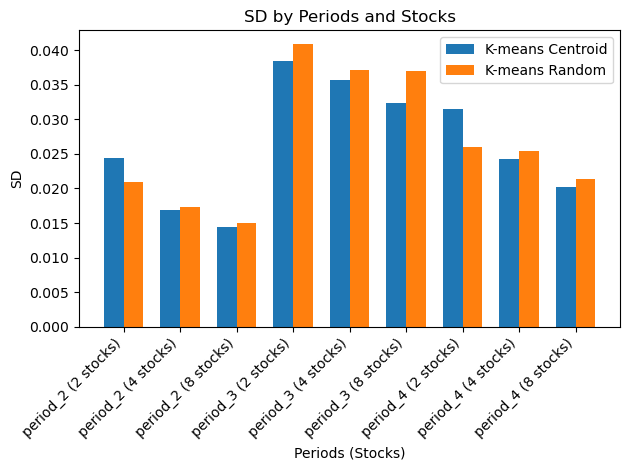

Total Average SD of K-means Centroid Values: 0.026459670122485436
Total Average SD of K-means Random Values: 0.02676328331729237

Period 1 Average SD of K-means Centroid Values: 0.01855469805148161
Period 1 Average SD of K-means Random Values: 0.017709704585054414
Period 2 Average SD of K-means Centroid Values: 0.03549403497453357
Period 2 Average SD of K-means Random Values: 0.03831112404947499
Period 3 Average SD of K-means Centroid Values: 0.025330277341441124
Period 3 Average SD of K-means Random Values: 0.024269021317347702


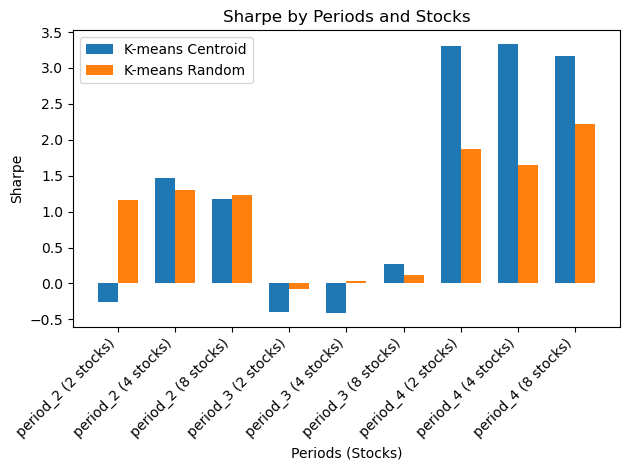

Total Average Sharpe of K-means Centroid Values: 1.294841795601902
Total Average Sharpe of K-means Random Values: 1.0566927023920796

Period 1 Average Sharpe of K-means Centroid Values: 0.7940217455068233
Period 1 Average Sharpe of K-means Random Values: 1.2312932774394096
Period 2 Average Sharpe of K-means Centroid Values: -0.1795400740314477
Period 2 Average Sharpe of K-means Random Values: 0.02694921346383623
Period 3 Average Sharpe of K-means Centroid Values: 3.270043715330331
Period 3 Average Sharpe of K-means Random Values: 1.9118356162729926


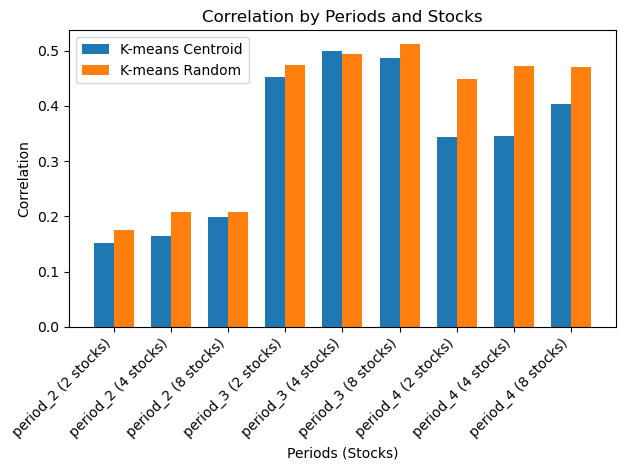

Total Average Correlation of K-means Centroid Values: 0.3381464119004986
Total Average Correlation of K-means Random Values: 0.38442022080700683

Period 1 Average Correlation of K-means Centroid Values: 0.17144526439917826
Period 1 Average Correlation of K-means Random Values: 0.19699089691449934
Period 2 Average Correlation of K-means Centroid Values: 0.47881343253680814
Period 2 Average Correlation of K-means Random Values: 0.4929382883486803
Period 3 Average Correlation of K-means Centroid Values: 0.36418053876550927
Period 3 Average Correlation of K-means Random Values: 0.46333147715784073


In [142]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test1,result_df_kmeans_rand_test1)